# Fitting a model of stochastic state transitions to NMF usage dynamics in clones

**This script carries out the following tasks:**

1. Runs stochastic simulations with different transition rate parameters, and save the simlation time series results to file. The model is a 2-state "on/off" model per cell, with clonal growth.

2. Train a neural network to predict stochastic simulation results, and in doing so generate a model that predicts the distribution of cells in on/off states over time for any parameter (interpolating). This uses pytorch.

3. Run MCMC using pyMC to fit parameters to the data for every program across clones

In [218]:

# Using Allon's conda environment pymc_arm, python 3.10
# PyMC on my mac requires an arm64 environment, so I'm using the pymc_arm environment
# How I built this:
# # 1. Create a new conda environment for `arm64`
# CONDA_SUBDIR=osx-arm64 conda create -n pymc_arm python=3.10
# conda activate pymc_arm
# # 2. Install PyMC with `arm64` support
# CONDA_SUBDIR=osx-arm64 conda install -c conda-forge pymc
# # 3. Verify architecture (should return 'arm64')
# python -c "import platform; print(platform.platform())"


# Configure PyTensor first, before any other imports
import os
import numpy as np
import pandas as pd
import pytensor
pytensor.config.floatX = "float64"
import arviz as az


import numpy as np
import pandas as pd
from tqdm import tqdm
import pickle
from typing import List, Tuple, Dict, Any  # Make sure typing import is complete
import matplotlib.pyplot as plt
import seaborn as sns

# Add helper_functions to path
from pathlib import Path
import sys
import importlib
helper_path = str(Path().absolute() / 'helper_functions')
if helper_path not in sys.path:
    sys.path.append(helper_path)

# Import my functions specific to this project:
import state_simulations_1D_v1 as ss1D
import MCMC_1D_training_data_tasks as mcmc1D_training_data
import MCMC_1D_surrogate_model_tasks as mcmc1D_surrogate
#import MCMC_1D_pyMC_tasks as mcmc1D_pyMC
import MCMC_1D_pyMC_cont_plots as mcmc_plots
import plotting as hp


cache_file_path = './MCMC_data/1D_model_param_grid_cache.pkl'
surrogate_model_save_path = './MCMC_data/saved_1D_surrogate_models_d2_4_6'
#results_file = './MCMC_data/mcmc_resultsOLD.csv' # not used
cell_type = 'k562'
cont_results_file = f'./MCMC_data/mcmc_results_{cell_type}.csv'





## Generate training data for the MCMC 1D model, using simulations

In [11]:
# Adding this to allow constant reloads after making changes:
mcmc1D_training_data = importlib.reload(mcmc1D_training_data)

divisions = [0, 2, 4, 6]
n_sims = 4000 # Eventual number of simulations should be higher than this
q_min = 1e-4
q_max = 0.95
n_grid = 40

init0_dfs, init1_dfs = mcmc1D_training_data.get_parameter_grid_simulations(
    divisions, n_sims, q_min, q_max, n_grid, cache_file=cache_file_path)




Using cached results.


### Visualize the mean and std of the model over the parameters from the simulations

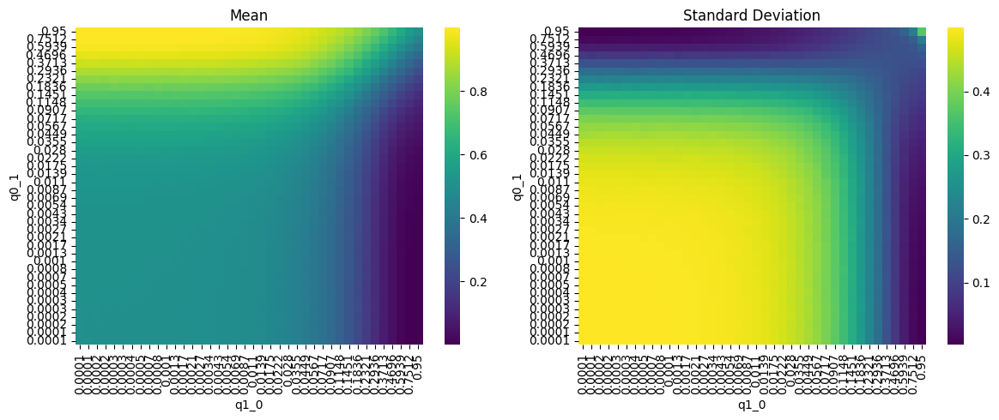

,q0_1,q1_0,mean,std
0,0.0001,0.000100,0.499891,0.499766
1,0.0001,0.000126,0.500055,0.499610
2,0.0001,0.000160,0.499852,0.499562
3,0.0001,0.000202,0.499898,0.499523
4,0.0001,0.000256,0.499625,0.499484
...,...,...,...,...
1595,0.9500,0.371323,0.716063,0.119331
1596,0.9500,0.469618,0.663578,0.133464
1597,0.9500,0.593933,0.602867,0.154161
1598,0.9500,0.751157,0.545172,0.211439


In [12]:
mcmc1D_training_data = importlib.reload(mcmc1D_training_data)
t=4
p0 = 0.5
mcmc1D_training_data.mean_and_std_over_params((1-p0)*init1_dfs[t]+p0*init0_dfs[t], show_heatmaps=True)

## Train a smooth model on the probability distribution from the simulations

### Train and test the model on a single division number


Fold 1/5
Epoch 10/100
Train Loss: 0.000267
Val Loss: 0.000227
Epoch 20/100
Train Loss: 0.000122
Val Loss: 0.000108
Epoch 30/100
Train Loss: 0.000098
Val Loss: 0.000080
Epoch 40/100
Train Loss: 0.000086
Val Loss: 0.000078
Epoch 50/100
Train Loss: 0.000076
Val Loss: 0.000065
Epoch 60/100
Train Loss: 0.000078
Val Loss: 0.000059
Epoch 70/100
Train Loss: 0.000070
Val Loss: 0.000061
Epoch 80/100
Train Loss: 0.000085
Val Loss: 0.000061
Epoch 90/100
Train Loss: 0.000066
Val Loss: 0.000050
Epoch 100/100
Train Loss: 0.000058
Val Loss: 0.000048
Fold 2/5
Epoch 10/100
Train Loss: 0.000055
Val Loss: 0.000046
Epoch 20/100
Train Loss: 0.000052
Val Loss: 0.000042
Epoch 30/100
Train Loss: 0.000048
Val Loss: 0.000040
Epoch 40/100
Train Loss: 0.000044
Val Loss: 0.000035
Epoch 50/100
Train Loss: 0.000041
Val Loss: 0.000032
Epoch 60/100
Train Loss: 0.000040
Val Loss: 0.000047
Early stopping at epoch 65
Fold 3/5
Epoch 10/100
Train Loss: 0.000039
Val Loss: 0.000026
Epoch 20/100
Train Loss: 0.000035
Val Loss: 

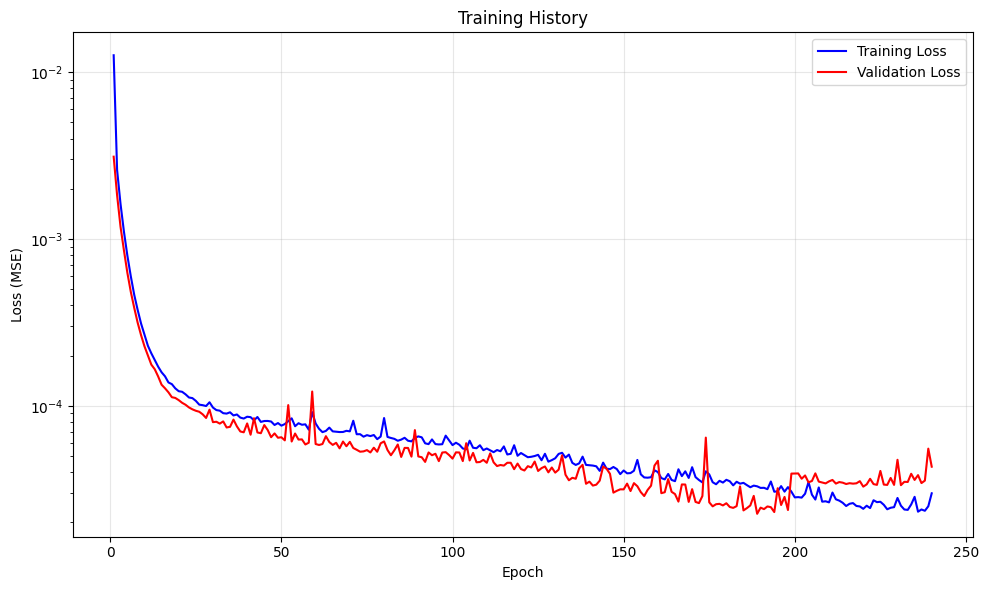

In [13]:
import MCMC_1D_surrogate_model_tasks as mcmc1D_surrogate
mcmc1D_surrogate = importlib.reload(mcmc1D_surrogate)

# Load data from cache
with open(cache_file_path, 'rb') as f:
    cache = pickle.load(f)
    divisions = cache['divisions']
    init0_dfs = cache['init0_dfs']
    init1_dfs = cache['init1_dfs']  


# Create and train one model: one division number, one initial condition
div_number = 4  # example
model = mcmc1D_surrogate.SurrogateModel(
    hidden_layers=[64, 32],
    learning_rate=1e-3,
    batch_size=32,
    n_epochs=100,
    n_folds=5,
    patience=10
)
# Train the model
history = model.train(init0_dfs[div_number], init1_dfs[div_number])

# Examine the training history
model.plot_history()


#### Spot-check the model output by comparing to the simulations:

Test 1: Plot a random prediction with its neighbors
Test 2: Plot an interpolation of the model predictions over the parameter space between two training points


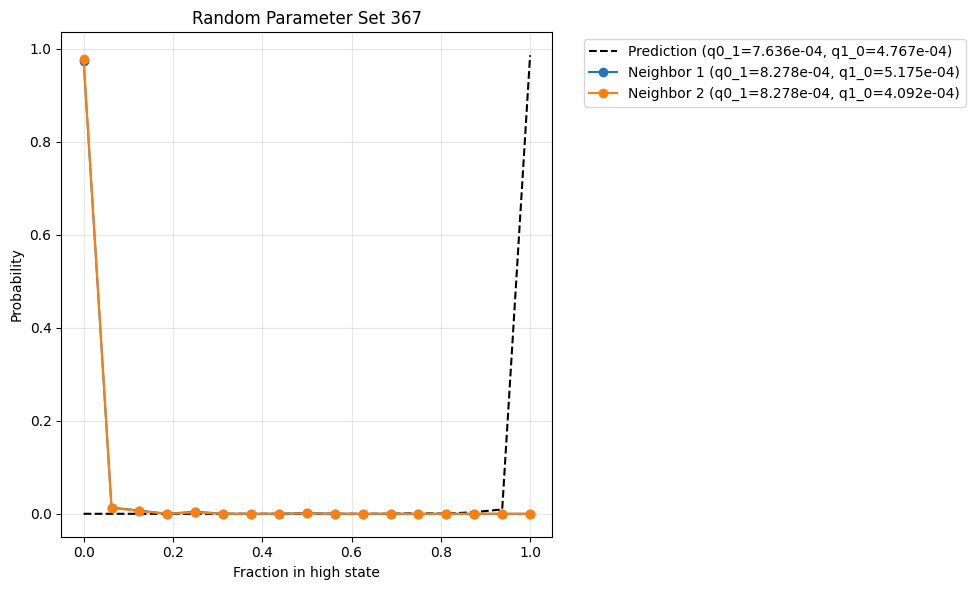

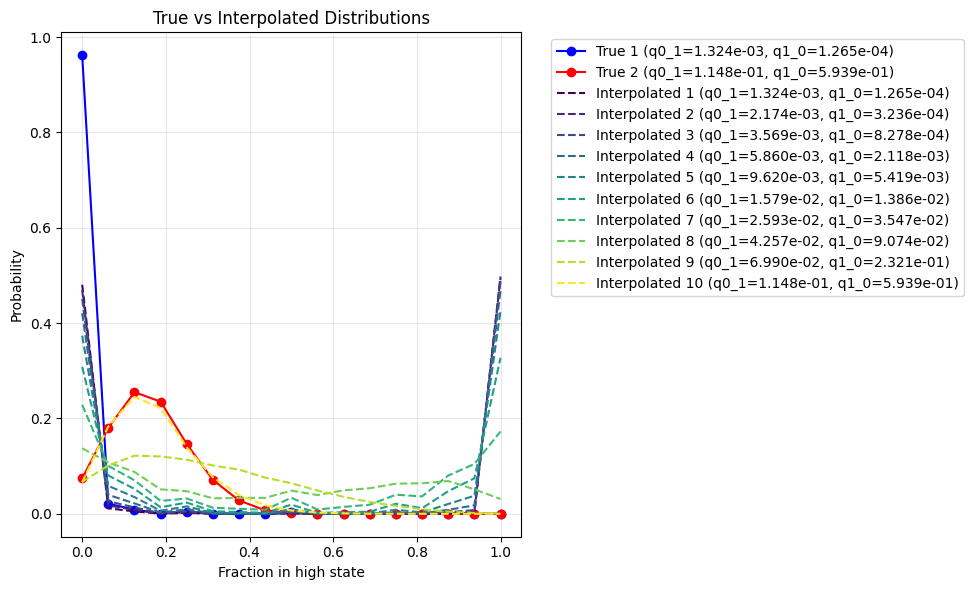

In [14]:
mcmc1D_surrogate = importlib.reload(mcmc1D_surrogate)
model.plot_random_prediction_with_neighbors(init0_dfs[div_number])
plt.show()

model.plot_model_predictions(init0_dfs[div_number],figsize= (10, 6))
plt.show()


#### Make predictions over a grid of parameters that are offset from the training grid, and generate meand and std heatmaps. 

Compare to plots above

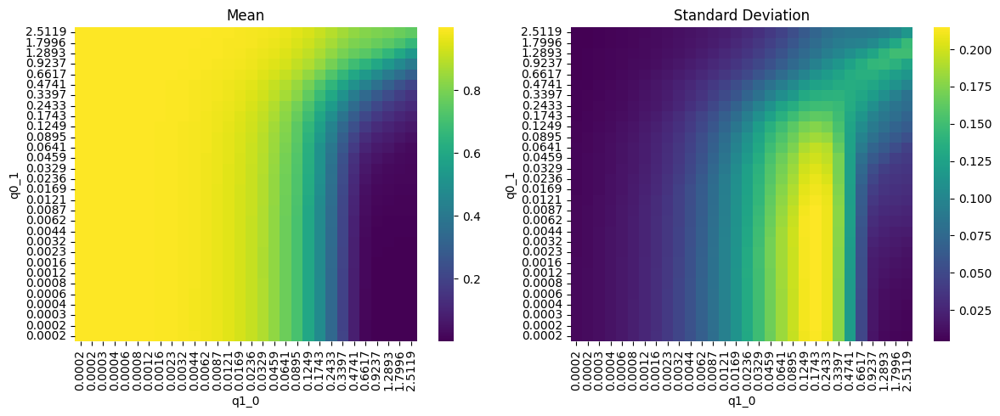

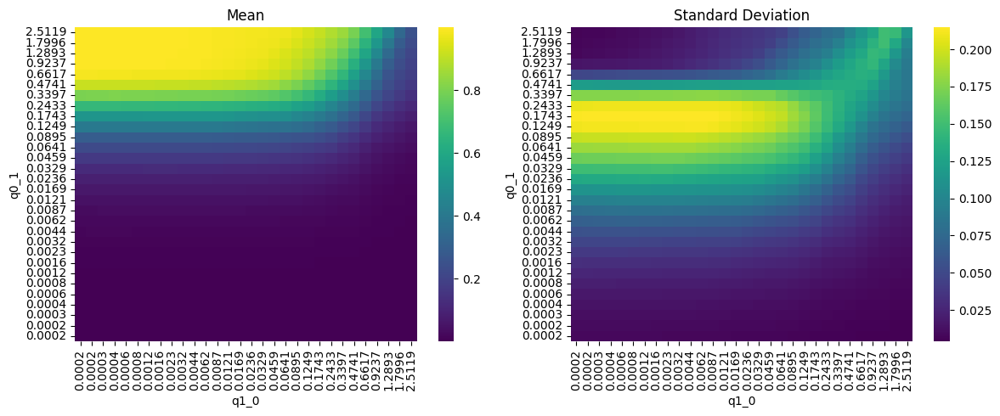

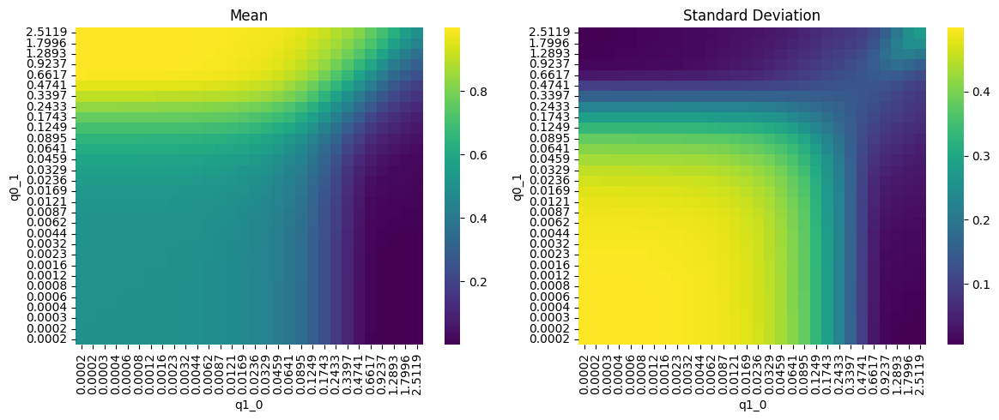

,q0_1,q1_0,mean,std
0,0.000158,0.000158,0.500000,0.499562
1,0.000158,0.000221,0.499905,0.499484
2,0.000158,0.000309,0.499774,0.499377
3,0.000158,0.000431,0.499588,0.499225
4,0.000158,0.000602,0.499307,0.498997
...,...,...,...,...
895,2.511886,0.661743,0.755890,0.117944
896,2.511886,0.923671,0.696021,0.153393
897,2.511886,1.289273,0.628880,0.203139
898,2.511886,1.799585,0.554055,0.252116


In [15]:
# Make predictions
new_parameters = np.array([[q0_1, q1_0] for q0_1 in np.logspace(-3.8, 0.4, 30) 
                                       for q1_0 in np.logspace(-3.8, 0.4, 30)])
#predictions = model.predict(new_parameters)
df_pred = model.predict_df(parameters=new_parameters, q0=0.0)
mcmc1D_training_data.mean_and_std_over_params(df_pred, show_heatmaps=True)
df_pred = model.predict_df(parameters=new_parameters, q0=1.0)
mcmc1D_training_data.mean_and_std_over_params(df_pred, show_heatmaps=True)
df_pred = model.predict_df(parameters=new_parameters, q0=0.5)
mcmc1D_training_data.mean_and_std_over_params(df_pred, show_heatmaps=True)


### Generate trained models for all divisions, and save them for use in the PyMC code

Fold 1/5
Fold 2/5
Fold 3/5
Fold 4/5
Fold 5/5


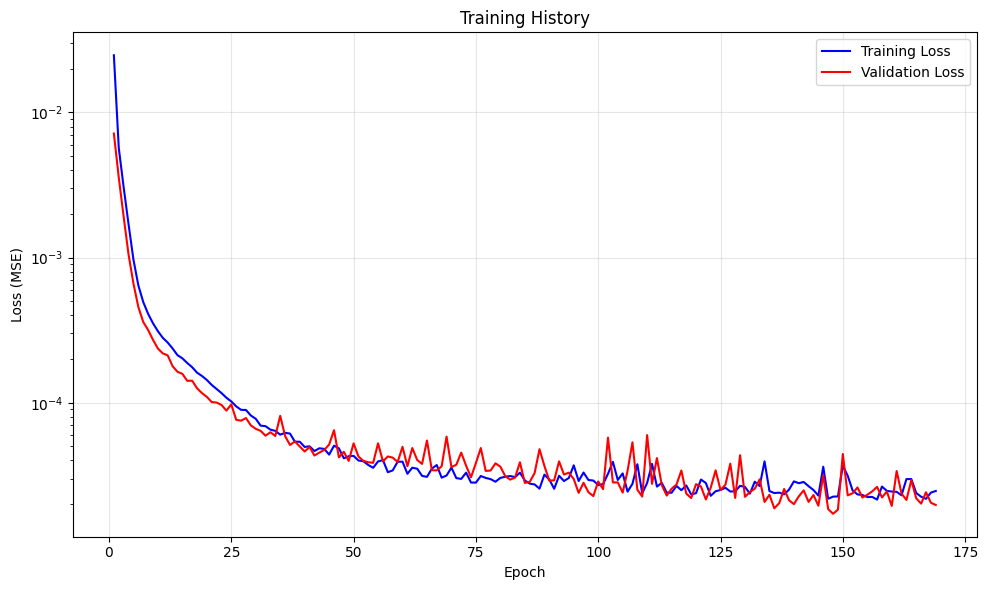

Fold 1/5
Fold 2/5
Fold 3/5
Fold 4/5
Fold 5/5


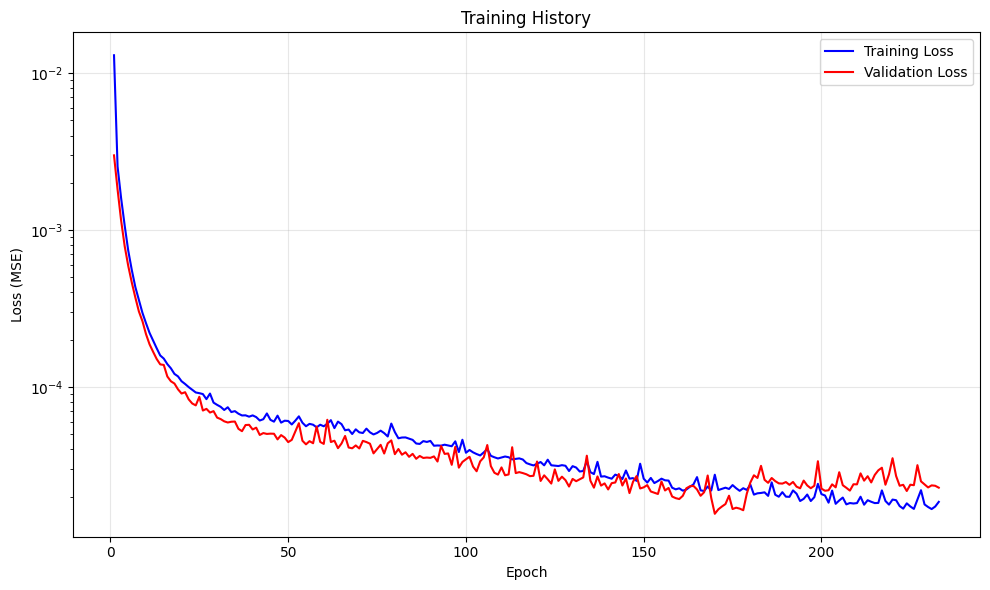

Fold 1/5
Fold 2/5
Fold 3/5
Fold 4/5


KeyboardInterrupt: 

In [16]:
import MCMC_1D_surrogate_model_tasks as mcmc1D_surrogate
mcmc1D_surrogate = importlib.reload(mcmc1D_surrogate)


# Load data from cache
with open(cache_file_path, 'rb') as f:
    cache = pickle.load(f)
    divisions = cache['divisions']
    init0_dfs = cache['init0_dfs']
    init1_dfs = cache['init1_dfs']  


# Create and train all models
model_dict = {}
for d in [2,4,6]:

    model_dict[d] = mcmc1D_surrogate.SurrogateModel(
        hidden_layers=[64, 32],
        learning_rate=1e-3,
        batch_size=32,
        n_epochs=100,
        n_folds=5,
        patience=10
    )
    # Train the model
    history = model_dict[d].train(
        init0_dfs[d], 
        init1_dfs[d],
        verbose=False
    )

    # Examine the training history
    model_dict[d].plot_history()

# Save the models:
mcmc1D_surrogate.save_model_dict(model_dict, surrogate_model_save_path)


In [4]:

# Load all models later
model_dict = mcmc1D_surrogate.load_model_dict(surrogate_model_save_path)


## PyMC fitting with complete NMF score data

### Test the continuous model with mock data

/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

a_init: -3.2544728921652135
sigma_init: 2.4590026731801853
About to start sampling
Initial value for log_S: -3.7318106216807703
Initial value for log_r: -3.902603200910883
Initial value for S: 0.023949433192701614
Initial value for r: 0.02018928621023982
Initial value for p0: 0.6174334422251002
Initial value for threshold: 0.0013293330082426796
Initial value for a: -5.819778905143899
Initial value for sigma: 7.299244171840907
Initial value for q01: 0.0231965985748031
Initial value for q10: 0.0004683227677307408
Initial value for r01: 0.023475480007899372
Initial value for r10: 0.0004739531848022433
Initial value for likelihood: -5027.854576798098
Calling pm.sample


Multiprocess sampling (6 chains in 6 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]


Output()

Sampling 6 chains for 1_000 tune and 800 draw iterations (6_000 + 4_800 draws total) took 24 seconds.
The rhat statistic is larger than 1.01 for some parameters. This indicates problems during sampling. See https://arxiv.org/abs/1903.08008 for details
The effective sample size per chain is smaller than 100 for some parameters.  A higher number is needed for reliable rhat and ess computation. See https://arxiv.org/abs/1903.08008 for details



Parameter Estimates:
--------------------------------------------------


<Figure size 1200x1200 with 0 Axes>

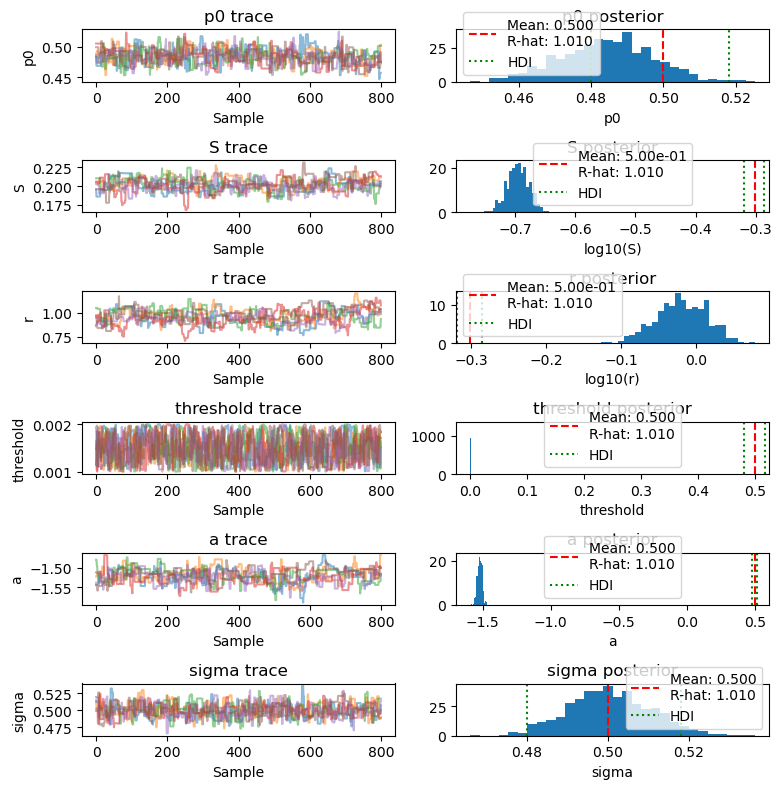

<Figure size 700x700 with 0 Axes>

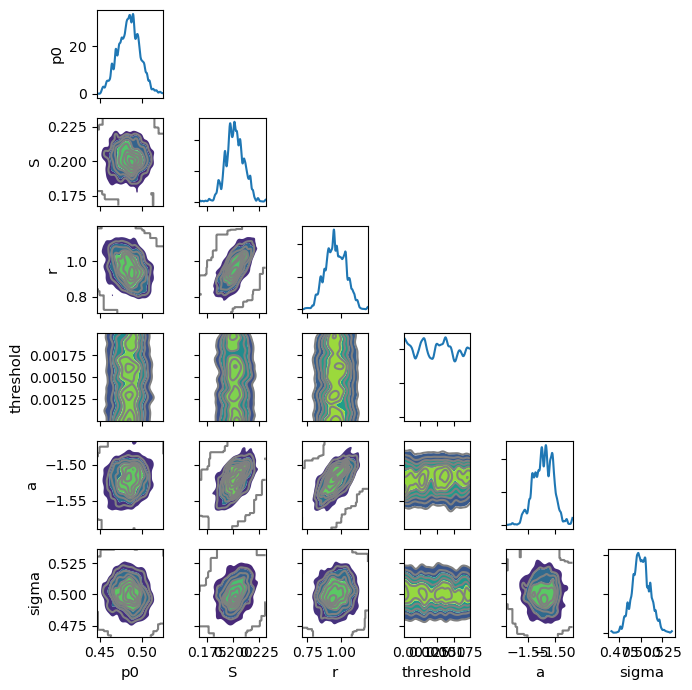

<Figure size 1200x800 with 0 Axes>

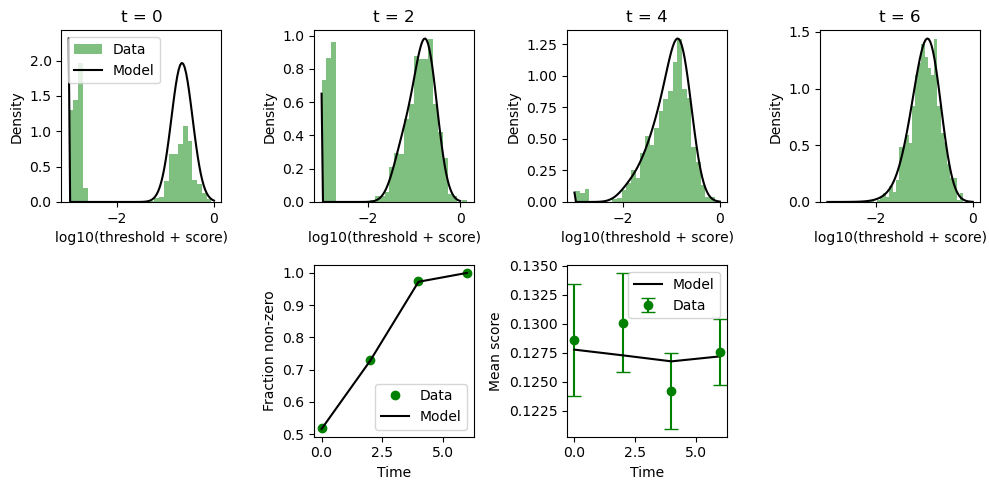


True vs Inferred Parameters:
--------------------------------------------------
p0:
  True: 5.000e-01
  Est:  4.840e-01
S:
  True: 2.000e-01
  Est:  2.020e-01
r:
  True: 1.000e+00
  Est:  9.590e-01
threshold:
  True: 1.000e-03
  Est:  1.000e-03
a:
  True: -1.500e+00
  Est:  -1.521e+00
sigma:
  True: 5.000e-01
  Est:  5.000e-01


In [45]:
import MCMC_1D_pyMC_cont_tasks as mcmc1Dcont_pyMC
mcmc1Dcont_pyMC = importlib.reload(mcmc1Dcont_pyMC)

surrogate_model_path = './MCMC_data/saved_1D_surrogate_models_d2_4_6'

# Initialize the inference object with surrogate models
mcmc = mcmc1Dcont_pyMC.MCMCInference(surrogate_model_path=surrogate_model_path)

# Generate mock data with defualt parameters
true_params = {'r01': 0.1,
                'r10': 0.1,
                'p0': 0.5,
                'threshold': 1e-3,
                'a': -1.5,
                'sigma': 0.5}
mock_data = mcmc.create_mock_data(
    r01=true_params['r01'],
    r10=true_params['r10'],
    p0=true_params['p0'],
    threshold=true_params['threshold'],
    a=true_params['a'],
    sigma=true_params['sigma'],
    n_colonies=1000 # per timepoint
)

# Load the mock data
mcmc.load_data(mock_data)

# Setup and run MCMC
mcmc.setup_model()
mcmc.run_inference(
    draws=800,
    tune=1000,
    chains=6,
    cores=6
)

# Plot diagnostics
plt.figure(figsize=(12, 12))
mcmc.plot_diagnostics()
plt.show()

# Plot predictions vs data
plt.figure(figsize=(12, 8))
mcmc.plot_predictions()
plt.show()


print("\nTrue vs Inferred Parameters:")
print("-" * 50)
summary = az.summary(mcmc.trace)
for param in ['p0', 'S', 'r', 'threshold', 'a', 'sigma']:
    if param == 'S':
        true_val = true_params['r01'] + true_params['r10']
    elif param == 'r':
        true_val = true_params['r10'] / true_params['r01']
    else:
        true_val = true_params[param]
    
    est_val = float(summary.loc[param, 'mean'])
    print(f"{param}:")
    print(f"  True: {true_val:.3e}")
    print(f"  Est:  {est_val:.3e}")

In [46]:

# mcmc1Dcont_pyMC = importlib.reload(mcmc1Dcont_pyMC)
# mcmc.plot_predictions = mcmc1Dcont_pyMC.MCMCInference.plot_predictions.__get__(mcmc)
# mcmc.plot_predictions()
# plt.show()


### Load some data and fit the model

In [5]:
mcmc_dict = {}

# Initialize or load results_df:
if os.path.exists(cont_results_file):
    cont_results_df = pd.read_csv(cont_results_file)
    ## Remove existing row with same program_id and condition if it exists
    #cont_results_df = cont_results_df.loc[~((cont_results_df['program_id'] == f1[0]) & 
    #                             (cont_results_df['condition'] == cond))]
else:
    cont_results_df = pd.DataFrame()

Loaded NMF data for l1210...
Processing Ctrl-NMF0...
Isolated NMF data for l1210, Ctrl, NMF_0...
a_init: -2.904611656877967
sigma_init: 1.194381750045856


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.2120 ± 0.0093 (R-hat: 1.004)
S: 0.2941 ± 0.0072 (R-hat: 1.006)
r: 99.8991 ± 0.2809 (R-hat: 1.003)
threshold: 0.0005 ± 0.0000 (R-hat: 1.456)
a: -2.2378 ± 0.0266 (R-hat: 1.010)
sigma: 0.8452 ± 0.0178 (R-hat: 1.035)
bb: 1.1135 ± 0.0182 (R-hat: 1.011)
s_min: 0.0105 ± 0.0249 (R-hat: 1.002)
Processing Aza-NMF0...
Isolated NMF data for l1210, Aza, NMF_0...
a_init: -3.2679718138403073
sigma_init: 1.0842201295886515


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.2253 ± 0.0317 (R-hat: 1.299)
S: 0.1705 ± 0.1418 (R-hat: 1.307)
r: 90.6452 ± 72.2507 (R-hat: 1.297)
threshold: 0.0005 ± 0.0000 (R-hat: 1.005)
a: -2.8430 ± 0.1374 (R-hat: 1.311)
sigma: 1.0381 ± 0.3185 (R-hat: 1.306)
bb: 1.0018 ± 0.0056 (R-hat: 1.201)
s_min: 0.1172 ± 0.6915 (R-hat: 1.303)
Processing Dec-NMF0...
Isolated NMF data for l1210, Dec, NMF_0...
a_init: -3.4396935403510525
sigma_init: 1.1843802622123403


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.3629 ± 0.0254 (R-hat: 1.281)
S: 0.1447 ± 0.1178 (R-hat: 1.329)
r: 74.1605 ± 78.9896 (R-hat: 1.308)
threshold: 0.0005 ± 0.0000 (R-hat: 1.004)
a: -3.1617 ± 0.1532 (R-hat: 1.344)
sigma: 1.2342 ± 0.2437 (R-hat: 1.320)
bb: 1.0008 ± 0.0024 (R-hat: 1.052)
s_min: 0.1511 ± 0.6532 (R-hat: 1.312)
Processing Vor-NMF0...
Isolated NMF data for l1210, Vor, NMF_0...
a_init: -3.2588069662363974
sigma_init: 1.1996994551097047


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.3420 ± 0.0458 (R-hat: 1.645)
S: 0.0893 ± 0.0995 (R-hat: 1.654)
r: 30.9627 ± 81.4009 (R-hat: 1.654)
threshold: 0.0005 ± 0.0000 (R-hat: 1.007)
a: -3.5213 ± 0.1863 (R-hat: 1.662)
sigma: 1.0076 ± 0.1522 (R-hat: 1.713)
bb: 1.3786 ± 0.2935 (R-hat: 1.702)
s_min: 0.2038 ± 0.3569 (R-hat: 1.687)
Processing Ctrl-NMF1...
Isolated NMF data for l1210, Ctrl, NMF_1...
a_init: -2.8727363804756805
sigma_init: 0.9675368449318891


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.1544 ± 0.0260 (R-hat: 2.055)
S: 0.1331 ± 0.0707 (R-hat: 2.084)
r: 15.7116 ± 11.2629 (R-hat: 2.055)
threshold: 0.0005 ± 0.0000 (R-hat: 1.004)
a: -3.2978 ± 0.0725 (R-hat: 1.629)
sigma: 0.8164 ± 0.0779 (R-hat: 2.062)
bb: 1.4020 ± 0.1444 (R-hat: 2.095)
s_min: 0.2668 ± 0.2631 (R-hat: 2.089)
Processing Aza-NMF1...
Isolated NMF data for l1210, Aza, NMF_1...
a_init: -2.472238622135699
sigma_init: 0.8762575971164108


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.2612 ± 0.0197 (R-hat: 1.071)
S: 0.2884 ± 0.0661 (R-hat: 1.159)
r: 0.4593 ± 0.1590 (R-hat: 1.219)
threshold: 0.0005 ± 0.0000 (R-hat: 1.002)
a: -3.2241 ± 0.0396 (R-hat: 1.098)
sigma: 0.9103 ± 0.0313 (R-hat: 1.164)
bb: 1.3413 ± 0.0479 (R-hat: 1.314)
s_min: 0.0688 ± 0.0798 (R-hat: 1.198)
Processing Dec-NMF1...
Isolated NMF data for l1210, Dec, NMF_1...
a_init: -2.273475776755699
sigma_init: 0.9805885357722887


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.4538 ± 0.1260 (R-hat: 1.305)
S: 0.4662 ± 1.7225 (R-hat: 1.302)
r: 0.0559 ± 0.3397 (R-hat: 1.308)
threshold: 0.0006 ± 0.0002 (R-hat: 1.045)
a: -3.1897 ± 0.0668 (R-hat: 1.275)
sigma: 1.1274 ± 0.0996 (R-hat: 1.332)
bb: 1.2539 ± 0.0617 (R-hat: 1.408)
s_min: 0.0212 ± 0.0466 (R-hat: 1.007)
Processing Vor-NMF1...
Isolated NMF data for l1210, Vor, NMF_1...
a_init: -3.0271761154445733
sigma_init: 1.1887585346203577


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.3900 ± 0.0246 (R-hat: 1.004)
S: 0.1110 ± 0.0195 (R-hat: 1.047)
r: 9.3218 ± 4.3045 (R-hat: 1.009)
threshold: 0.0005 ± 0.0001 (R-hat: 1.004)
a: -3.3447 ± 0.1023 (R-hat: 1.021)
sigma: 1.0382 ± 0.0751 (R-hat: 1.012)
bb: 1.3808 ± 0.0693 (R-hat: 1.042)
s_min: 0.4124 ± 0.0949 (R-hat: 1.026)
Processing Ctrl-NMF2...
Isolated NMF data for l1210, Ctrl, NMF_2...
a_init: -4.216984916051857
sigma_init: 1.1880864569040768


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.4381 ± 0.0088 (R-hat: 1.053)
S: 0.0844 ± 0.0456 (R-hat: 1.430)
r: 99.6824 ± 0.9286 (R-hat: 1.052)
threshold: 0.0005 ± 0.0000 (R-hat: 1.005)
a: -3.7541 ± 0.0527 (R-hat: 1.077)
sigma: 0.8298 ± 0.1673 (R-hat: 1.385)
bb: 1.0056 ± 0.0177 (R-hat: 1.221)
s_min: 0.7785 ± 0.1256 (R-hat: 1.430)
Processing Aza-NMF2...
Isolated NMF data for l1210, Aza, NMF_2...
a_init: -2.440101881244329
sigma_init: 0.7553374338449391


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.0318 ± 0.0263 (R-hat: 2.188)
S: 2.4890 ± 4.2908 (R-hat: 2.315)
r: 1.5436 ± 2.7870 (R-hat: 2.650)
threshold: 0.0010 ± 0.0008 (R-hat: 1.647)
a: -2.7603 ± 0.4901 (R-hat: 1.811)
sigma: 0.8259 ± 0.1926 (R-hat: 1.702)
bb: 1.2949 ± 0.0926 (R-hat: 1.848)
s_min: 0.0038 ± 0.0089 (R-hat: 1.006)


/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/arviz/plots/backends/matplotlib/pairplot.py:262: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(
/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_pyMC_cont_tasks.py:546: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs = plt.subplots(2, 4, figsize=figsize)


Processing Dec-NMF2...
Isolated NMF data for l1210, Dec, NMF_2...
a_init: -1.6660614588672744
sigma_init: 0.47329525553595997


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.0072 ± 0.0123 (R-hat: 1.703)
S: 0.5279 ± 0.6977 (R-hat: 1.728)
r: 0.8365 ± 0.3615 (R-hat: 1.773)
threshold: 0.0033 ± 0.0015 (R-hat: 1.024)
a: -1.5172 ± 0.1657 (R-hat: 1.737)
sigma: 0.5664 ± 0.0539 (R-hat: 1.706)
bb: 1.0454 ± 0.0869 (R-hat: 1.773)
s_min: 0.0599 ± 0.1145 (R-hat: 1.698)


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_pyMC_cont_tasks.py:433: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)


Processing Vor-NMF2...
Isolated NMF data for l1210, Vor, NMF_2...
a_init: -4.364488159949593
sigma_init: 1.1198246650798016


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.5415 ± 0.0229 (R-hat: 1.004)
S: 0.1809 ± 0.0281 (R-hat: 1.032)
r: 98.9995 ± 2.8243 (R-hat: 1.002)
threshold: 0.0005 ± 0.0000 (R-hat: 1.006)
a: -4.2906 ± 0.1132 (R-hat: 1.031)
sigma: 1.0005 ± 0.0884 (R-hat: 1.023)
bb: 1.2567 ± 0.0809 (R-hat: 1.035)
s_min: 0.2191 ± 0.2695 (R-hat: 1.035)
Processing Ctrl-NMF3...
Isolated NMF data for l1210, Ctrl, NMF_3...
a_init: -3.398400991502904
sigma_init: 1.045414427752323


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.2650 ± 0.0084 (R-hat: 1.006)
S: 0.2066 ± 0.0044 (R-hat: 1.015)
r: 99.8173 ± 0.5161 (R-hat: 1.002)
threshold: 0.0005 ± 0.0000 (R-hat: 1.006)
a: -3.5177 ± 0.0285 (R-hat: 1.010)
sigma: 0.8180 ± 0.0195 (R-hat: 1.008)
bb: 1.4584 ± 0.0147 (R-hat: 1.020)
s_min: 0.0091 ± 0.0212 (R-hat: 1.003)
Processing Aza-NMF3...
Isolated NMF data for l1210, Aza, NMF_3...
a_init: -3.214120211062691
sigma_init: 0.9890387253754317


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.1243 ± 0.0585 (R-hat: 1.312)
S: 0.2091 ± 0.1878 (R-hat: 1.338)
r: 90.3644 ± 74.7937 (R-hat: 1.299)
threshold: 0.0005 ± 0.0000 (R-hat: 1.009)
a: -2.8803 ± 0.1582 (R-hat: 1.325)
sigma: 0.7795 ± 0.3850 (R-hat: 1.320)
bb: 1.2168 ± 0.2612 (R-hat: 1.354)
s_min: 0.2084 ± 0.6316 (R-hat: 1.335)
Processing Dec-NMF3...
Isolated NMF data for l1210, Dec, NMF_3...
a_init: -2.972099549662759
sigma_init: 0.9101268299039232


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.2175 ± 0.0317 (R-hat: 1.633)
S: 0.1536 ± 0.1149 (R-hat: 1.655)
r: 1.6700 ± 1.0634 (R-hat: 1.650)
threshold: 0.0005 ± 0.0001 (R-hat: 1.084)
a: -3.1283 ± 0.1350 (R-hat: 1.754)
sigma: 1.0784 ± 0.0764 (R-hat: 1.685)
bb: 1.1387 ± 0.1784 (R-hat: 1.770)
s_min: 0.2246 ± 0.1932 (R-hat: 1.647)
Processing Vor-NMF3...
Isolated NMF data for l1210, Vor, NMF_3...
a_init: -3.140018267810698
sigma_init: 1.22156510622157


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.3461 ± 0.0206 (R-hat: 1.005)
S: 0.1414 ± 0.0111 (R-hat: 1.012)
r: 95.4528 ± 12.2137 (R-hat: 1.002)
threshold: 0.0007 ± 0.0003 (R-hat: 1.008)
a: -3.5683 ± 0.0672 (R-hat: 1.021)
sigma: 0.9218 ± 0.0490 (R-hat: 1.015)
bb: 1.5860 ± 0.0461 (R-hat: 1.034)
s_min: 0.0158 ± 0.0369 (R-hat: 1.002)
Processing Ctrl-NMF4...
Isolated NMF data for l1210, Ctrl, NMF_4...
a_init: -2.545555744048882
sigma_init: 1.1738183763997043


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.2206 ± 0.0119 (R-hat: 1.172)
S: 0.0865 ± 0.0048 (R-hat: 1.196)
r: 4.2260 ± 1.4003 (R-hat: 1.194)
threshold: 0.0005 ± 0.0000 (R-hat: 1.052)
a: -3.6405 ± 0.0399 (R-hat: 1.256)
sigma: 1.0657 ± 0.0208 (R-hat: 1.130)
bb: 1.5055 ± 0.0093 (R-hat: 1.169)
s_min: 0.0147 ± 0.0335 (R-hat: 1.007)
Processing Aza-NMF4...
Isolated NMF data for l1210, Aza, NMF_4...
a_init: -3.745179262950577
sigma_init: 1.1390275854119671


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.4426 ± 0.0113 (R-hat: 1.005)
S: 0.1778 ± 0.0080 (R-hat: 1.021)
r: 99.7379 ± 0.7256 (R-hat: 1.002)
threshold: 0.0005 ± 0.0000 (R-hat: 1.004)
a: -3.8236 ± 0.0564 (R-hat: 1.019)
sigma: 1.0372 ± 0.0391 (R-hat: 1.014)
bb: 1.3181 ± 0.0230 (R-hat: 1.032)
s_min: 0.1557 ± 0.0942 (R-hat: 1.022)
Processing Dec-NMF4...
Isolated NMF data for l1210, Dec, NMF_4...
a_init: -3.4631977666514744
sigma_init: 1.100335492232526


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.3735 ± 0.0262 (R-hat: 1.289)
S: 0.1564 ± 0.1358 (R-hat: 1.308)
r: 90.9352 ± 68.9382 (R-hat: 1.297)
threshold: 0.0005 ± 0.0000 (R-hat: 1.073)
a: -3.4321 ± 0.2793 (R-hat: 1.317)
sigma: 1.0400 ± 0.1304 (R-hat: 1.313)
bb: 1.2275 ± 0.2737 (R-hat: 1.313)
s_min: 0.1217 ± 0.6351 (R-hat: 1.307)
Processing Vor-NMF4...
Isolated NMF data for l1210, Vor, NMF_4...
a_init: -3.4249919791858687
sigma_init: 1.136028735593202


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.3929 ± 0.0217 (R-hat: 1.003)
S: 0.1890 ± 0.0163 (R-hat: 1.014)
r: 98.0659 ± 5.3219 (R-hat: 1.003)
threshold: 0.0006 ± 0.0001 (R-hat: 1.008)
a: -3.4995 ± 0.0706 (R-hat: 1.009)
sigma: 0.9678 ± 0.0511 (R-hat: 1.011)
bb: 1.3989 ± 0.0472 (R-hat: 1.024)
s_min: 0.0382 ± 0.0872 (R-hat: 1.003)
Processing Ctrl-NMF5...
Isolated NMF data for l1210, Ctrl, NMF_5...
a_init: -2.2476385546347952
sigma_init: 0.9249422947059436


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.0856 ± 0.0059 (R-hat: 1.005)
S: 0.1990 ± 0.0045 (R-hat: 1.012)
r: 99.4175 ± 1.5923 (R-hat: 1.004)
threshold: 0.0008 ± 0.0000 (R-hat: 1.210)
a: -1.9335 ± 0.0247 (R-hat: 1.018)
sigma: 0.7644 ± 0.0169 (R-hat: 1.015)
bb: 1.1636 ± 0.0116 (R-hat: 1.015)
s_min: 0.0082 ± 0.0194 (R-hat: 1.001)
Processing Aza-NMF5...
Isolated NMF data for l1210, Aza, NMF_5...
a_init: -2.1207776109968752
sigma_init: 0.8838166225227586


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.0656 ± 0.0082 (R-hat: 1.013)
S: 0.2066 ± 0.0069 (R-hat: 1.024)
r: 99.3906 ± 1.7251 (R-hat: 1.003)
threshold: 0.0008 ± 0.0000 (R-hat: 1.003)
a: -1.6821 ± 0.0259 (R-hat: 1.019)
sigma: 0.6211 ± 0.0191 (R-hat: 1.017)
bb: 1.1412 ± 0.0178 (R-hat: 1.035)
s_min: 0.0103 ± 0.0241 (R-hat: 1.006)
Processing Dec-NMF5...
Isolated NMF data for l1210, Dec, NMF_5...
a_init: -2.629483095942721
sigma_init: 0.9308712967715587


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.1467 ± 0.0122 (R-hat: 1.005)
S: 0.1544 ± 0.0100 (R-hat: 1.028)
r: 47.5702 ± 18.1111 (R-hat: 1.004)
threshold: 0.0005 ± 0.0000 (R-hat: 1.005)
a: -2.5662 ± 0.0501 (R-hat: 1.017)
sigma: 0.9460 ± 0.0462 (R-hat: 1.040)
bb: 1.1751 ± 0.0258 (R-hat: 1.026)
s_min: 0.2014 ± 0.0725 (R-hat: 1.038)
Processing Vor-NMF5...
Isolated NMF data for l1210, Vor, NMF_5...
a_init: -2.0728104130254326
sigma_init: 0.8436563540720671


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.0582 ± 0.0137 (R-hat: 1.006)
S: 0.2711 ± 0.0223 (R-hat: 1.011)
r: 98.0333 ± 5.3138 (R-hat: 1.002)
threshold: 0.0025 ± 0.0000 (R-hat: 1.003)
a: -1.7632 ± 0.0421 (R-hat: 1.007)
sigma: 0.5677 ± 0.0405 (R-hat: 1.015)
bb: 1.1997 ± 0.0419 (R-hat: 1.011)
s_min: 0.1099 ± 0.1707 (R-hat: 1.015)
Processing Ctrl-NMF6...
Isolated NMF data for l1210, Ctrl, NMF_6...
a_init: -3.2835800683453553
sigma_init: 1.0432324442268641


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.1823 ± 0.0674 (R-hat: 1.811)
S: 0.1537 ± 0.1403 (R-hat: 2.073)
r: 58.6970 ± 84.5310 (R-hat: 2.058)
threshold: 0.0005 ± 0.0000 (R-hat: 1.003)
a: -3.3535 ± 0.2511 (R-hat: 2.071)
sigma: 0.5880 ± 0.3507 (R-hat: 2.060)
bb: 1.4033 ± 0.2984 (R-hat: 2.073)
s_min: 0.3311 ± 0.6660 (R-hat: 2.055)
Processing Aza-NMF6...
Isolated NMF data for l1210, Aza, NMF_6...
a_init: -2.9012043728659647
sigma_init: 0.9222900551296452


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.0922 ± 0.0461 (R-hat: 1.507)
S: 0.1240 ± 0.1105 (R-hat: 1.521)
r: 5.2369 ± 5.9154 (R-hat: 1.522)
threshold: 0.0005 ± 0.0000 (R-hat: 1.004)
a: -3.7401 ± 0.0279 (R-hat: 1.098)
sigma: 0.7648 ± 0.0424 (R-hat: 1.541)
bb: 1.4697 ± 0.0529 (R-hat: 1.595)
s_min: 0.0446 ± 0.0715 (R-hat: 1.516)
Processing Dec-NMF6...
Isolated NMF data for l1210, Dec, NMF_6...
a_init: -3.489738681983463
sigma_init: 0.8864179223236063


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.1631 ± 0.0289 (R-hat: 1.300)
S: 0.1229 ± 0.0802 (R-hat: 1.346)
r: 30.0441 ± 34.8787 (R-hat: 1.303)
threshold: 0.0005 ± 0.0001 (R-hat: 1.010)
a: -3.7574 ± 0.1118 (R-hat: 1.321)
sigma: 0.8675 ± 0.0402 (R-hat: 1.103)
bb: 1.2843 ± 0.1688 (R-hat: 1.367)
s_min: 0.1509 ± 0.2814 (R-hat: 1.312)
Processing Vor-NMF6...
Isolated NMF data for l1210, Vor, NMF_6...
a_init: -3.024410056032734
sigma_init: 0.8751738322358454


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.0814 ± 0.0216 (R-hat: 1.450)
S: 0.1295 ± 0.1677 (R-hat: 1.510)
r: 3.9771 ± 2.1069 (R-hat: 1.494)
threshold: 0.0017 ± 0.0011 (R-hat: 1.513)
a: -3.2125 ± 0.1301 (R-hat: 1.508)
sigma: 0.3592 ± 0.3072 (R-hat: 1.511)
bb: 1.4669 ± 0.2311 (R-hat: 1.506)
s_min: 0.4780 ± 0.2424 (R-hat: 1.510)
Processing Ctrl-NMF7...
Isolated NMF data for l1210, Ctrl, NMF_7...
a_init: -3.3117043862049123
sigma_init: 1.1840029553822953


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.2922 ± 0.0156 (R-hat: 1.639)
S: 0.1467 ± 0.0483 (R-hat: 1.669)
r: 97.9363 ± 6.2334 (R-hat: 1.279)
threshold: 0.0005 ± 0.0000 (R-hat: 1.005)
a: -3.4027 ± 0.1146 (R-hat: 1.701)
sigma: 1.4001 ± 0.1049 (R-hat: 1.706)
bb: 1.0839 ± 0.0985 (R-hat: 1.695)
s_min: 0.1357 ± 0.2384 (R-hat: 1.688)


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_pyMC_cont_tasks.py:461: RuntimeWarning: divide by zero encountered in log10
  ax_hist.axvline(np.log10(est_hdi[0]), color='g', linestyle=':')


Processing Aza-NMF7...
Isolated NMF data for l1210, Aza, NMF_7...
a_init: -3.8633076249727965
sigma_init: 1.1714085897871382


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.4047 ± 0.0114 (R-hat: 1.004)
S: 0.1687 ± 0.0113 (R-hat: 1.024)
r: 99.7216 ± 0.7766 (R-hat: 1.002)
threshold: 0.0005 ± 0.0000 (R-hat: 1.006)
a: -3.6323 ± 0.0679 (R-hat: 1.014)
sigma: 1.1493 ± 0.0598 (R-hat: 1.035)
bb: 1.1220 ± 0.0327 (R-hat: 1.040)
s_min: 0.4315 ± 0.0705 (R-hat: 1.024)
Processing Dec-NMF7...
Isolated NMF data for l1210, Dec, NMF_7...
a_init: -3.725950008294028
sigma_init: 1.24173308085907


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.4014 ± 0.0158 (R-hat: 1.004)
S: 0.1577 ± 0.0161 (R-hat: 1.040)
r: 99.2380 ± 2.1516 (R-hat: 1.004)
threshold: 0.0005 ± 0.0000 (R-hat: 1.007)
a: -3.3849 ± 0.0841 (R-hat: 1.037)
sigma: 1.2900 ± 0.0742 (R-hat: 1.060)
bb: 1.0027 ± 0.0076 (R-hat: 1.004)
s_min: 0.4301 ± 0.1146 (R-hat: 1.056)
Processing Vor-NMF7...
Isolated NMF data for l1210, Vor, NMF_7...
a_init: -2.67411752768861
sigma_init: 1.2936411886861128


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.2534 ± 0.0299 (R-hat: 1.465)
S: 0.1027 ± 0.1128 (R-hat: 1.703)
r: 30.3967 ± 72.9094 (R-hat: 1.669)
threshold: 0.0005 ± 0.0000 (R-hat: 1.007)
a: -2.8618 ± 0.2548 (R-hat: 1.676)
sigma: 1.3619 ± 0.0623 (R-hat: 1.028)
bb: 1.1577 ± 0.2693 (R-hat: 1.718)
s_min: 0.2129 ± 0.4969 (R-hat: 1.645)


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_pyMC_cont_tasks.py:461: RuntimeWarning: divide by zero encountered in log10
  ax_hist.axvline(np.log10(est_hdi[0]), color='g', linestyle=':')


Processing Ctrl-NMF8...
Isolated NMF data for l1210, Ctrl, NMF_8...
a_init: -3.1218154795294906
sigma_init: 1.0123792430361318


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.2184 ± 0.0404 (R-hat: 1.523)
S: 0.1189 ± 0.1067 (R-hat: 1.582)
r: 7.5126 ± 6.9495 (R-hat: 1.534)
threshold: 0.0005 ± 0.0000 (R-hat: 1.004)
a: -3.2816 ± 0.0417 (R-hat: 1.173)
sigma: 0.8105 ± 0.0662 (R-hat: 1.581)
bb: 1.2604 ± 0.1782 (R-hat: 1.665)
s_min: 0.3223 ± 0.4373 (R-hat: 1.616)
Processing Aza-NMF8...
Isolated NMF data for l1210, Aza, NMF_8...
a_init: -3.1139652398690694
sigma_init: 1.0076088554037237


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.1038 ± 0.0072 (R-hat: 1.005)
S: 0.1483 ± 0.0006 (R-hat: 1.015)
r: 44.1895 ± 6.5187 (R-hat: 1.016)
threshold: 0.0005 ± 0.0000 (R-hat: 1.003)
a: -3.5694 ± 0.0398 (R-hat: 1.056)
sigma: 0.9686 ± 0.0246 (R-hat: 1.017)
bb: 1.4041 ± 0.0181 (R-hat: 1.058)
s_min: 0.0072 ± 0.0168 (R-hat: 1.001)
Processing Dec-NMF8...
Isolated NMF data for l1210, Dec, NMF_8...
a_init: -3.5890069411318226
sigma_init: 1.2396897312556712


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.3320 ± 0.0153 (R-hat: 1.004)
S: 0.0908 ± 0.0042 (R-hat: 1.018)
r: 8.8724 ± 1.8100 (R-hat: 1.006)
threshold: 0.0005 ± 0.0000 (R-hat: 1.004)
a: -4.6424 ± 0.0760 (R-hat: 1.057)
sigma: 1.1040 ± 0.0445 (R-hat: 1.052)
bb: 1.4565 ± 0.0245 (R-hat: 1.119)
s_min: 0.0118 ± 0.0280 (R-hat: 1.005)
Processing Vor-NMF8...
Isolated NMF data for l1210, Vor, NMF_8...
a_init: -3.672440277284556
sigma_init: 1.2345931203845142


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.5751 ± 0.0525 (R-hat: 1.639)
S: 0.1499 ± 0.1075 (R-hat: 1.654)
r: 0.4666 ± 1.1485 (R-hat: 1.657)
threshold: 0.0005 ± 0.0000 (R-hat: 1.009)
a: -4.2626 ± 0.1100 (R-hat: 1.299)
sigma: 0.9843 ± 0.0577 (R-hat: 1.022)
bb: 1.4908 ± 0.1933 (R-hat: 1.665)
s_min: 0.1716 ± 0.2767 (R-hat: 1.651)
Processing Ctrl-NMF9...
Isolated NMF data for l1210, Ctrl, NMF_9...
a_init: -3.1363104299292286
sigma_init: 0.9654250675773687


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.1730 ± 0.0428 (R-hat: 1.299)
S: 0.1798 ± 0.1534 (R-hat: 1.328)
r: 90.2138 ± 76.6120 (R-hat: 1.298)
threshold: 0.0005 ± 0.0000 (R-hat: 1.329)
a: -3.1014 ± 0.2879 (R-hat: 1.344)
sigma: 0.7631 ± 0.2386 (R-hat: 1.315)
bb: 1.3228 ± 0.3179 (R-hat: 1.354)
s_min: 0.1472 ± 0.6572 (R-hat: 1.326)
Processing Aza-NMF9...
Isolated NMF data for l1210, Aza, NMF_9...
a_init: -3.3765352978858783
sigma_init: 1.065360393494053


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.1641 ± 0.0113 (R-hat: 1.015)
S: 0.2438 ± 0.0119 (R-hat: 1.034)
r: 99.6980 ± 0.8518 (R-hat: 1.002)
threshold: 0.0005 ± 0.0000 (R-hat: 1.004)
a: -2.9209 ± 0.0392 (R-hat: 1.017)
sigma: 0.8151 ± 0.0299 (R-hat: 1.013)
bb: 1.2164 ± 0.0307 (R-hat: 1.041)
s_min: 0.2788 ± 0.0549 (R-hat: 1.028)
Processing Dec-NMF9...
Isolated NMF data for l1210, Dec, NMF_9...
a_init: -3.148682431346727
sigma_init: 1.0167229504144024


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.1789 ± 0.0377 (R-hat: 1.299)
S: 0.1599 ± 0.1308 (R-hat: 1.324)
r: 84.2627 ± 87.6658 (R-hat: 1.297)
threshold: 0.0005 ± 0.0000 (R-hat: 1.012)
a: -2.9001 ± 0.0549 (R-hat: 1.065)
sigma: 0.9772 ± 0.2228 (R-hat: 1.309)
bb: 1.1035 ± 0.1303 (R-hat: 1.360)
s_min: 0.2349 ± 0.4431 (R-hat: 1.324)
Processing Vor-NMF9...
Isolated NMF data for l1210, Vor, NMF_9...
a_init: -2.9185970364210996
sigma_init: 1.0240293736558395


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.1705 ± 0.0175 (R-hat: 1.005)
S: 0.2002 ± 0.0161 (R-hat: 1.011)
r: 98.1395 ± 5.1621 (R-hat: 1.007)
threshold: 0.0006 ± 0.0000 (R-hat: 1.004)
a: -3.0601 ± 0.0581 (R-hat: 1.005)
sigma: 0.9064 ± 0.0384 (R-hat: 1.005)
bb: 1.4898 ± 0.0518 (R-hat: 1.016)
s_min: 0.0243 ± 0.0543 (R-hat: 1.016)
Processing Ctrl-NMF10...
Isolated NMF data for l1210, Ctrl, NMF_10...
a_init: -2.8526634990539006
sigma_init: 0.9766000302816952


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.0897 ± 0.0077 (R-hat: 1.008)
S: 0.2577 ± 0.0061 (R-hat: 1.015)
r: 99.7749 ± 0.6455 (R-hat: 1.003)
threshold: 0.0006 ± 0.0000 (R-hat: 1.011)
a: -2.3489 ± 0.0235 (R-hat: 1.019)
sigma: 0.7012 ± 0.0158 (R-hat: 1.014)
bb: 1.1848 ± 0.0125 (R-hat: 1.024)
s_min: 0.0147 ± 0.0338 (R-hat: 1.003)
Processing Aza-NMF10...
Isolated NMF data for l1210, Aza, NMF_10...
a_init: -3.237649042865182
sigma_init: 1.0942390828560307


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.1680 ± 0.0123 (R-hat: 1.005)
S: 0.2949 ± 0.0100 (R-hat: 1.011)
r: 99.8621 ± 0.3912 (R-hat: 1.003)
threshold: 0.0005 ± 0.0000 (R-hat: 1.004)
a: -2.5905 ± 0.0304 (R-hat: 1.011)
sigma: 0.7686 ± 0.0205 (R-hat: 1.006)
bb: 1.1409 ± 0.0210 (R-hat: 1.013)
s_min: 0.0271 ± 0.0613 (R-hat: 1.003)
Processing Dec-NMF10...
Isolated NMF data for l1210, Dec, NMF_10...
a_init: -3.2709376188811032
sigma_init: 0.9904180465931183


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.1508 ± 0.0137 (R-hat: 1.006)
S: 0.2059 ± 0.0117 (R-hat: 1.022)
r: 98.7770 ± 3.4632 (R-hat: 1.002)
threshold: 0.0005 ± 0.0000 (R-hat: 1.003)
a: -2.9623 ± 0.0463 (R-hat: 1.025)
sigma: 0.8227 ± 0.0346 (R-hat: 1.007)
bb: 1.1898 ± 0.0277 (R-hat: 1.036)
s_min: 0.1664 ± 0.0807 (R-hat: 1.021)
Processing Vor-NMF10...
Isolated NMF data for l1210, Vor, NMF_10...
a_init: -2.8793091564791315
sigma_init: 0.9027703710208899


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.1088 ± 0.0196 (R-hat: 1.005)
S: 0.2995 ± 0.0254 (R-hat: 1.011)
r: 98.9257 ± 2.9546 (R-hat: 1.003)
threshold: 0.0014 ± 0.0000 (R-hat: 1.030)
a: -2.5857 ± 0.0383 (R-hat: 1.007)
sigma: 0.6314 ± 0.0278 (R-hat: 1.005)
bb: 1.2384 ± 0.0414 (R-hat: 1.016)
s_min: 0.0264 ± 0.0623 (R-hat: 1.004)
Processing Ctrl-NMF11...
Isolated NMF data for l1210, Ctrl, NMF_11...
a_init: -2.225970297079384
sigma_init: 1.160025497041348


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.3358 ± 0.4481 (R-hat: 1.706)
S: 0.1228 ± 0.0519 (R-hat: 1.702)
r: 21.5122 ± 43.5583 (R-hat: 1.709)
threshold: 0.0005 ± 0.0001 (R-hat: 1.509)
a: -2.7807 ± 0.1685 (R-hat: 1.797)
sigma: 1.0220 ± 0.4521 (R-hat: 1.781)
bb: 1.4754 ± 0.2233 (R-hat: 1.792)
s_min: 0.0080 ± 0.0219 (R-hat: 1.122)
Processing Aza-NMF11...
Isolated NMF data for l1210, Aza, NMF_11...
a_init: -2.7347986179736217
sigma_init: 1.0660693616583605


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.1129 ± 0.0097 (R-hat: 1.021)
S: 0.2340 ± 0.0092 (R-hat: 1.061)
r: 99.5288 ± 1.3510 (R-hat: 1.002)
threshold: 0.0005 ± 0.0000 (R-hat: 1.005)
a: -2.4779 ± 0.0416 (R-hat: 1.034)
sigma: 0.9910 ± 0.0349 (R-hat: 1.083)
bb: 1.2661 ± 0.0355 (R-hat: 1.119)
s_min: 0.0114 ± 0.0271 (R-hat: 1.003)
Processing Dec-NMF11...
Isolated NMF data for l1210, Dec, NMF_11...
a_init: -2.694870296347273
sigma_init: 1.1766144801714387


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.2456 ± 0.0159 (R-hat: 1.010)
S: 0.1095 ± 0.0123 (R-hat: 1.097)
r: 16.0616 ± 4.1471 (R-hat: 1.041)
threshold: 0.0005 ± 0.0000 (R-hat: 1.005)
a: -3.1930 ± 0.0737 (R-hat: 1.079)
sigma: 1.0662 ± 0.0613 (R-hat: 1.082)
bb: 1.3517 ± 0.0311 (R-hat: 1.090)
s_min: 0.0102 ± 0.0236 (R-hat: 1.004)
Processing Vor-NMF11...
Isolated NMF data for l1210, Vor, NMF_11...
a_init: -2.8209227480364665
sigma_init: 0.8742166189988266


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.1143 ± 0.0159 (R-hat: 1.005)
S: 0.1917 ± 0.0186 (R-hat: 1.029)
r: 95.2058 ± 13.1784 (R-hat: 1.004)
threshold: 0.0015 ± 0.0001 (R-hat: 1.005)
a: -2.6795 ± 0.0535 (R-hat: 1.014)
sigma: 0.7264 ± 0.0501 (R-hat: 1.021)
bb: 1.2235 ± 0.0418 (R-hat: 1.025)
s_min: 0.2617 ± 0.0927 (R-hat: 1.031)
Processing Ctrl-NMF12...
Isolated NMF data for l1210, Ctrl, NMF_12...
a_init: -2.8659708340728836
sigma_init: 1.1931559668505873


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.1240 ± 0.0244 (R-hat: 1.305)
S: 0.1405 ± 0.1072 (R-hat: 1.333)
r: 89.0124 ± 77.4727 (R-hat: 1.298)
threshold: 0.0005 ± 0.0000 (R-hat: 1.009)
a: -2.7789 ± 0.1398 (R-hat: 1.336)
sigma: 1.2905 ± 0.1893 (R-hat: 1.314)
bb: 1.0004 ± 0.0012 (R-hat: 1.099)
s_min: 0.2627 ± 0.4953 (R-hat: 1.304)
Processing Aza-NMF12...
Isolated NMF data for l1210, Aza, NMF_12...
a_init: -3.031953270907986
sigma_init: 1.2901889941264928


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.0460 ± 0.0090 (R-hat: 1.006)
S: 0.4190 ± 0.0008 (R-hat: 1.008)
r: 99.7098 ± 0.7469 (R-hat: 1.002)
threshold: 0.0005 ± 0.0000 (R-hat: 1.005)
a: -2.0930 ± 0.0421 (R-hat: 1.015)
sigma: 0.9491 ± 0.0302 (R-hat: 1.012)
bb: 1.1432 ± 0.0221 (R-hat: 1.012)
s_min: 0.1310 ± 0.1110 (R-hat: 1.012)
Processing Dec-NMF12...
Isolated NMF data for l1210, Dec, NMF_12...
a_init: -2.7384434709000214
sigma_init: 1.522134285865189


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.0006 ± 0.0012 (R-hat: 1.002)
S: 0.5193 ± 0.0152 (R-hat: 1.009)
r: 99.5124 ± 1.3588 (R-hat: 1.004)
threshold: 0.0006 ± 0.0000 (R-hat: 1.053)
a: -1.5388 ± 0.0421 (R-hat: 1.008)
sigma: 0.8477 ± 0.0345 (R-hat: 1.014)
bb: 1.2204 ± 0.0484 (R-hat: 1.014)
s_min: 0.0592 ± 0.1340 (R-hat: 1.009)
Processing Vor-NMF12...
Isolated NMF data for l1210, Vor, NMF_12...
a_init: -2.060657135656086
sigma_init: 1.3867640164591732


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.0002 ± 0.0006 (R-hat: 1.001)
S: 0.5535 ± 0.0246 (R-hat: 1.025)
r: 99.1169 ± 2.5077 (R-hat: 1.004)
threshold: 0.0037 ± 0.0013 (R-hat: 2.112)
a: -1.0874 ± 0.0343 (R-hat: 1.004)
sigma: 0.0403 ± 0.0951 (R-hat: 1.008)
bb: 1.0027 ± 0.0077 (R-hat: 1.002)
s_min: 0.5746 ± 0.0406 (R-hat: 1.310)
Processing Ctrl-NMF13...
Isolated NMF data for l1210, Ctrl, NMF_13...
a_init: -3.3631718375777675
sigma_init: 1.192121850492231


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.2820 ± 0.0675 (R-hat: 1.504)
S: 0.2515 ± 0.1756 (R-hat: 1.556)
r: 99.7497 ± 0.9450 (R-hat: 1.201)
threshold: 0.0005 ± 0.0000 (R-hat: 1.005)
a: -3.0380 ± 0.3493 (R-hat: 1.534)
sigma: 0.8493 ± 0.3160 (R-hat: 1.521)
bb: 1.3689 ± 0.3765 (R-hat: 1.566)
s_min: 0.2608 ± 0.8367 (R-hat: 1.537)
Processing Aza-NMF13...
Isolated NMF data for l1210, Aza, NMF_13...
a_init: -2.7374784350483745
sigma_init: 1.253618336358335


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.4444 ± 0.0185 (R-hat: 1.019)
S: 0.2150 ± 0.0051 (R-hat: 1.006)
r: 0.7759 ± 0.0428 (R-hat: 1.025)
threshold: 0.0005 ± 0.0000 (R-hat: 1.006)
a: -3.9932 ± 0.0462 (R-hat: 1.044)
sigma: 0.9025 ± 0.0271 (R-hat: 1.021)
bb: 1.6948 ± 0.0145 (R-hat: 1.065)
s_min: 0.0301 ± 0.0643 (R-hat: 1.011)
Processing Dec-NMF13...
Isolated NMF data for l1210, Dec, NMF_13...
a_init: -3.440612141242017
sigma_init: 1.116374237671764


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.3893 ± 0.0292 (R-hat: 1.684)
S: 0.0928 ± 0.1123 (R-hat: 1.712)
r: 57.1976 ± 84.6355 (R-hat: 1.708)
threshold: 0.0005 ± 0.0000 (R-hat: 1.006)
a: -3.4477 ± 0.2788 (R-hat: 1.720)
sigma: 1.1000 ± 0.0609 (R-hat: 1.051)
bb: 1.1186 ± 0.2449 (R-hat: 1.714)
s_min: 0.4796 ± 0.2988 (R-hat: 1.705)
Processing Vor-NMF13...
Isolated NMF data for l1210, Vor, NMF_13...
a_init: -3.494586216277864
sigma_init: 1.3450232832561888


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.5616 ± 0.0620 (R-hat: 1.690)
S: 0.1410 ± 0.2024 (R-hat: 2.236)
r: 1.7800 ± 2.6358 (R-hat: 1.961)
threshold: 0.0005 ± 0.0000 (R-hat: 1.004)
a: -4.1755 ± 0.1824 (R-hat: 1.620)
sigma: 0.8344 ± 0.2178 (R-hat: 2.059)
bb: 1.7318 ± 0.4023 (R-hat: 2.217)
s_min: 0.3415 ± 0.6127 (R-hat: 2.183)
Processing Ctrl-NMF14...
Isolated NMF data for l1210, Ctrl, NMF_14...
a_init: -3.2949520708407425
sigma_init: 0.8784106835569304


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.1132 ± 0.0067 (R-hat: 1.004)
S: 0.1925 ± 0.0045 (R-hat: 1.010)
r: 99.7573 ± 0.6728 (R-hat: 1.002)
threshold: 0.0005 ± 0.0000 (R-hat: 1.007)
a: -3.0208 ± 0.0208 (R-hat: 1.026)
sigma: 0.6323 ± 0.0139 (R-hat: 1.014)
bb: 1.1990 ± 0.0110 (R-hat: 1.036)
s_min: 0.0080 ± 0.0182 (R-hat: 1.002)
Processing Aza-NMF14...
Isolated NMF data for l1210, Aza, NMF_14...
a_init: -3.1197062139243834
sigma_init: 0.7204760326524496


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.0414 ± 0.0049 (R-hat: 1.007)
S: 0.1467 ± 0.0009 (R-hat: 1.089)
r: 83.4339 ± 30.1416 (R-hat: 1.141)
threshold: 0.0007 ± 0.0003 (R-hat: 1.503)
a: -2.8400 ± 0.0247 (R-hat: 1.066)
sigma: 0.6352 ± 0.0215 (R-hat: 1.377)
bb: 1.0749 ± 0.0098 (R-hat: 1.050)
s_min: 0.0064 ± 0.0148 (R-hat: 1.001)
Processing Dec-NMF14...
Isolated NMF data for l1210, Dec, NMF_14...
a_init: -3.184118567174121
sigma_init: 0.7524228561623406


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.0853 ± 0.0109 (R-hat: 1.009)
S: 0.1230 ± 0.0090 (R-hat: 1.038)
r: 5.1013 ± 1.3125 (R-hat: 1.023)
threshold: 0.0008 ± 0.0000 (R-hat: 1.005)
a: -3.1544 ± 0.0356 (R-hat: 1.056)
sigma: 0.7515 ± 0.0262 (R-hat: 1.021)
bb: 1.1088 ± 0.0146 (R-hat: 1.078)
s_min: 0.0112 ± 0.0259 (R-hat: 1.003)
Processing Vor-NMF14...
Isolated NMF data for l1210, Vor, NMF_14...
a_init: -3.187483911585621
sigma_init: 0.9486020189462375


/Users/allon/HMS Dropbox/Allon Klein/Shared_Ignas/Paper - Capsules/Figure_drafts/Data_and_plots/Memory_Seq/helper_functions/MCMC_1D_surrogate_model_tasks.py:568: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues relat

About to start sampling
Calling pm.sample


Multiprocess sampling (8 chains in 8 jobs)
CompoundStep
>Metropolis: [p0]
>Metropolis: [log_r]
>Metropolis: [log_S]
>Metropolis: [threshold]
>Metropolis: [a]
>Metropolis: [sigma]
>Metropolis: [s_min]
>Metropolis: [b]
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.accept_rate_iter)),
/Users/allon/miniconda3/envs/pymc_arm/lib/python3.10/site-packages/pymc/step_methods/metropolis.py:318: RuntimeWarning: overflow encountered in exp
  "accept": np.mean(np.exp(self.acc


Parameter Estimates:
--------------------------------------------------
p0: 0.1334 ± 0.0172 (R-hat: 1.005)
S: 0.1996 ± 0.0192 (R-hat: 1.013)
r: 97.1559 ± 7.7965 (R-hat: 1.002)
threshold: 0.0006 ± 0.0000 (R-hat: 1.007)
a: -3.0000 ± 0.0493 (R-hat: 1.007)
sigma: 0.7951 ± 0.0333 (R-hat: 1.005)
bb: 1.1426 ± 0.0346 (R-hat: 1.014)
s_min: 0.0196 ± 0.0451 (R-hat: 1.003)


,program_id,condition,r01_mean,r01_std,r01_hdi_low,r01_hdi_high,r10_mean,r10_std,r10_hdi_low,r10_hdi_high,...,sigma_hdi_low,sigma_hdi_high,bb_mean,bb_std,bb_hdi_low,bb_hdi_high,s_min_mean,s_min_std,s_min_hdi_low,s_min_hdi_high
0,0,Ctrl,0.002915,0.000019,0.002880,0.002952,0.291171,0.001918,0.287703,0.294836,...,0.836169,0.853982,1.113520,0.004851,1.104295,1.122519,0.010546,0.007839,0.000002,0.024889
1,0,Aza,0.001850,0.000055,0.001718,0.001918,0.168690,0.045527,0.047347,0.188975,...,0.770011,1.088555,1.001847,0.001938,1.000001,1.005569,0.117153,0.217845,0.000100,0.691568
2,0,Dec,0.001994,0.000251,0.001598,0.002535,0.142683,0.037278,0.043166,0.161696,...,1.037403,1.281143,1.000820,0.000870,1.000000,1.002391,0.151069,0.194965,0.007796,0.660970
3,0,Vor,0.005166,0.002412,0.001460,0.007713,0.084142,0.047854,0.043419,0.147604,...,0.926493,1.078661,1.378594,0.124954,1.260510,1.554051,0.203755,0.145822,0.000149,0.357033
4,1,Ctrl,0.008096,0.001048,0.006243,0.009634,0.124957,0.030199,0.084062,0.155768,...,0.771579,0.849490,1.402047,0.057908,1.318321,1.462736,0.266798,0.105898,0.148960,0.412056
5,1,Aza,0.197507,0.005704,0.190691,0.214749,0.090903,0.010749,0.083317,0.126321,...,0.892932,0.924193,1.341280,0.011595,1.331276,1.379207,0.068777,0.019190,0.014695,0.094487
6,1,Dec,0.400488,0.392265,0.241218,1.454020,0.065686,0.164921,0.002466,0.509340,...,1.102208,1.201818,1.253935,0.017645,1.238064,1.299810,0.021153,0.014534,0.000002,0.046582
7,1,Vor,0.010878,0.001223,0.008573,0.013104,0.100101,0.005079,0.090351,0.109567,...,1.001946,1.077056,1.380752,0.018435,1.346009,1.415322,0.412353,0.025128,0.366047,0.460913
8,2,Ctrl,0.000838,0.000123,0.000503,0.000955,0.083532,0.012390,0.049957,0.095145,...,0.712328,0.879619,1.005608,0.006032,1.000000,1.017707,0.778451,0.033653,0.741886,0.867442
9,2,Aza,1.153713,0.870453,0.018372,2.021671,1.335273,0.994337,0.069847,2.358127,...,0.751055,0.943630,1.294946,0.040471,1.239008,1.331634,0.003835,0.002882,0.000001,0.008938


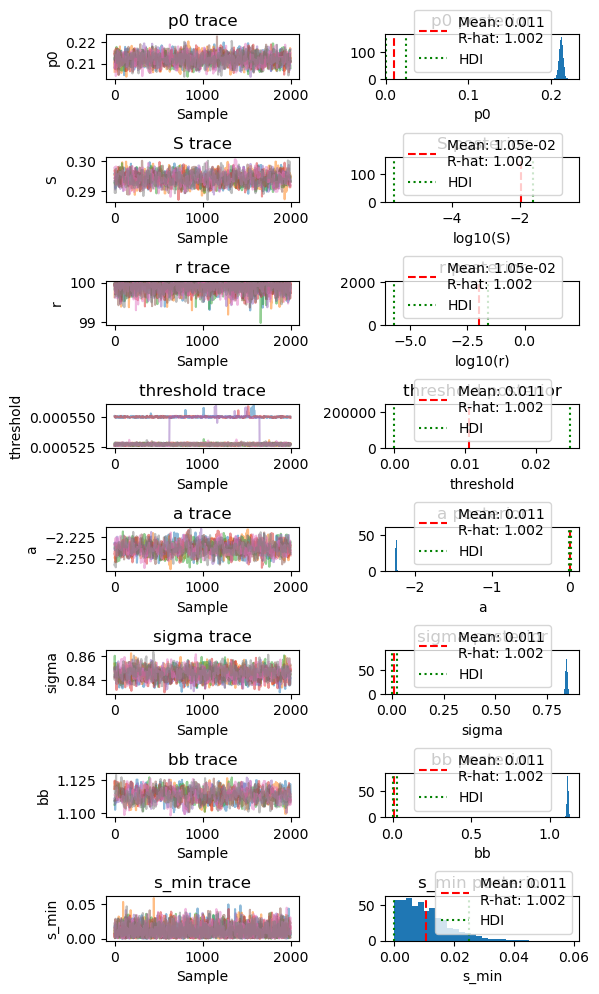

<Figure size 700x700 with 0 Axes>

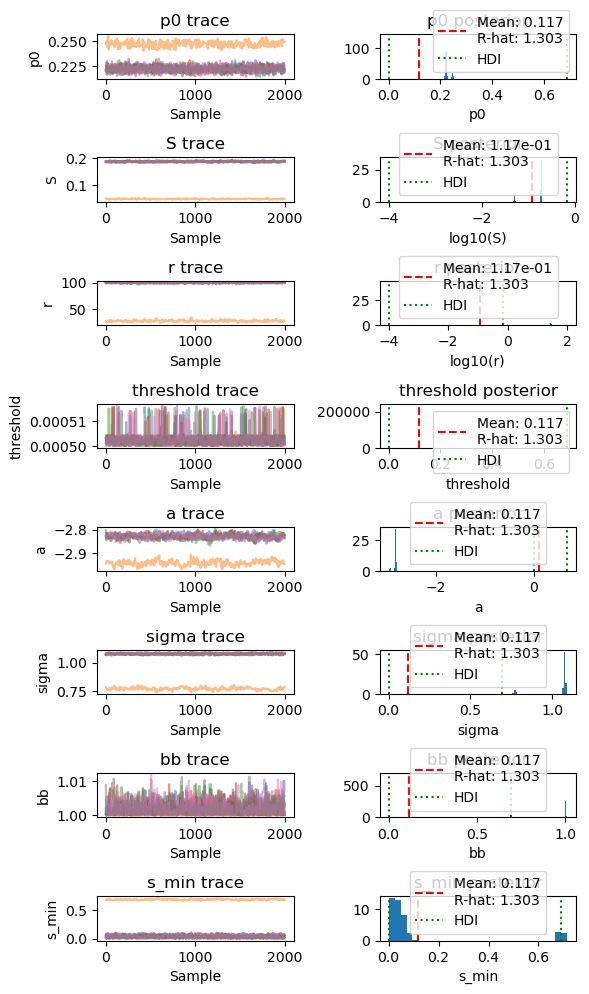

<Figure size 700x700 with 0 Axes>

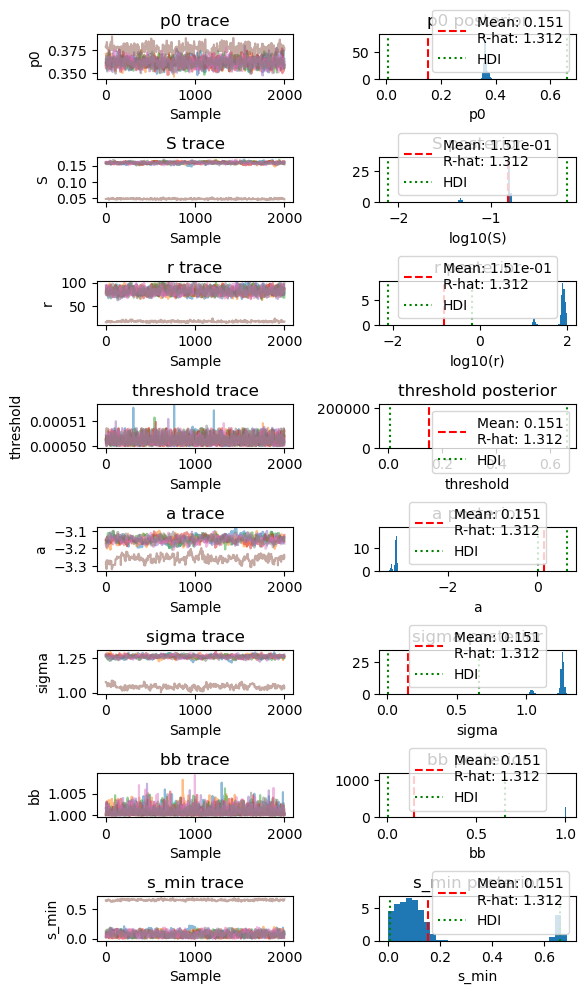

<Figure size 700x700 with 0 Axes>

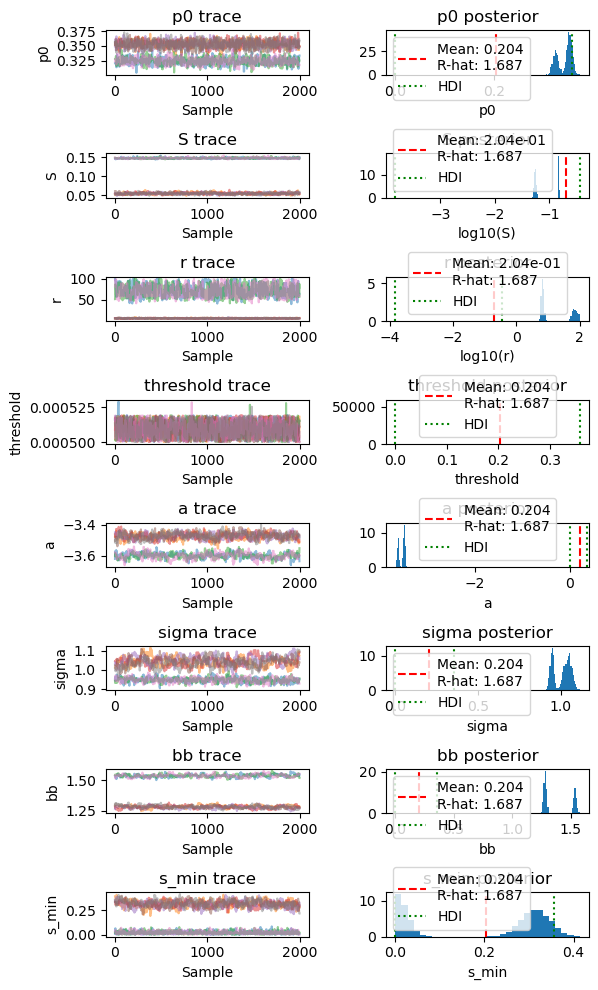

<Figure size 700x700 with 0 Axes>

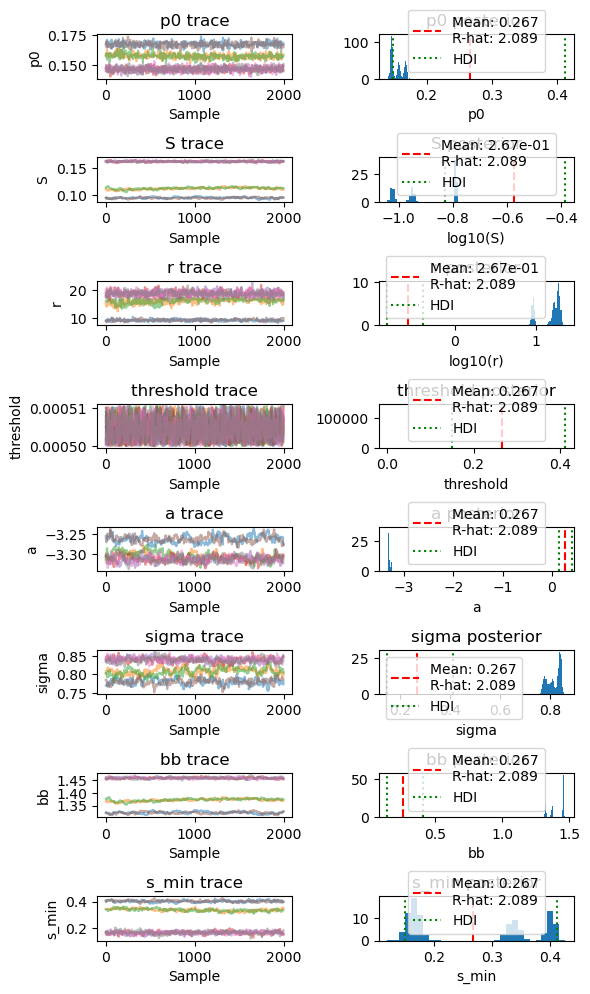

<Figure size 700x700 with 0 Axes>

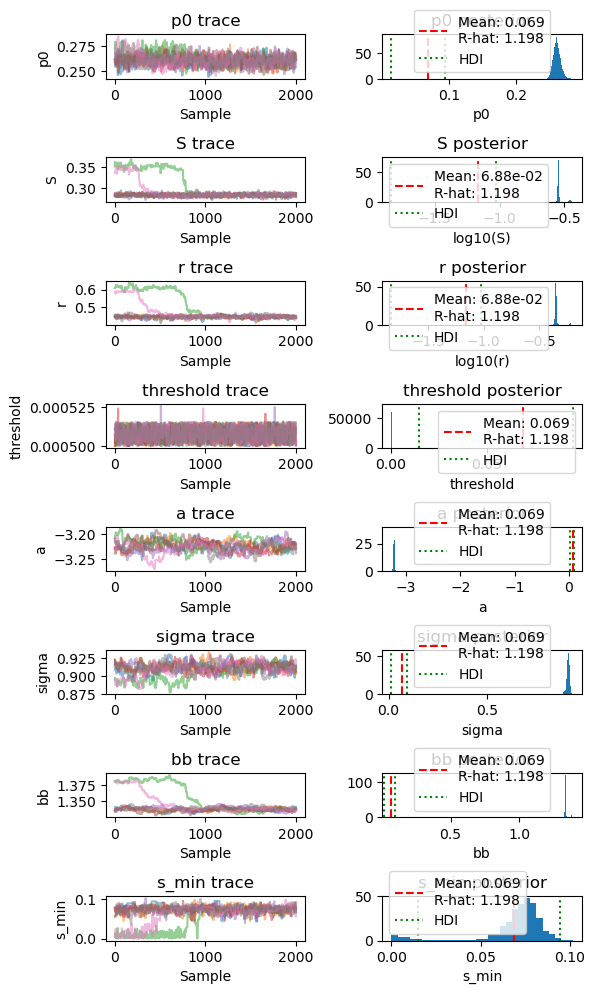

<Figure size 700x700 with 0 Axes>

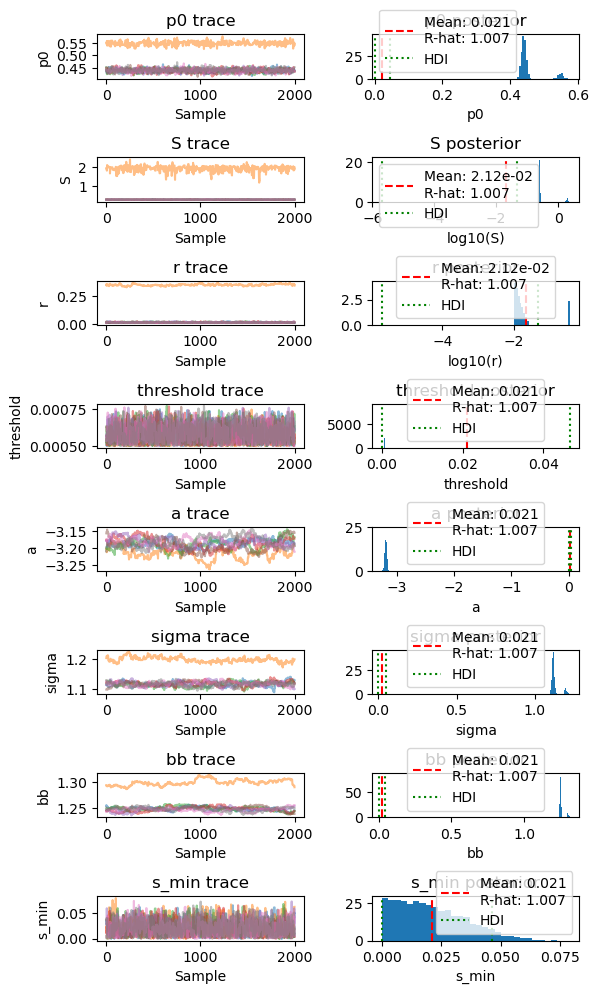

<Figure size 700x700 with 0 Axes>

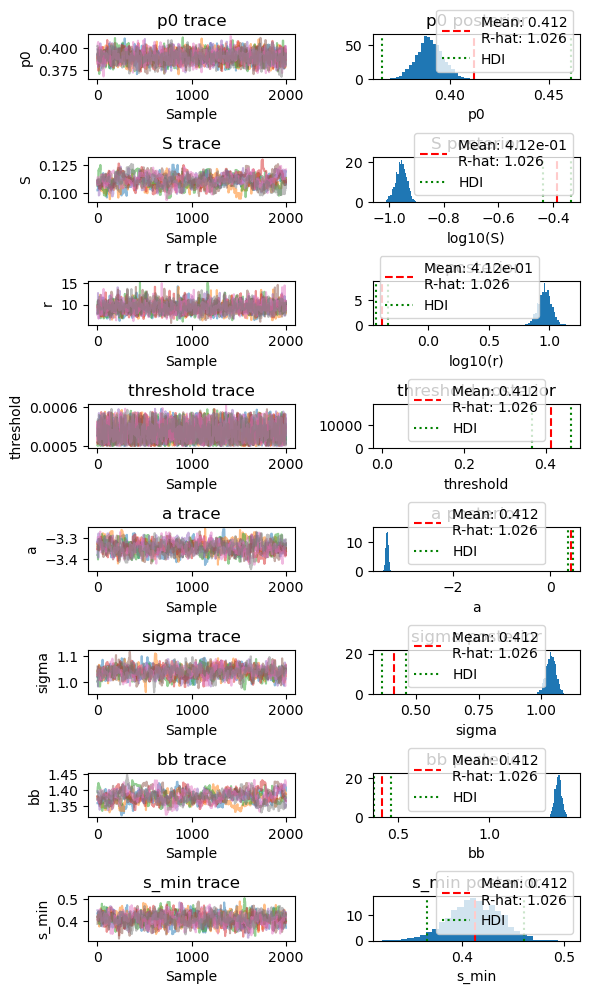

<Figure size 700x700 with 0 Axes>

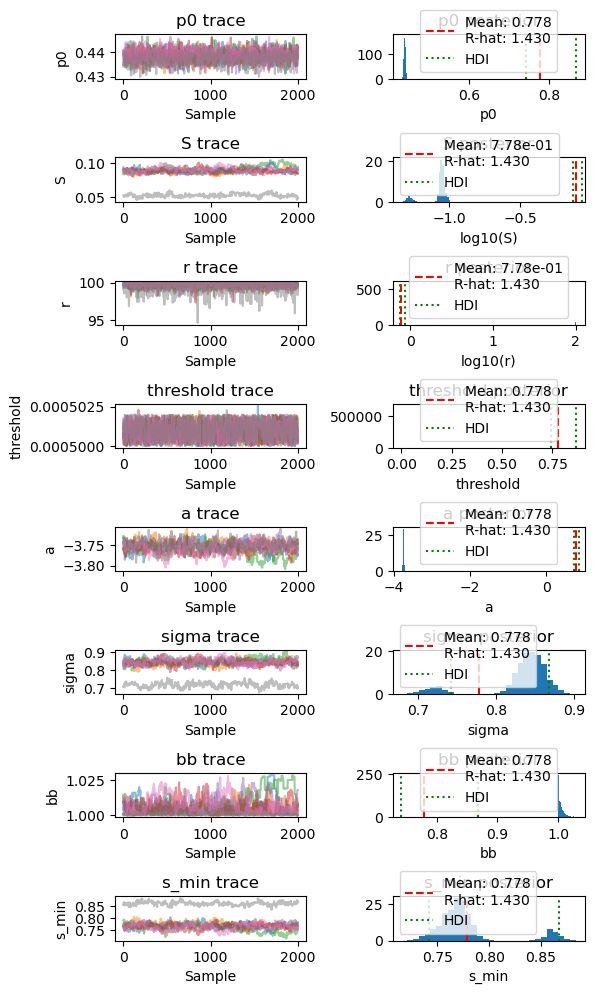

<Figure size 700x700 with 0 Axes>

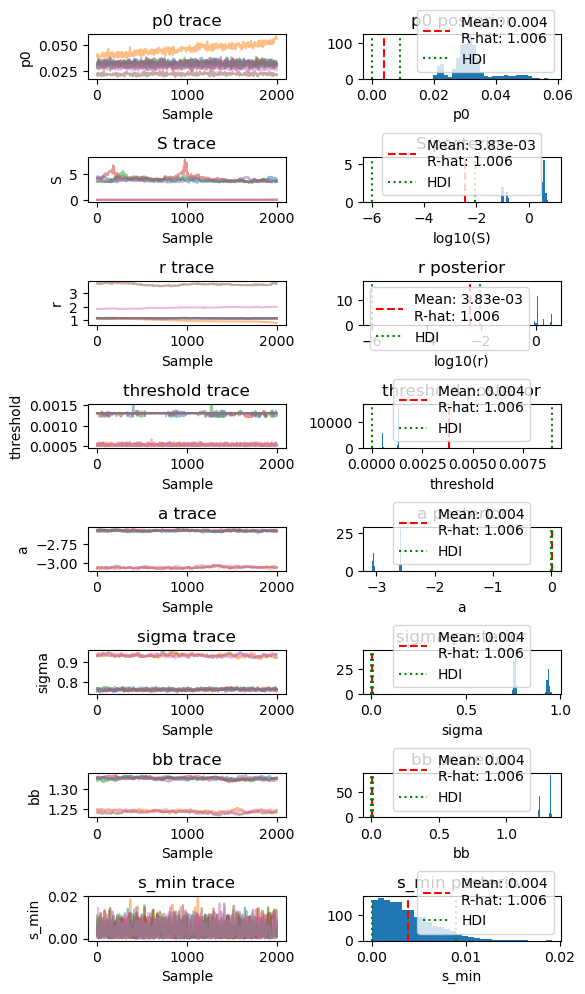

<Figure size 700x700 with 0 Axes>

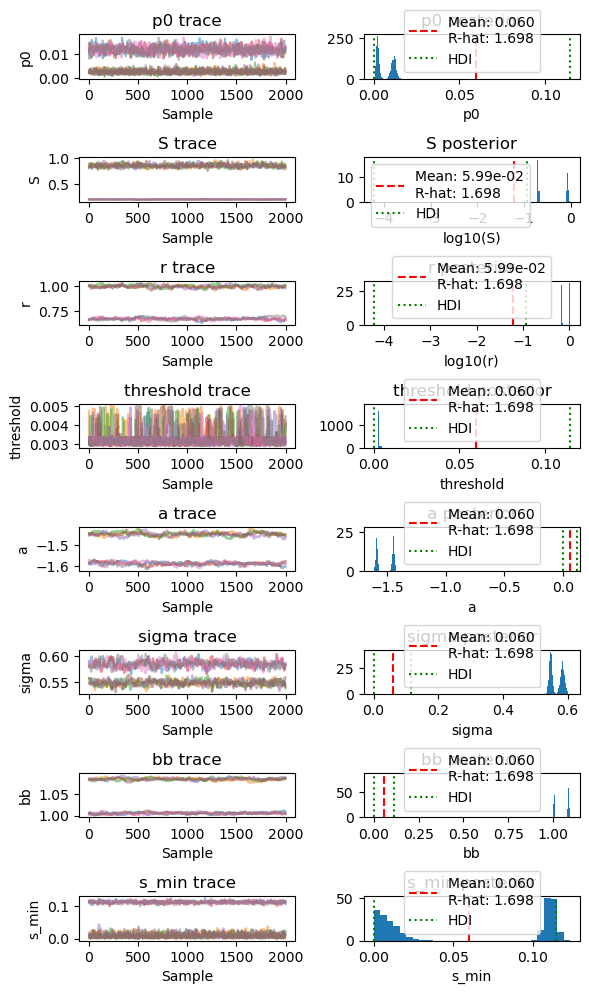

<Figure size 700x700 with 0 Axes>

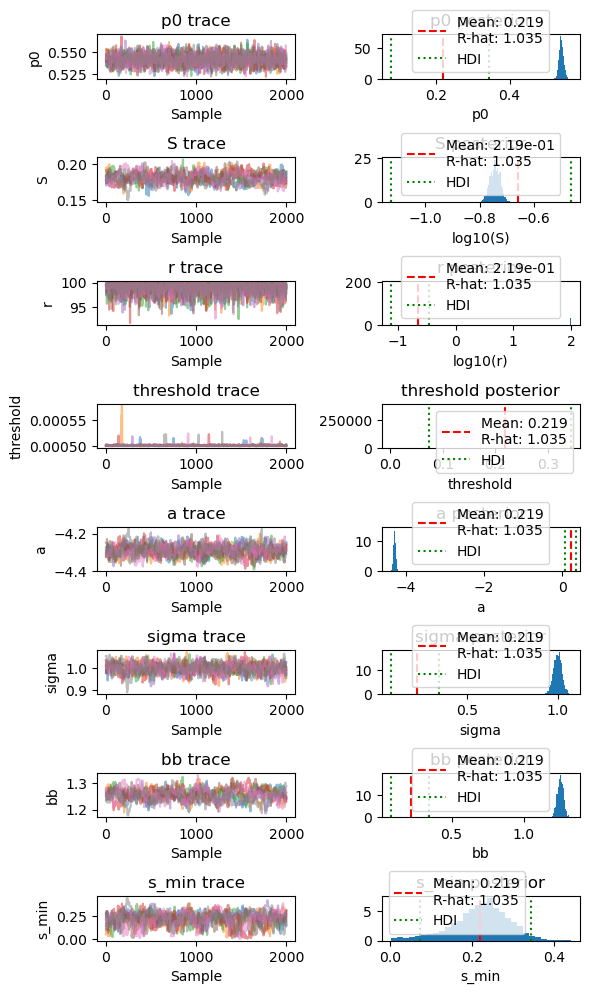

<Figure size 700x700 with 0 Axes>

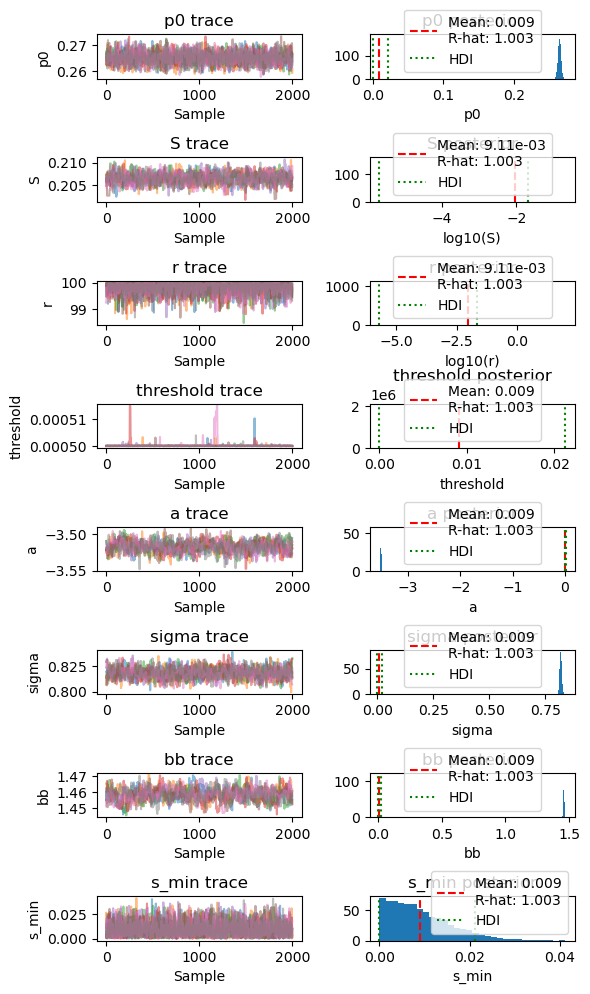

<Figure size 700x700 with 0 Axes>

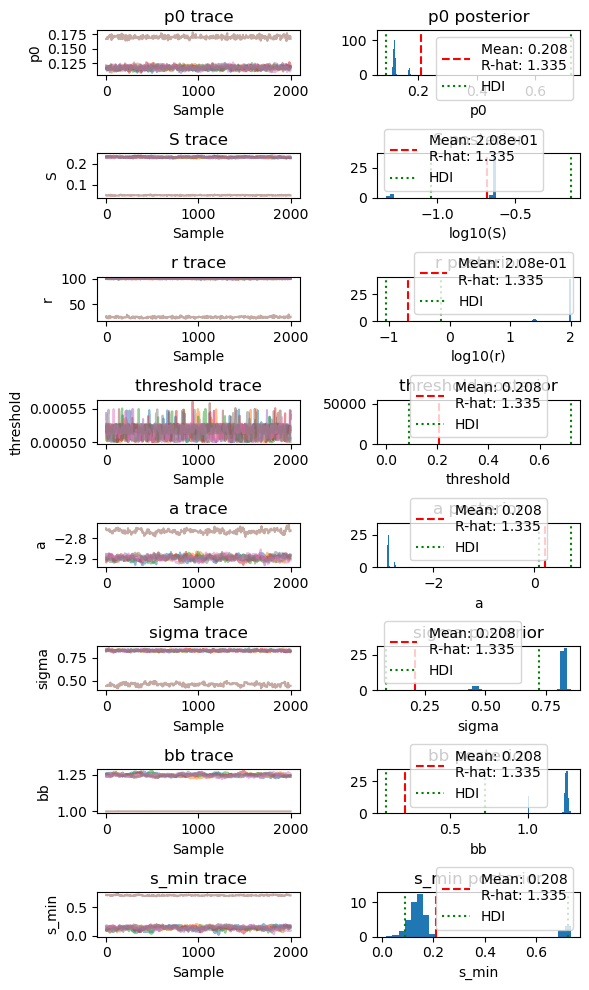

<Figure size 700x700 with 0 Axes>

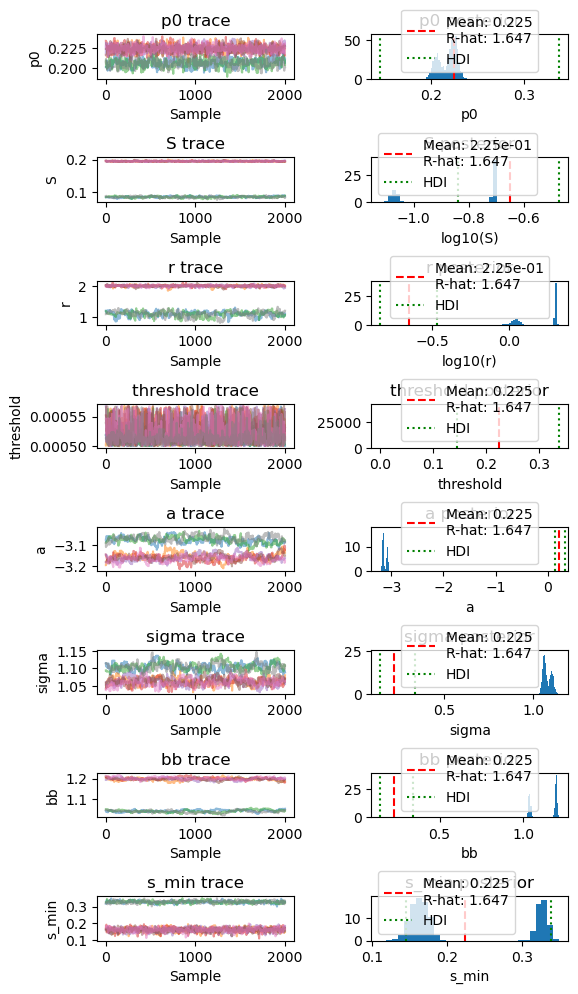

<Figure size 700x700 with 0 Axes>

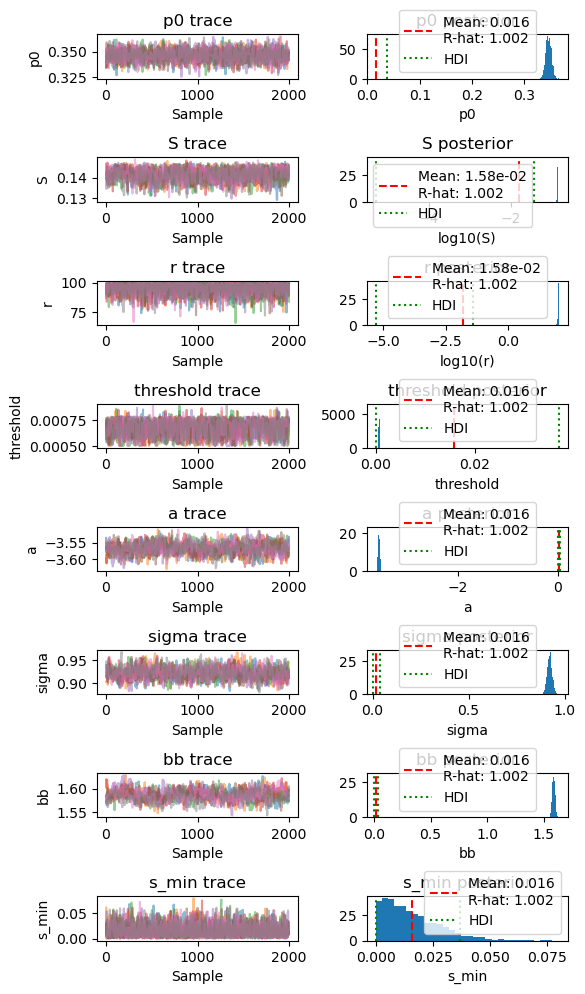

<Figure size 700x700 with 0 Axes>

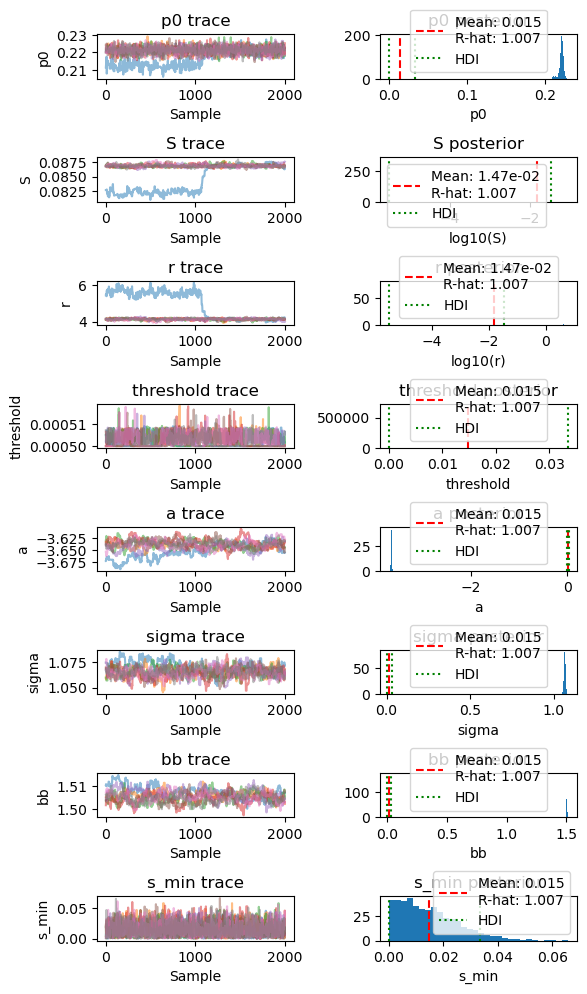

<Figure size 700x700 with 0 Axes>

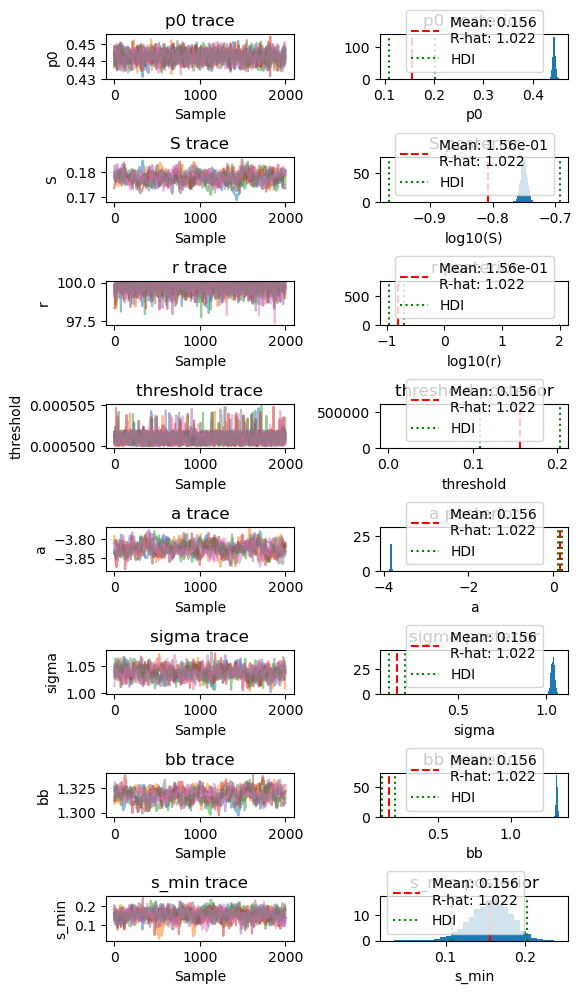

<Figure size 700x700 with 0 Axes>

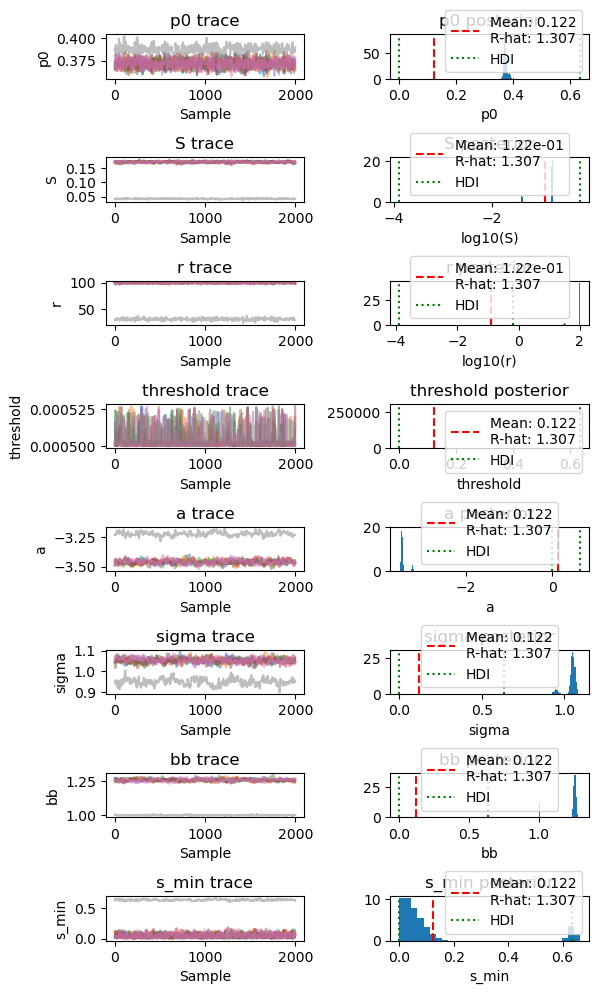

<Figure size 700x700 with 0 Axes>

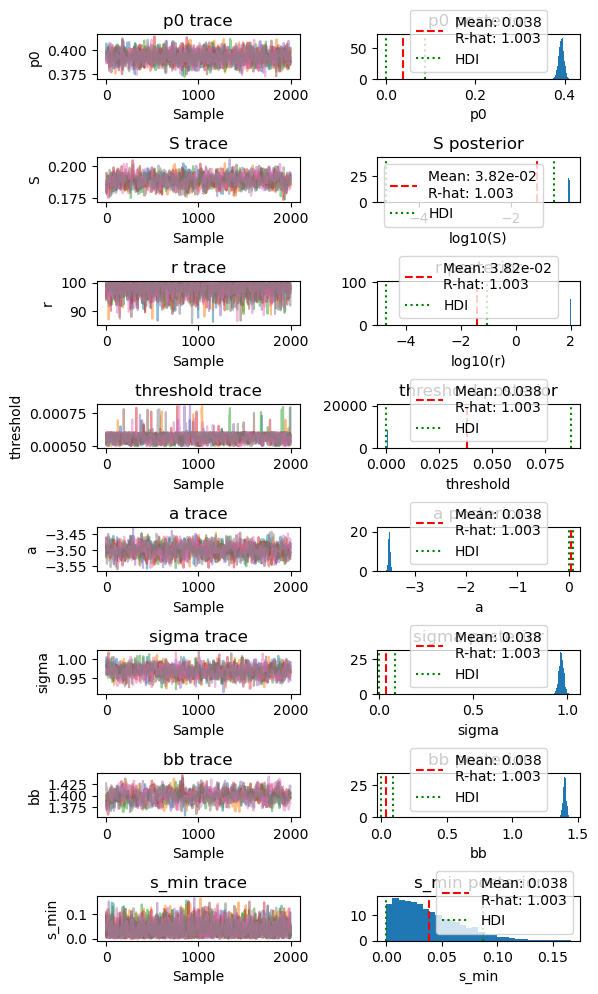

<Figure size 700x700 with 0 Axes>

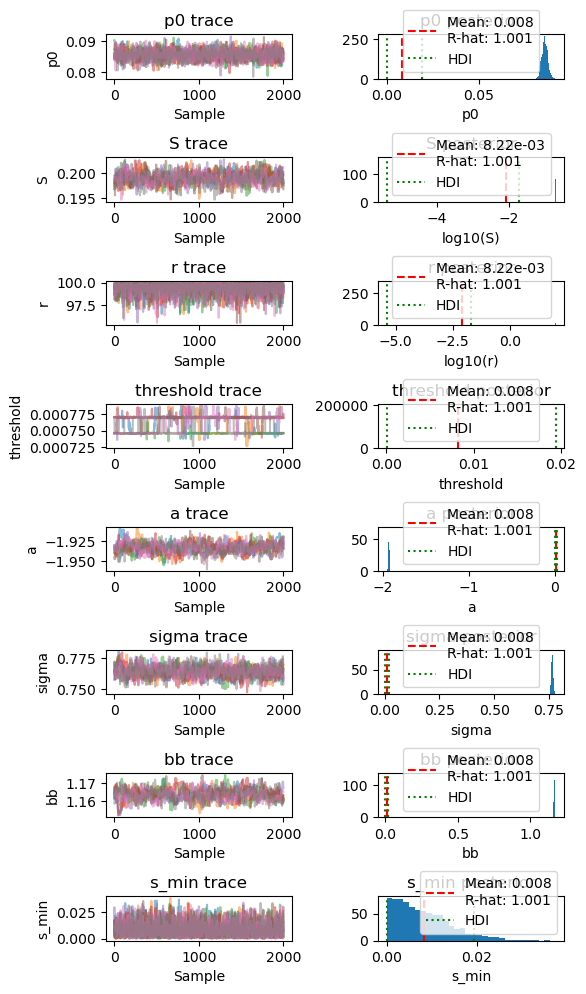

<Figure size 700x700 with 0 Axes>

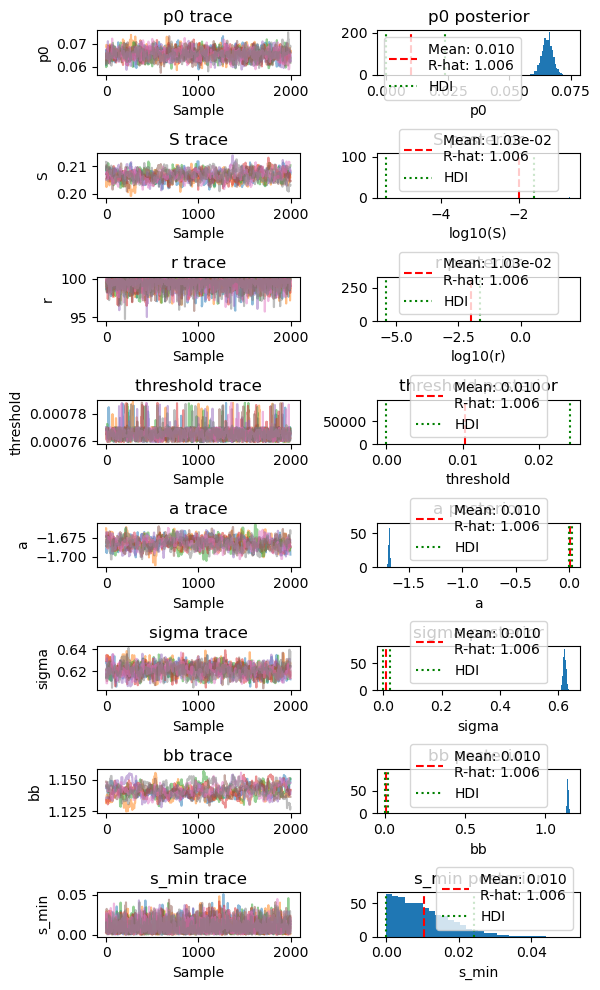

<Figure size 700x700 with 0 Axes>

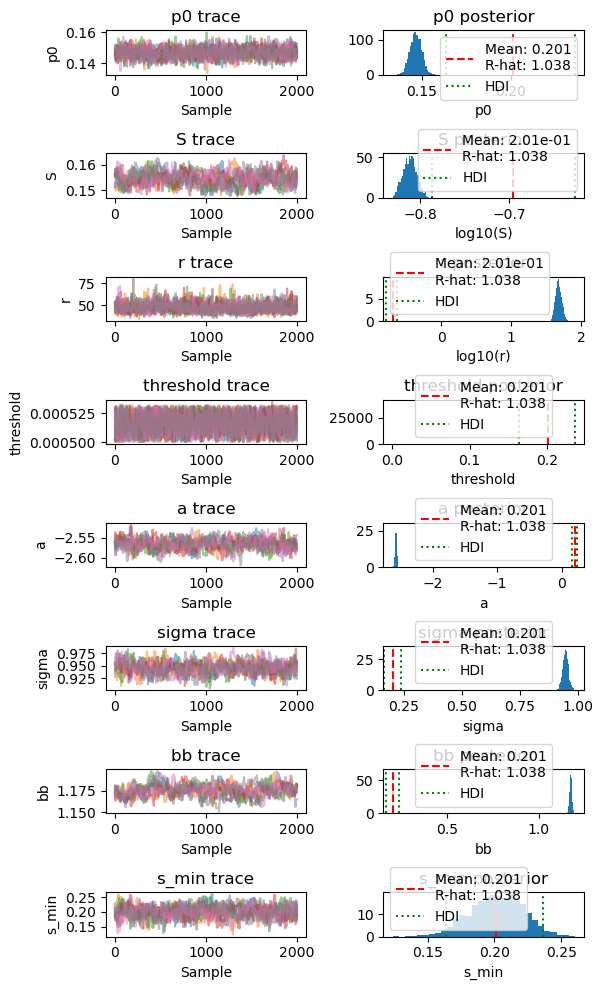

<Figure size 700x700 with 0 Axes>

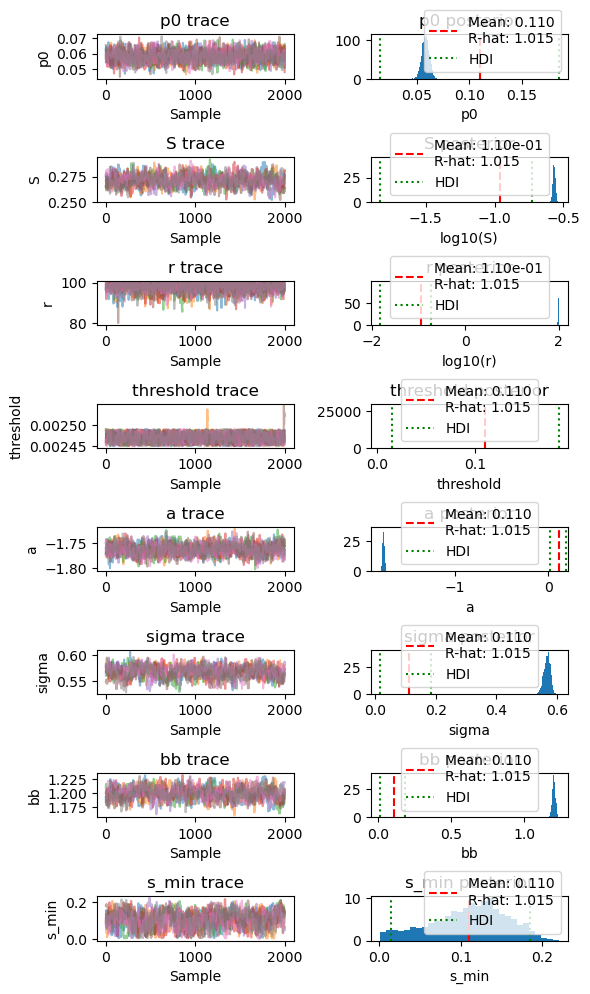

<Figure size 700x700 with 0 Axes>

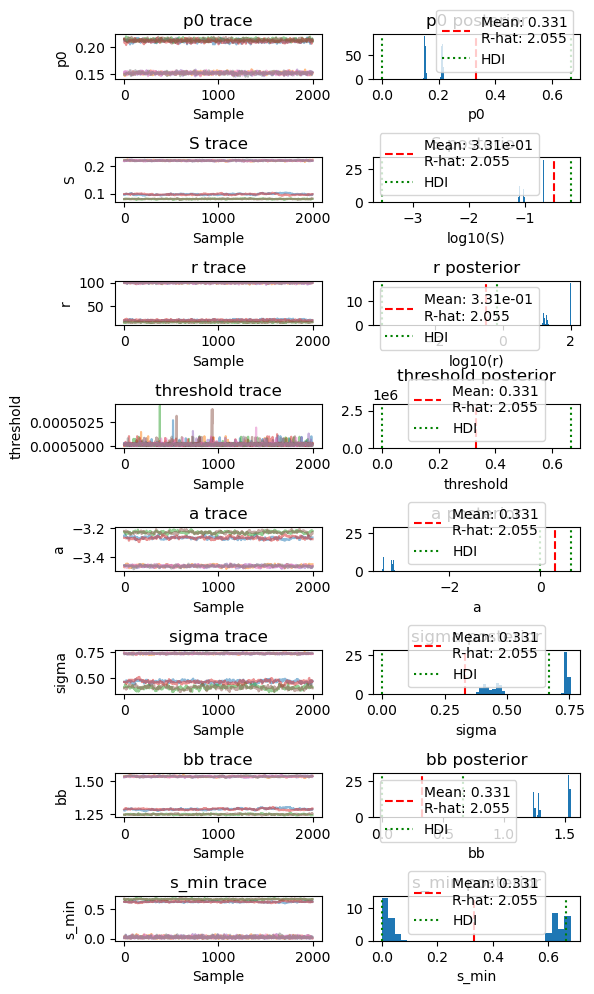

<Figure size 700x700 with 0 Axes>

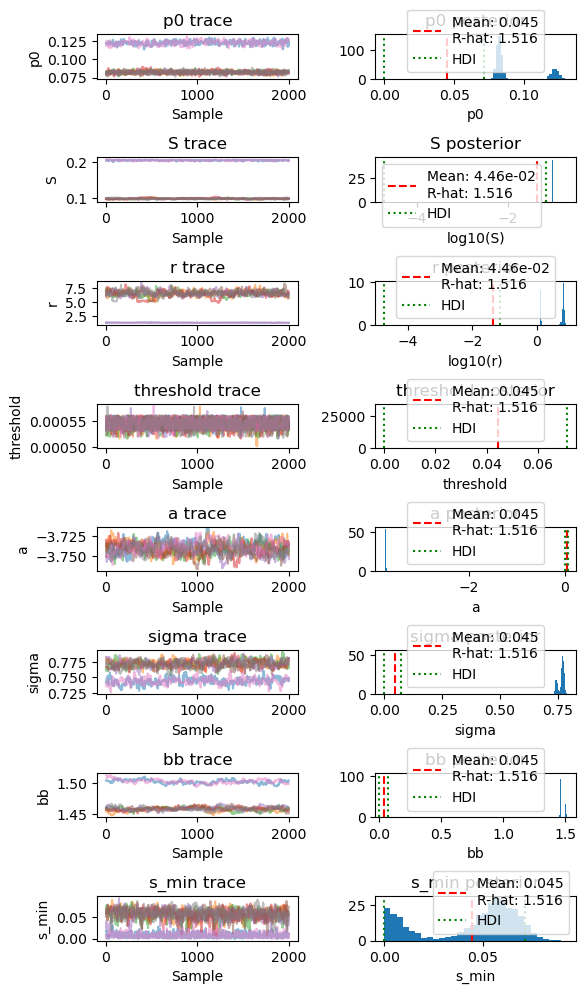

<Figure size 700x700 with 0 Axes>

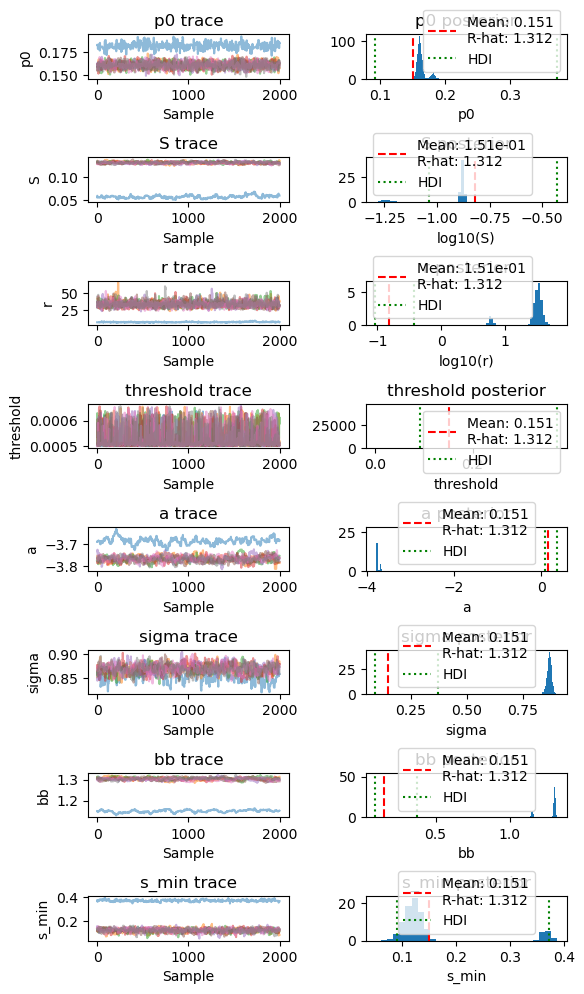

<Figure size 700x700 with 0 Axes>

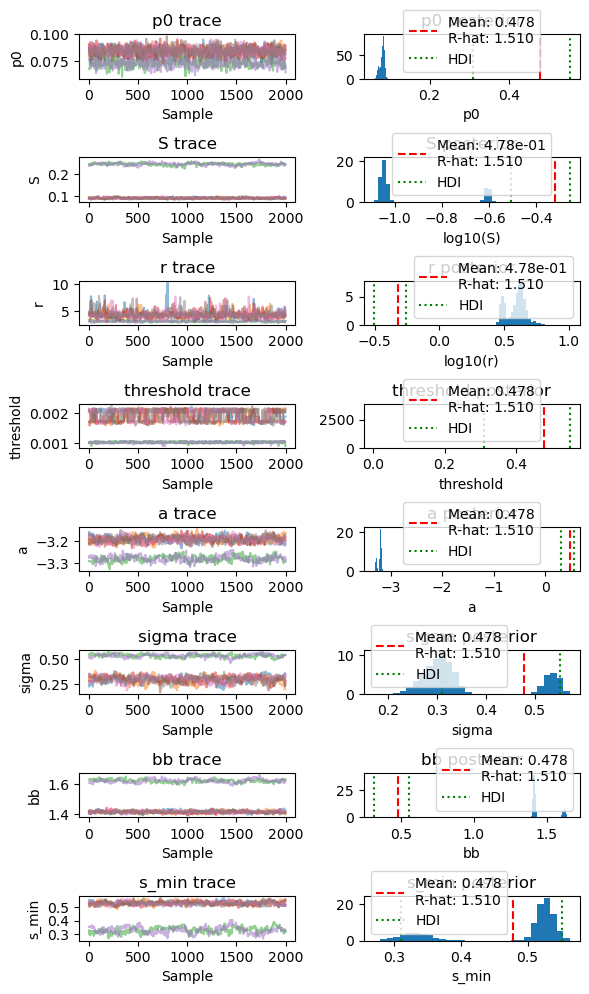

<Figure size 700x700 with 0 Axes>

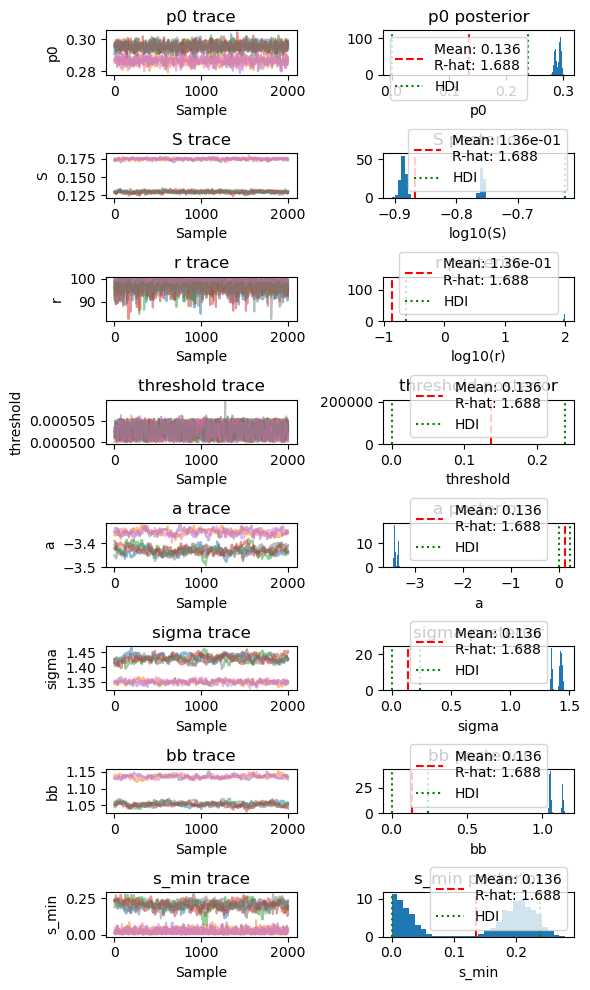

<Figure size 700x700 with 0 Axes>

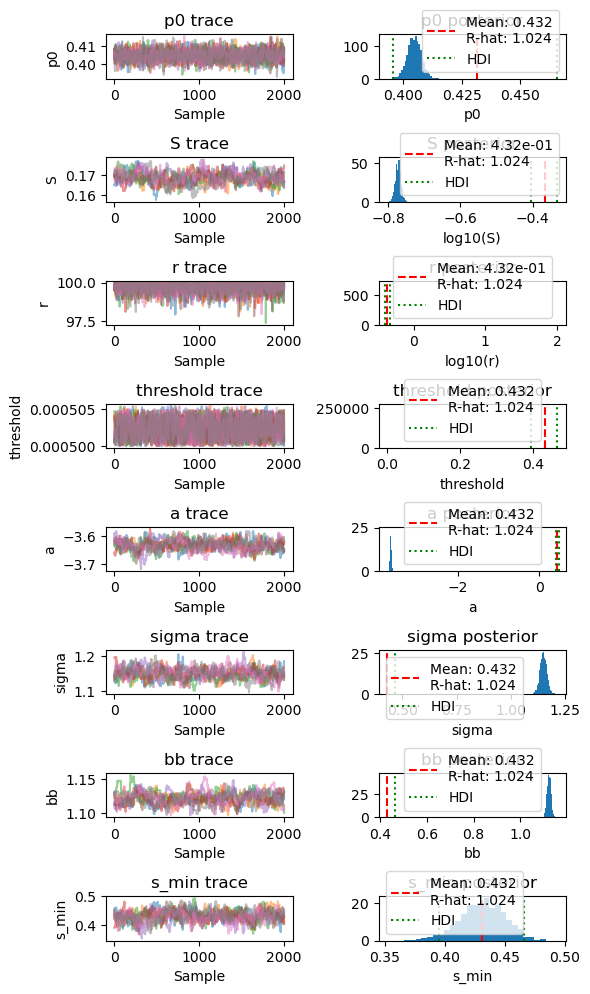

<Figure size 700x700 with 0 Axes>

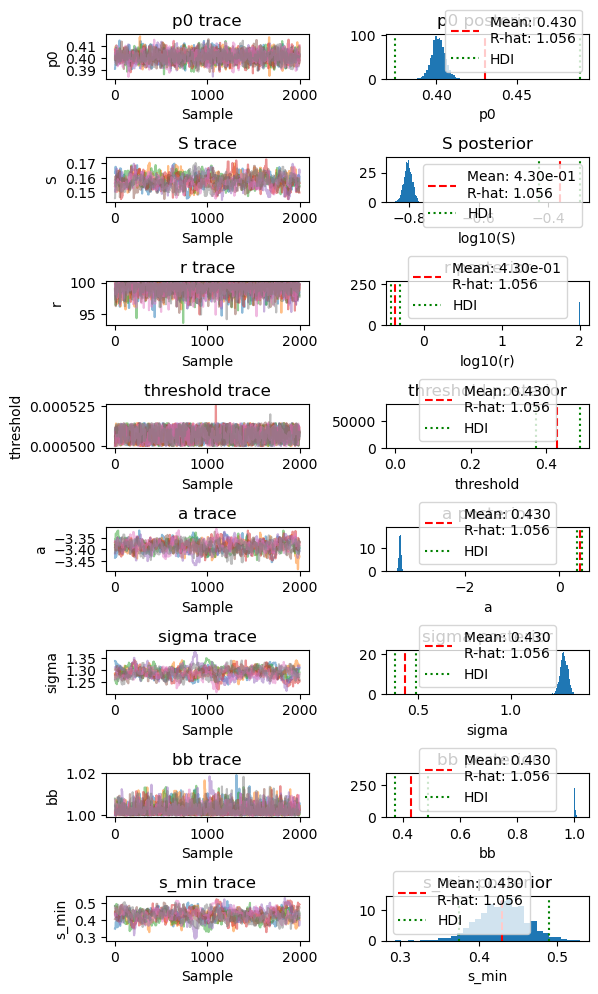

<Figure size 700x700 with 0 Axes>

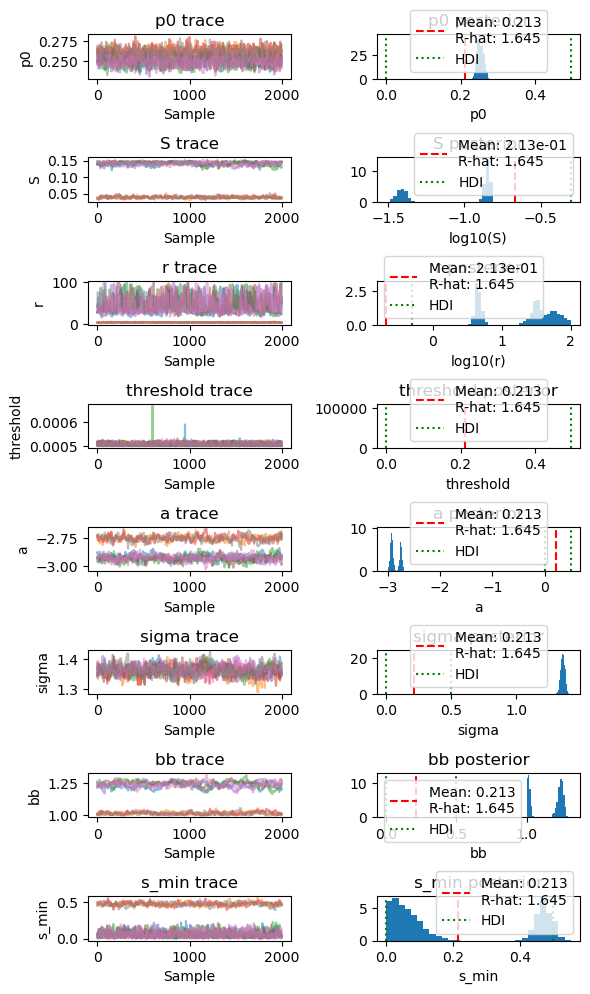

<Figure size 700x700 with 0 Axes>

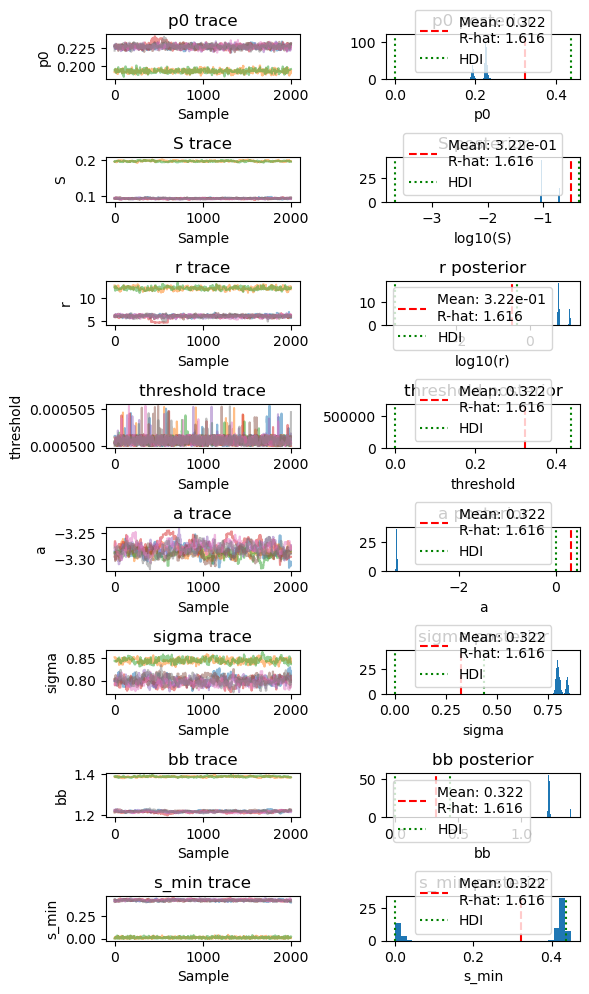

<Figure size 700x700 with 0 Axes>

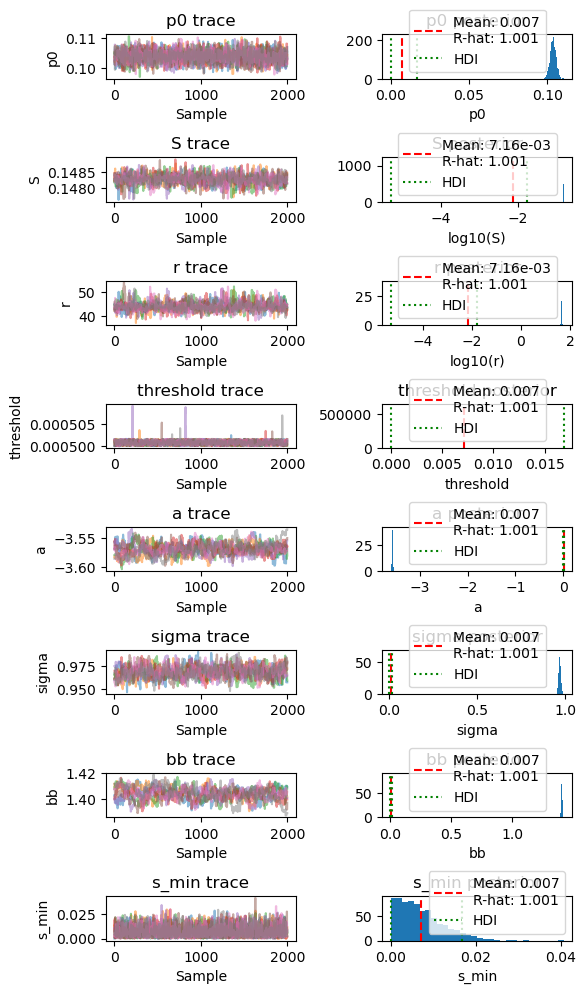

<Figure size 700x700 with 0 Axes>

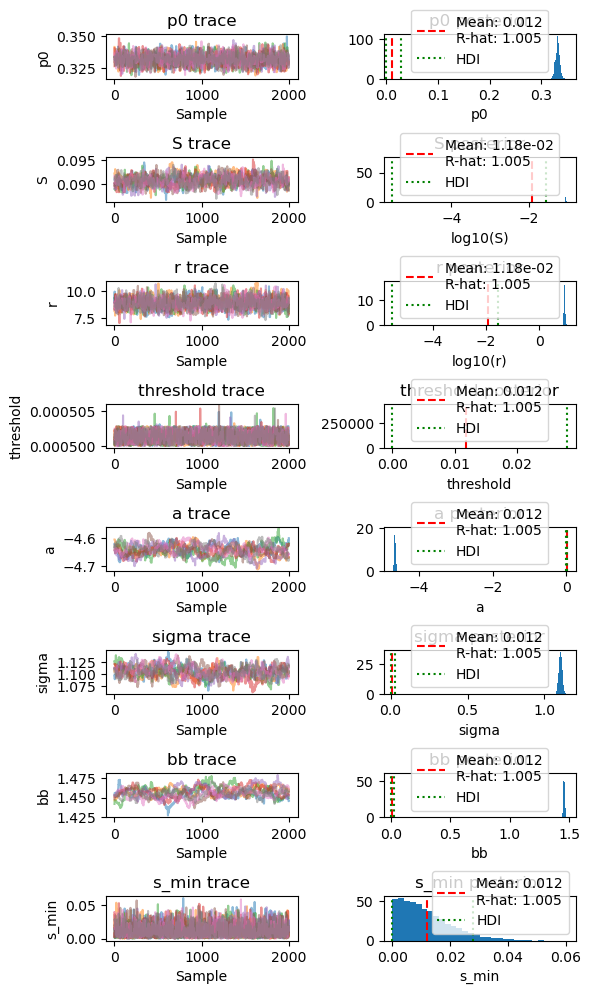

<Figure size 700x700 with 0 Axes>

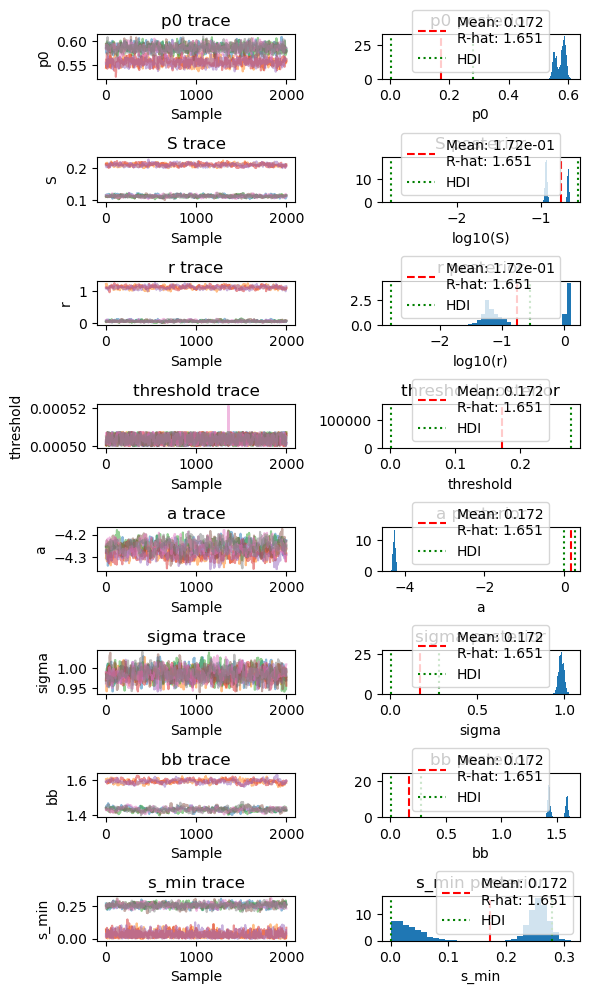

<Figure size 700x700 with 0 Axes>

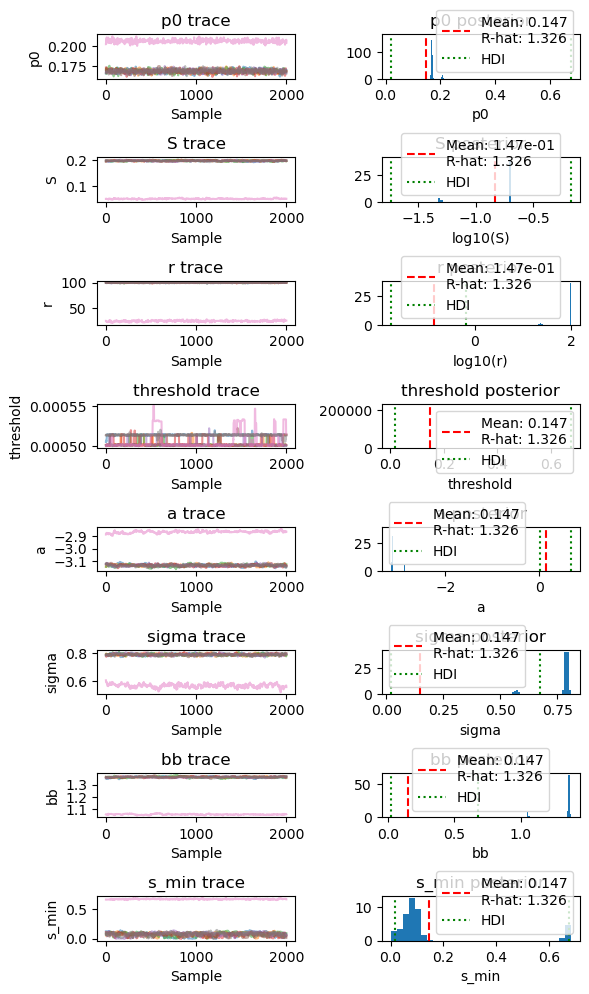

<Figure size 700x700 with 0 Axes>

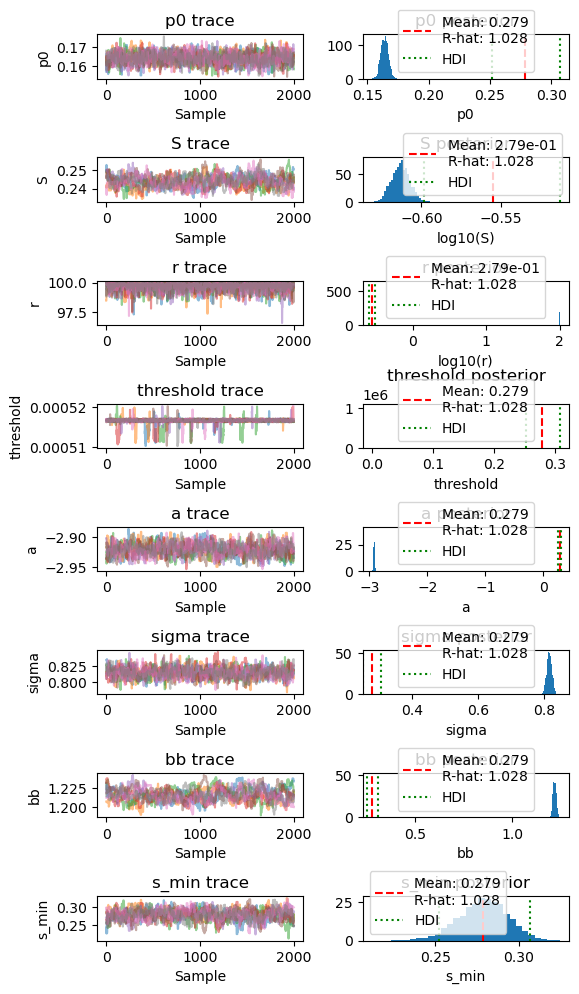

<Figure size 700x700 with 0 Axes>

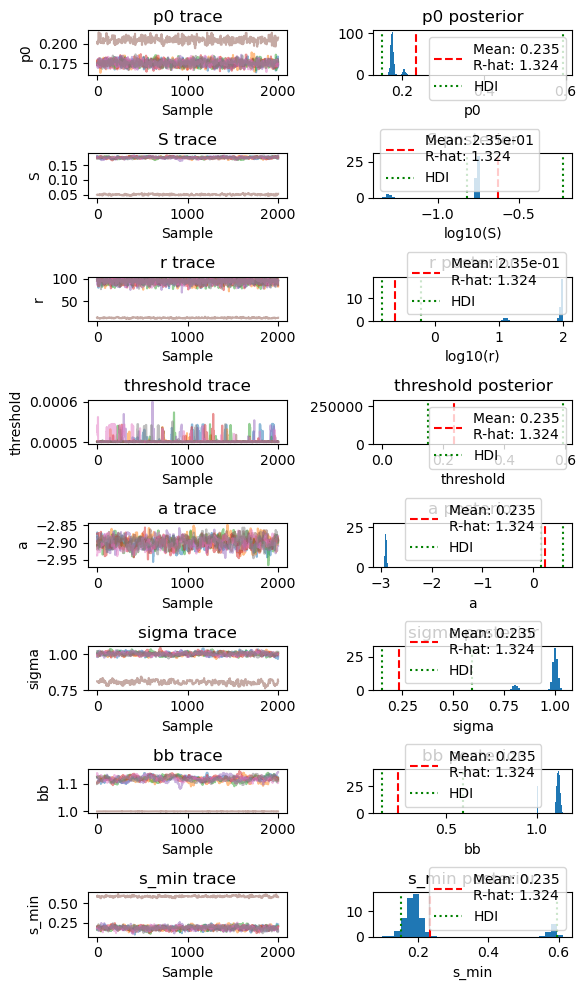

<Figure size 700x700 with 0 Axes>

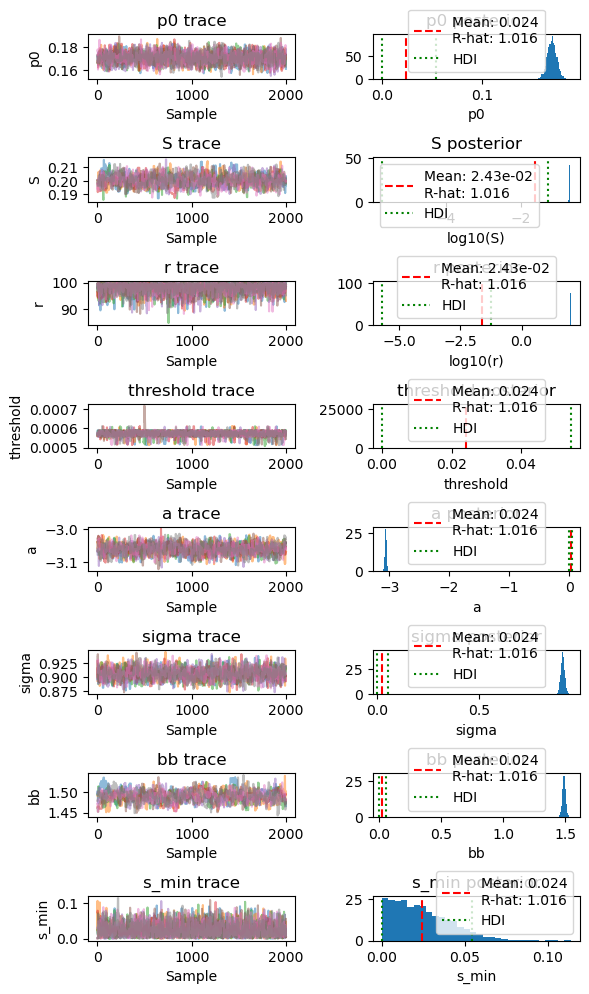

<Figure size 700x700 with 0 Axes>

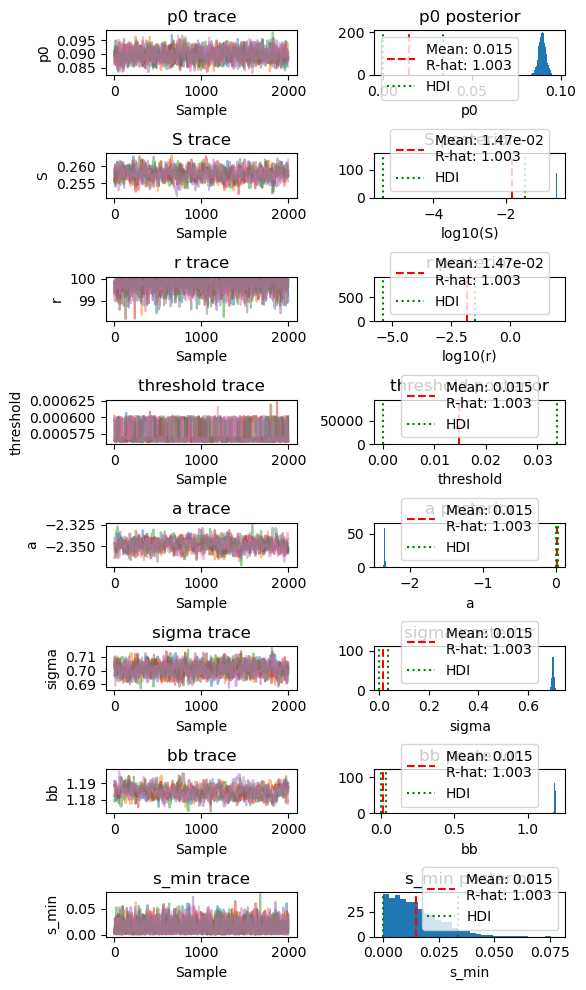

<Figure size 700x700 with 0 Axes>

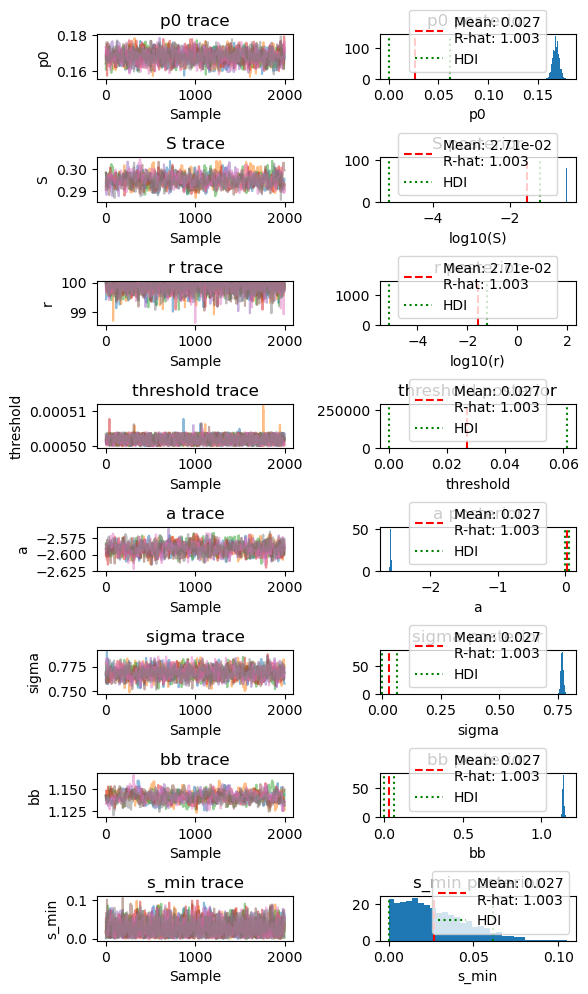

<Figure size 700x700 with 0 Axes>

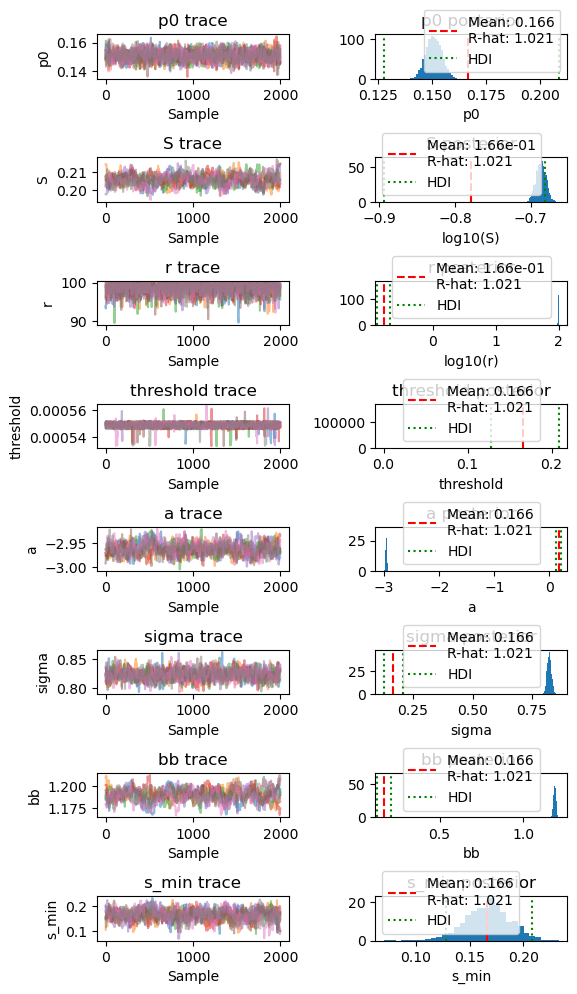

<Figure size 700x700 with 0 Axes>

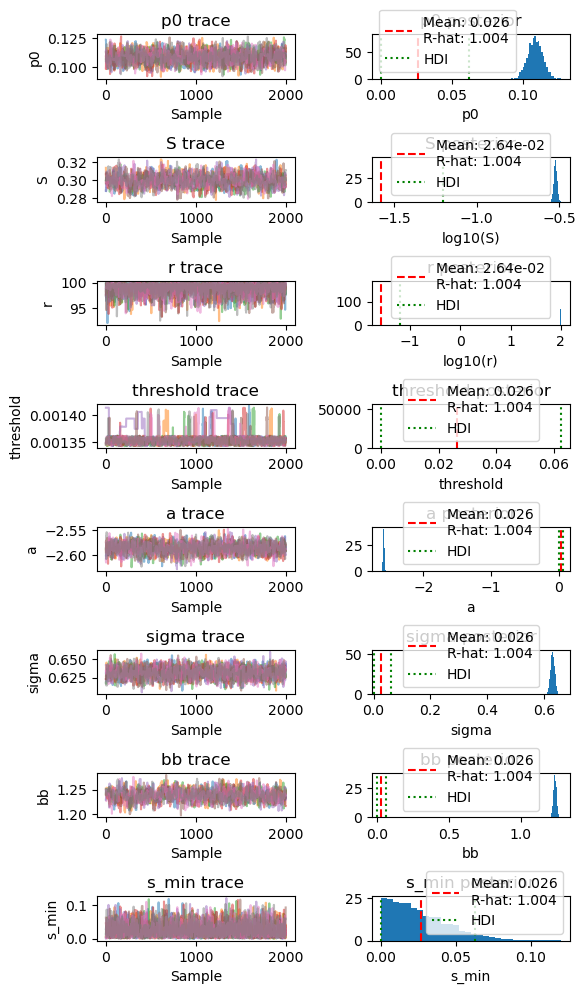

<Figure size 700x700 with 0 Axes>

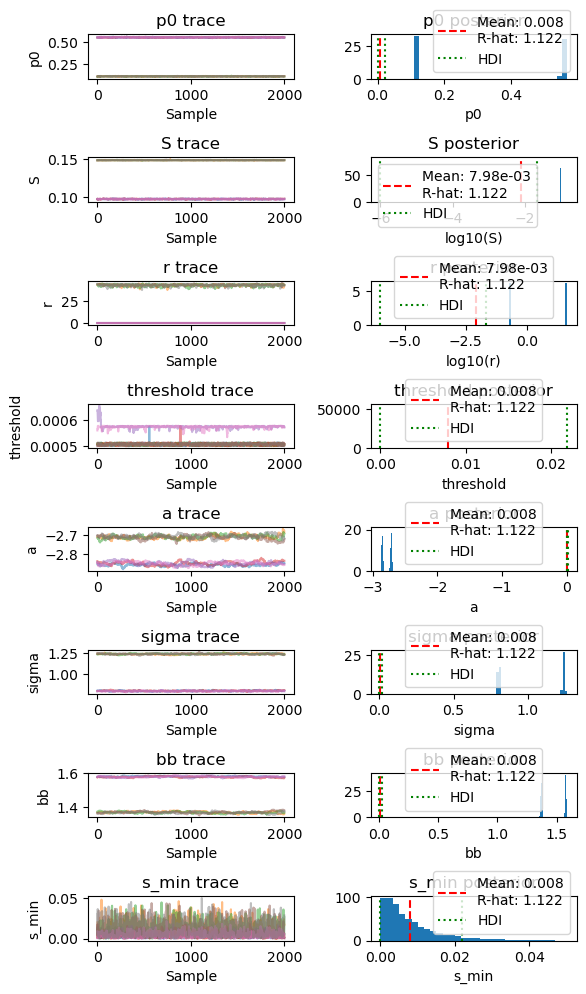

<Figure size 700x700 with 0 Axes>

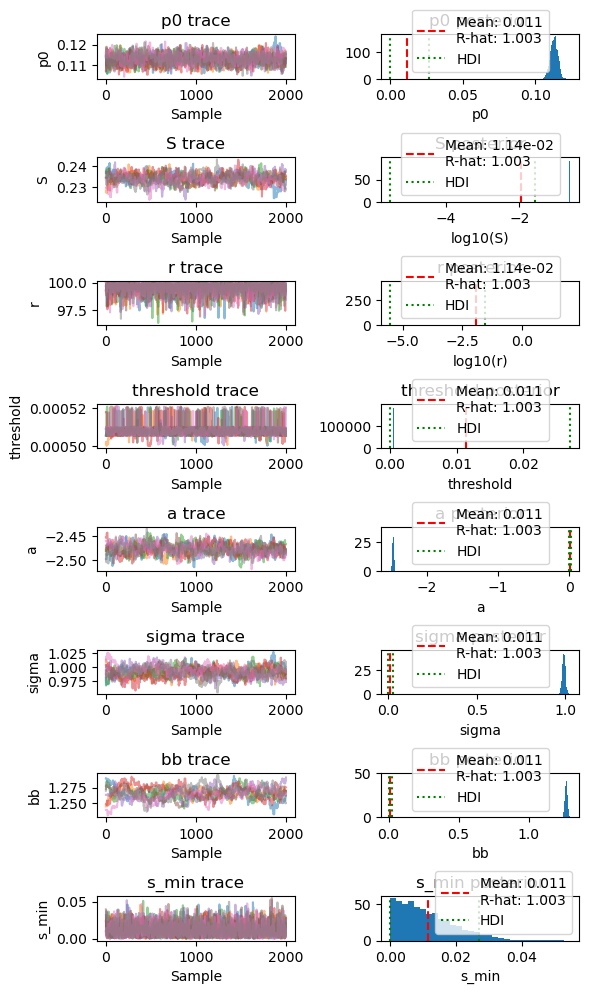

<Figure size 700x700 with 0 Axes>

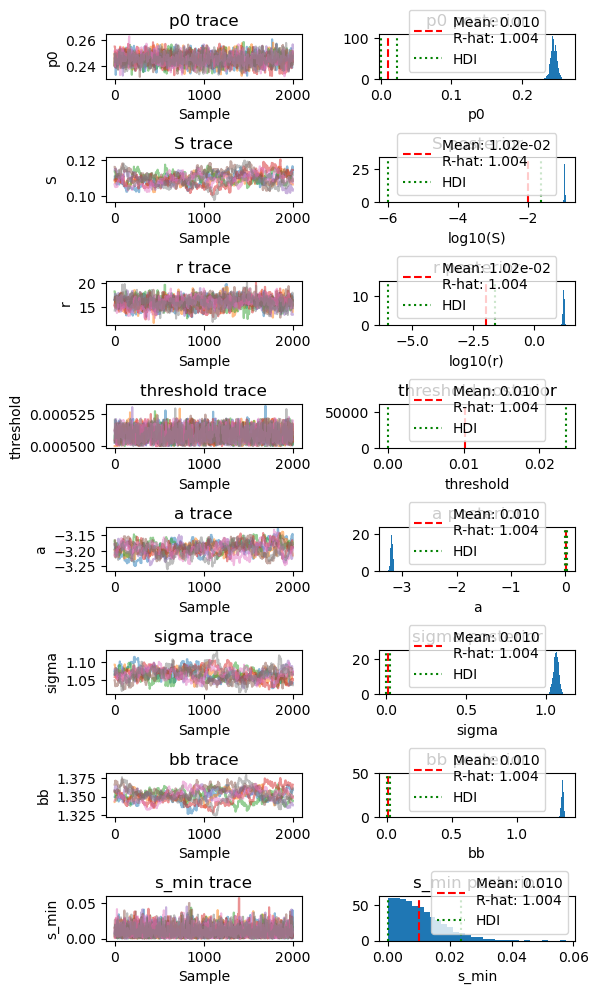

<Figure size 700x700 with 0 Axes>

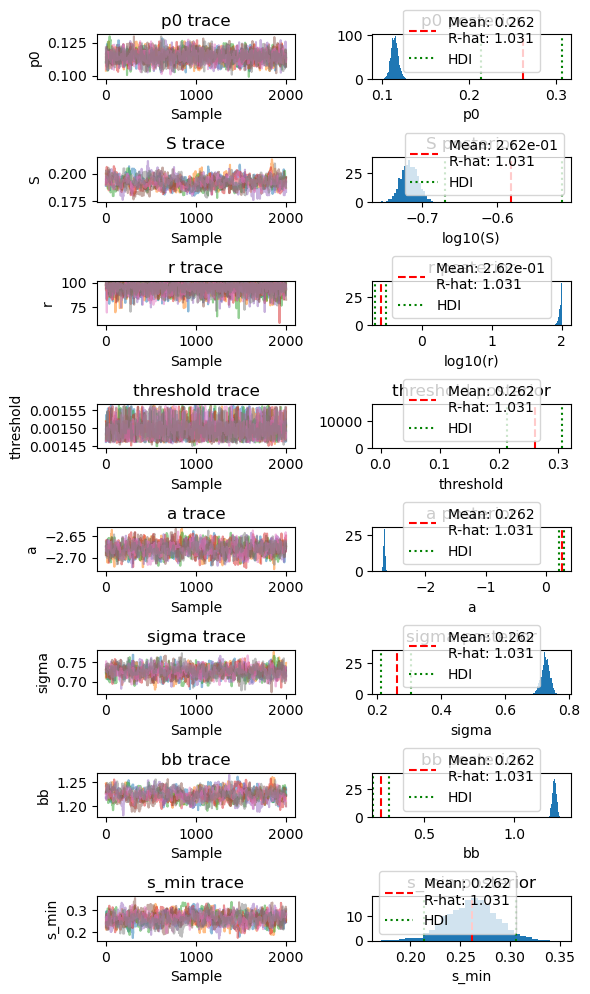

<Figure size 700x700 with 0 Axes>

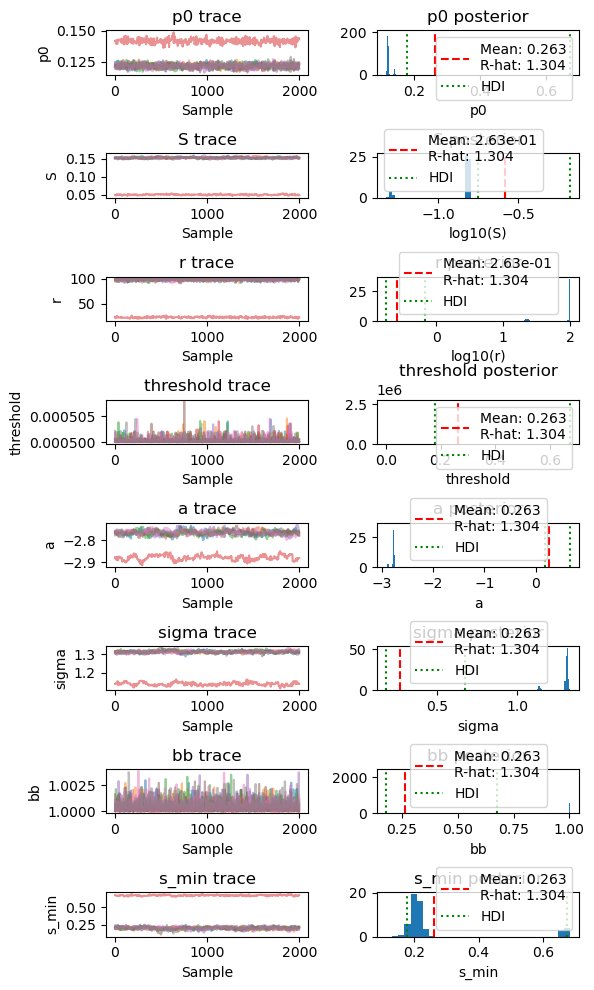

<Figure size 700x700 with 0 Axes>

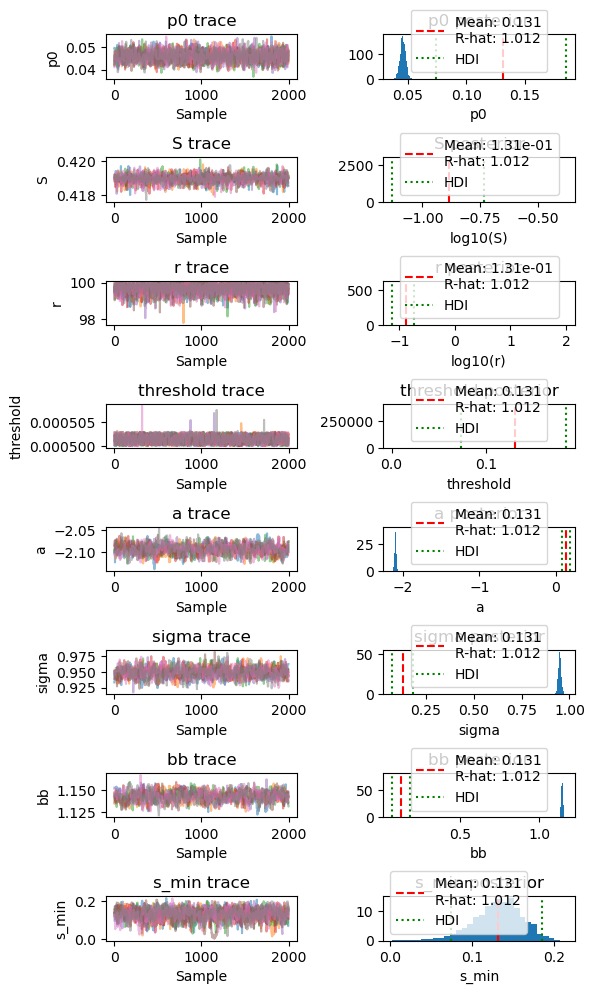

<Figure size 700x700 with 0 Axes>

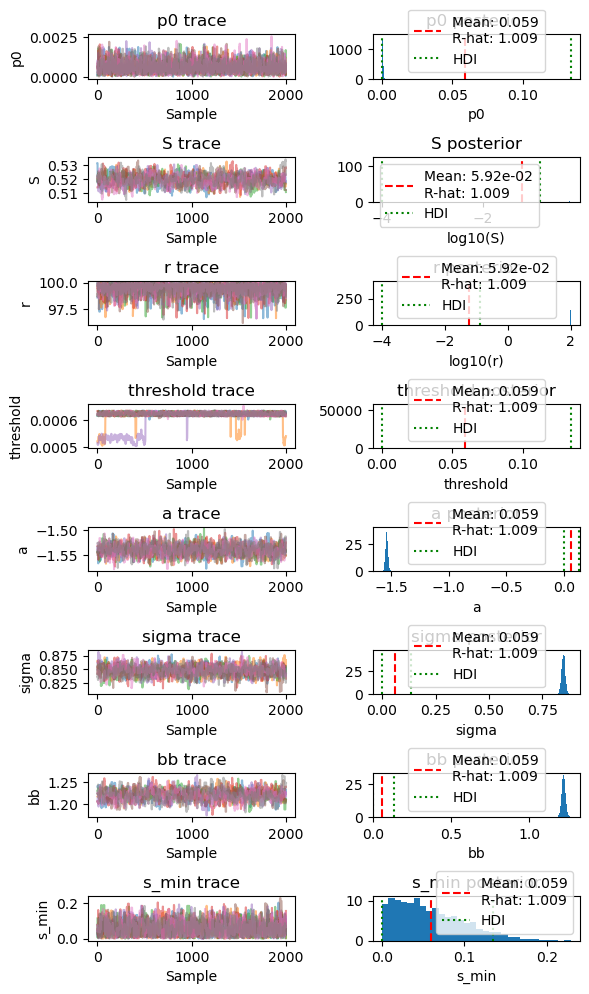

<Figure size 700x700 with 0 Axes>

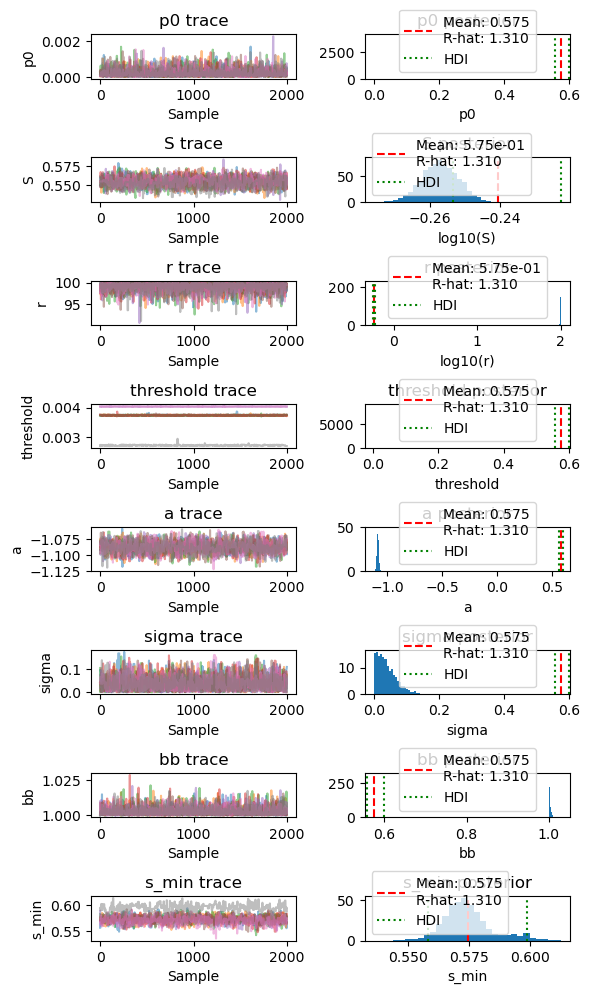

<Figure size 700x700 with 0 Axes>

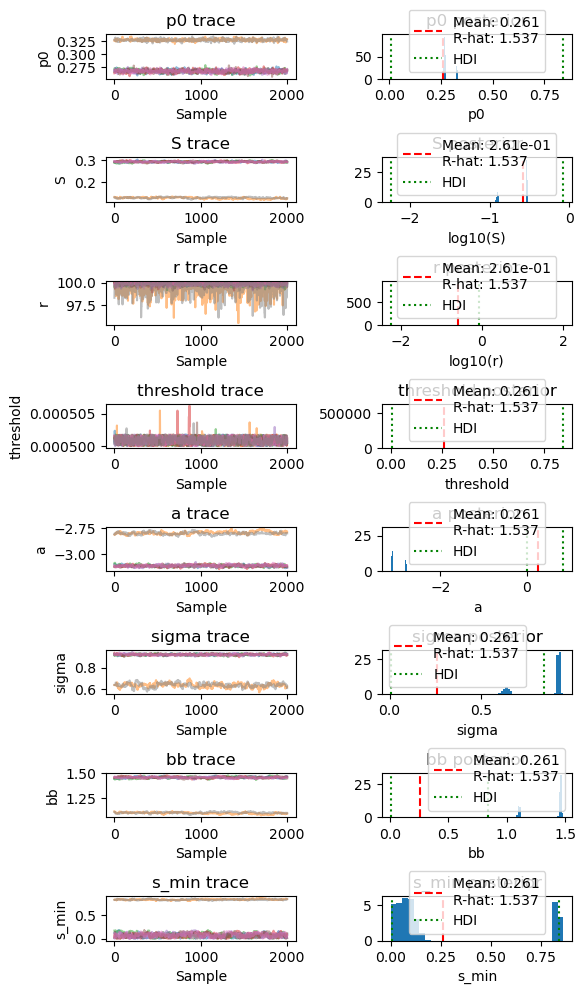

<Figure size 700x700 with 0 Axes>

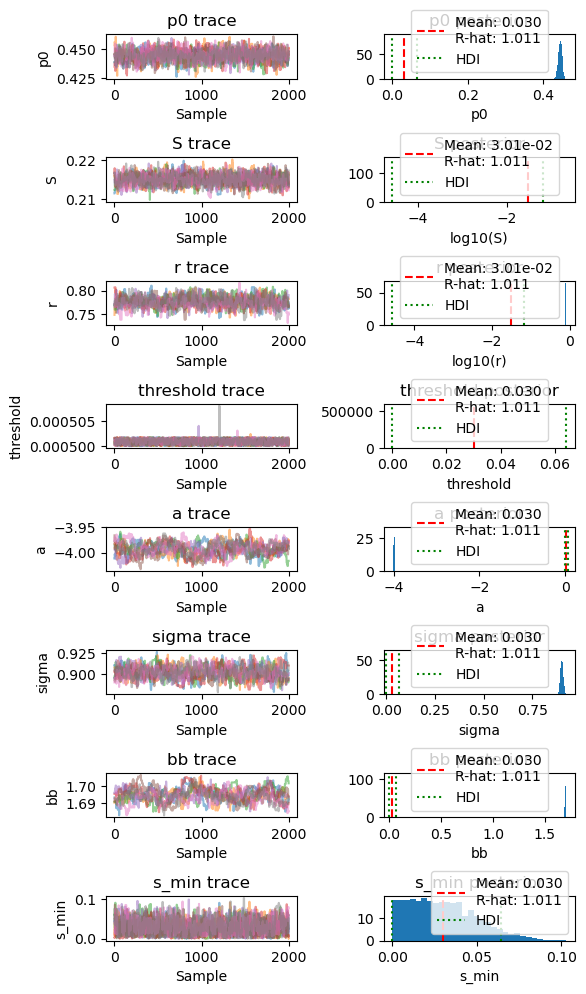

<Figure size 700x700 with 0 Axes>

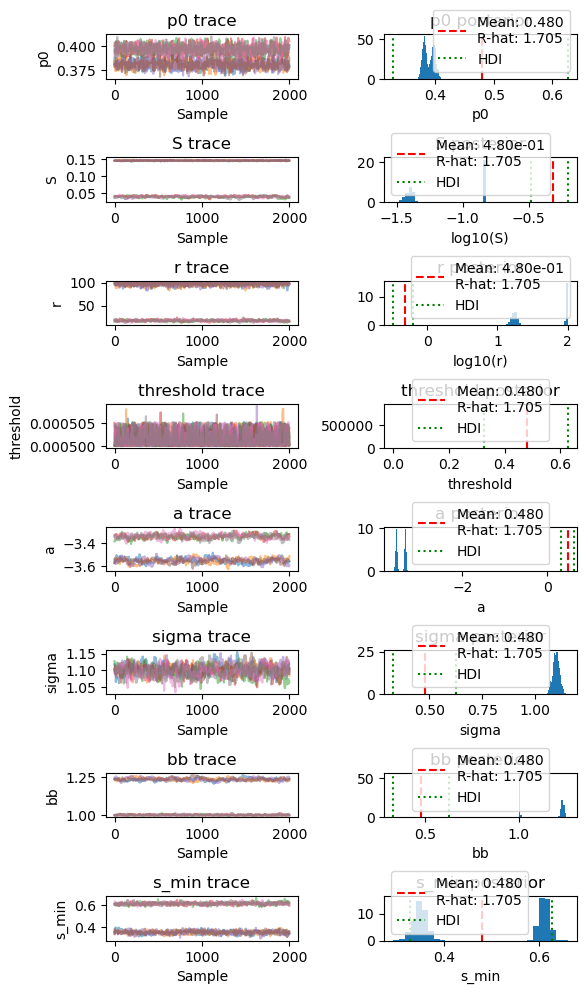

<Figure size 700x700 with 0 Axes>

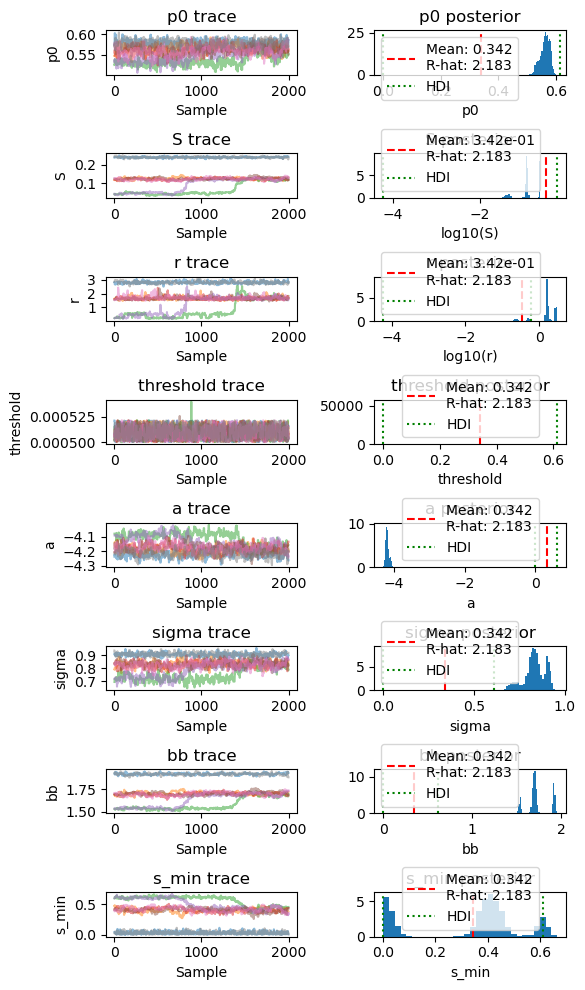

<Figure size 700x700 with 0 Axes>

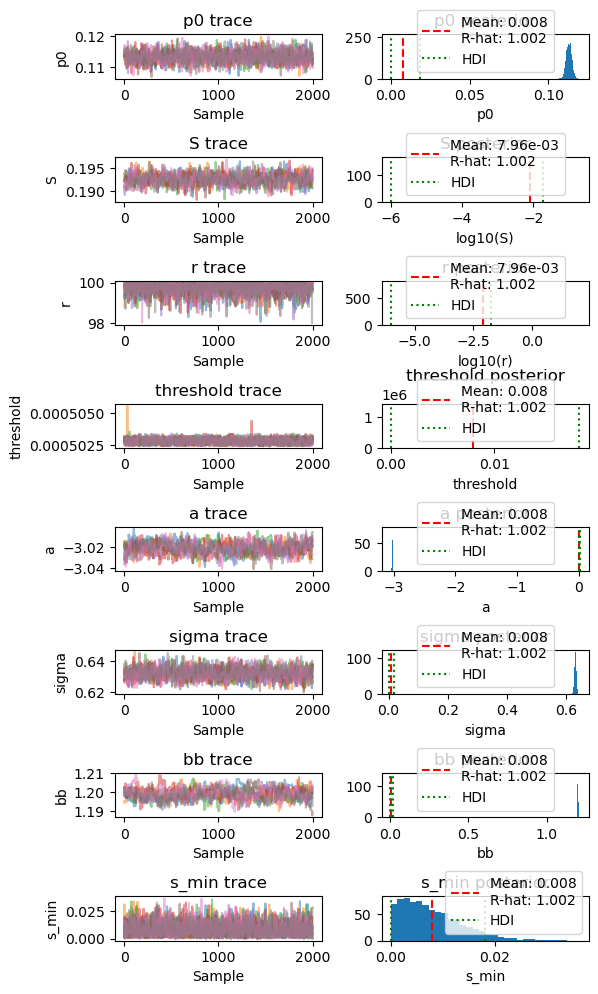

<Figure size 700x700 with 0 Axes>

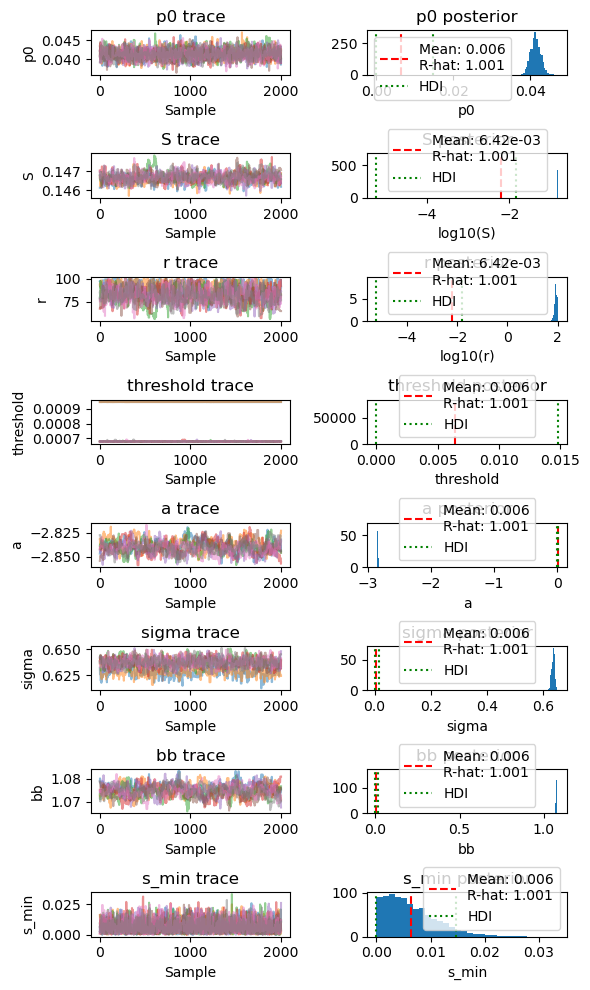

<Figure size 700x700 with 0 Axes>

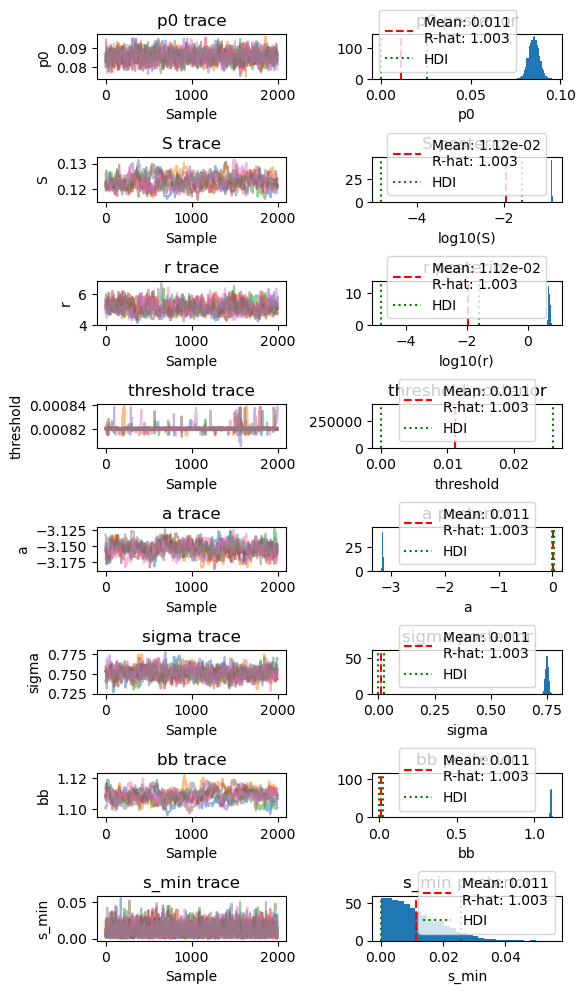

<Figure size 700x700 with 0 Axes>

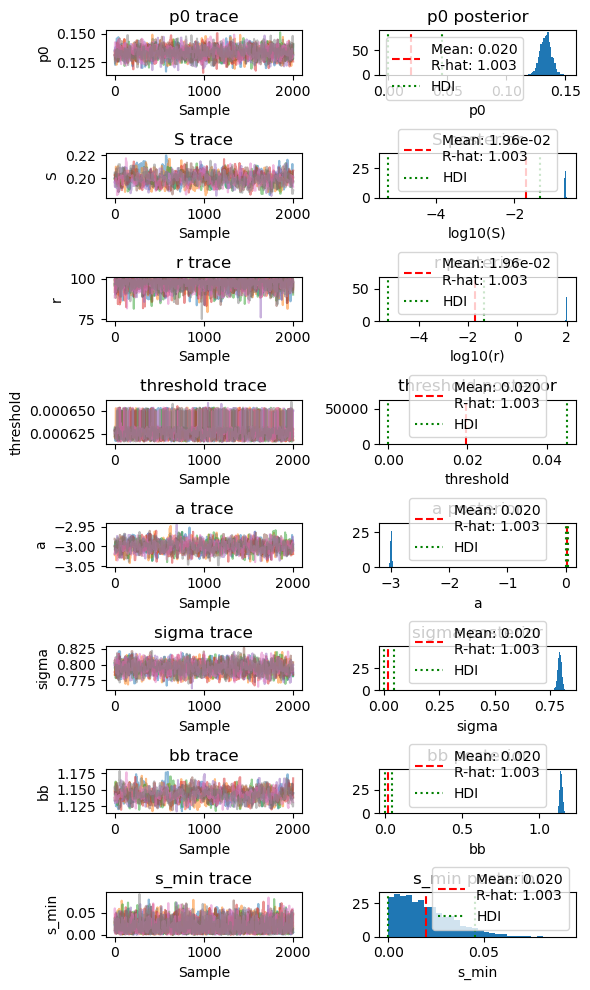

<Figure size 700x700 with 0 Axes>

In [6]:
import MCMC_1D_pyMC_cont_tasks as mcmc1Dcont_pyMC
mcmc1Dcont_pyMC = importlib.reload(mcmc1Dcont_pyMC)
surrogate_model_path = './MCMC_data/saved_1D_surrogate_models_d2_4_6'

show_plots = False

# Get some data

conditions = ['Ctrl','Aza','Dec','Vor']
programs = range(15)
data_dir = f'./MCMC_data/'
nmf_usage_file = f'./MCMC_data/data_NMF_usage_{cell_type}.csv'
nmf_data = pd.read_csv(nmf_usage_file)
print(f'Loaded NMF data for {cell_type}...')
cont_mcmc_dict = {}

for program_id in programs:
    for cond in conditions:
        
        k=f'{cond}-NMF{program_id}'
        prog_col = f'NMF_{program_id}'

        print(f'Processing {k}...')

        # Filter for condition and get relevant program column
        data = nmf_data[nmf_data['condition_orig'] == cond][['timepoint', prog_col]].copy()
        # Rename program column to 'score'
        
        data = data.rename(columns={prog_col: 'score'})
        print(f'Isolated NMF data for {cell_type}, {cond}, {prog_col}...')
        
        # Initialize the inference object with surrogate models
        cont_mcmc_dict[k] = mcmc1Dcont_pyMC.MCMCInference(surrogate_model_path=surrogate_model_path)

        # Load the mock data
        cont_mcmc_dict[k].load_data(data)

        # Setup and run MCMC
        cont_mcmc_dict[k].setup_model()
        cont_mcmc_dict[k].run_inference(
            draws=2000,
            tune=2000,
            chains=8,
            cores=8,
            show_progressbar=False
        )

        # Plot diagnostics
        cont_mcmc_dict[k].plot_diagnostics()
        hp.save_editable_pdf(plt.gcf(), f'./MCMC_data/plots/MCMC_1Dcont_diagnostics_{cell_type}_{cond}_factor{program_id}.pdf')
        if show_plots:
            plt.show()
        else:
            plt.close()

        # Plot predictions vs data
        cont_mcmc_dict[k].plot_predictions()
        hp.save_editable_pdf(plt.gcf(), f'./MCMC_data/plots/MCMC_1Dcont_predictions_{cell_type}_{cond}_factor{program_id}.pdf')
        if show_plots:
            plt.show()
        else:
            plt.close()

        # Save parameters to file
        row_data = mcmc1Dcont_pyMC.create_mcmc_summary_row(cont_mcmc_dict[k], program_id, cond)

        # Add new row
        cont_results_df = pd.concat([cont_results_df, pd.DataFrame([row_data])], ignore_index=True)
        # Save results
        cont_results_df.to_csv(cont_results_file, index=False)


cont_results_df


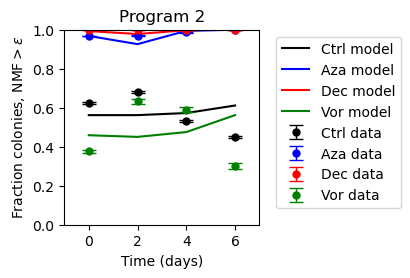

In [120]:
mcmc_plots = importlib.reload(mcmc_plots)

fig = mcmc_plots.plot_fraction_nonzero(cont_mcmc_dict, program_id=2, figsize=(3, 3))
hp.save_editable_pdf(fig, f'./MCMC_data/plots/MCMC_1Dcont_fraction_nonzero_{cell_type}_factor3_ALL.pdf')


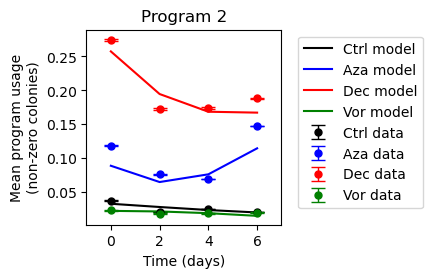

In [121]:
mcmc_plots = importlib.reload(mcmc_plots)

fig = mcmc_plots.plot_mean_usage(cont_mcmc_dict, program_id=2, figsize=(3, 3))
hp.save_editable_pdf(fig, f'./MCMC_data/plots/MCMC_1Dcont_mean_usage_{cell_type}_factor3_ALL.pdf')


In [122]:
cont_results_df.columns

Index(['program_id', 'condition', 'r01_mean', 'r01_std', 'r01_hdi_low',
       'r01_hdi_high', 'r10_mean', 'r10_std', 'r10_hdi_low', 'r10_hdi_high',
       'q01_mean', 'q01_std', 'q01_hdi_low', 'q01_hdi_high', 'q10_mean',
       'q10_std', 'q10_hdi_low', 'q10_hdi_high', 'S_mean', 'S_std',
       'S_hdi_low', 'S_hdi_high', 'r_mean', 'r_std', 'r_hdi_low', 'r_hdi_high',
       'p0_mean', 'p0_std', 'p0_hdi_low', 'p0_hdi_high', 'threshold_mean',
       'threshold_std', 'threshold_hdi_low', 'threshold_hdi_high', 'a_mean',
       'a_std', 'a_hdi_low', 'a_hdi_high', 'sigma_mean', 'sigma_std',
       'sigma_hdi_low', 'sigma_hdi_high', 'bb_mean', 'bb_std', 'bb_hdi_low',
       'bb_hdi_high', 's_min_mean', 's_min_std', 's_min_hdi_low',
       's_min_hdi_high'],
      dtype='object')

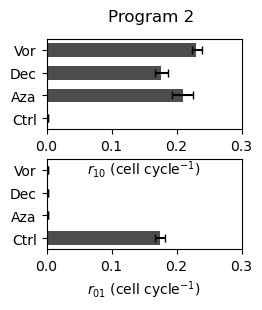

In [219]:
mcmc_plots = importlib.reload(mcmc_plots)
f = 2
cont_results_df = pd.read_csv(cont_results_file)
fig = mcmc_plots.plot_transition_rates(cont_results_df, f, figsize=(3, 3))
hp.save_editable_pdf(fig, f'./MCMC_data/plots/MCMC_1Dcont_transition_rates_{cell_type}_factor{f}_ALL.pdf')

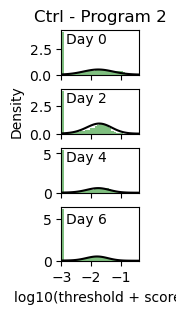

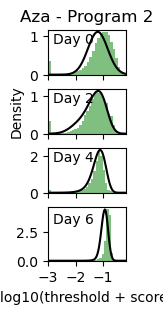

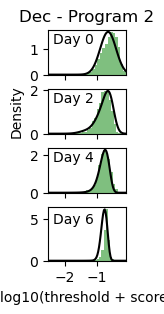

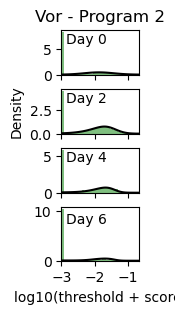

In [42]:
mcmc_plots = importlib.reload(mcmc_plots)
f = 2
for cond in conditions:
    fig=mcmc_plots.plot_histograms(cont_mcmc_dict, cond, f, figsize=(1.0, 3))
    hp.save_editable_pdf(fig, f'./MCMC_data/plots/MCMC_1Dcont_histograms_{cell_type}_{cond}factor{f}_ALL.pdf')


In [56]:
cont_results_df

,program_id,condition,r01_mean,r01_std,r01_hdi_low,r01_hdi_high,r10_mean,r10_std,r10_hdi_low,r10_hdi_high,...,sigma_hdi_low,sigma_hdi_high,bb_mean,bb_std,bb_hdi_low,bb_hdi_high,s_min_mean,s_min_std,s_min_hdi_low,s_min_hdi_high
0,3,Ctrl,0.002133,0.000133,0.001878,0.002334,0.211033,0.013142,0.186237,0.228770,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,3,Aza,0.083345,0.006570,0.069958,0.094853,0.121380,0.006601,0.106343,0.130690,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,Dec,0.065156,0.007159,0.055040,0.079866,0.096052,0.017226,0.052605,0.109287,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,Vor,0.139166,0.003551,0.132397,0.145494,0.035912,0.003406,0.029093,0.042095,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,3,Ctrl,0.002123,0.000090,0.001969,0.002299,0.209902,0.008817,0.195313,0.227796,...,0.818736,0.933071,1.382274,0.023354,1.340355,1.425593,0.595926,0.046242,0.509632,0.681658
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
79,13,Vor,0.001446,0.000107,0.001301,0.001650,0.133643,0.002566,0.128888,0.138399,...,0.763925,0.797382,1.214087,0.005682,1.203435,1.224194,0.020610,0.014952,0.000010,0.047230
80,14,Ctrl,0.009906,0.001052,0.008103,0.012101,0.097420,0.001578,0.094355,0.100255,...,0.826860,0.850101,1.408228,0.005150,1.397855,1.417469,0.014080,0.010544,0.000001,0.033001
81,14,Aza,0.002092,0.000139,0.001868,0.002366,0.196827,0.006926,0.184259,0.210183,...,0.943925,1.006393,1.396615,0.022399,1.357400,1.442309,0.044462,0.032554,0.000021,0.102630
82,14,Dec,0.001961,0.000081,0.001811,0.002116,0.190609,0.006252,0.178403,0.202442,...,1.087429,1.182430,1.369304,0.024359,1.321712,1.411436,0.086467,0.056804,0.000156,0.183186


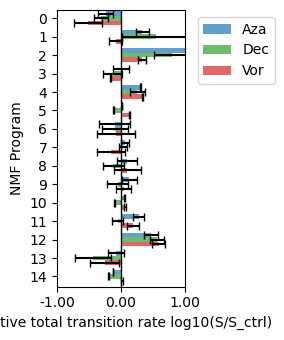

In [128]:
mcmc_plots = importlib.reload(mcmc_plots)
fig = mcmc_plots.plot_relative_transition_rates(cont_results_df, param='S',figsize=(3,3.5),xscale='log',xlim=(10**(-1),10**1))
#fig.axes[0].set_xlim(0.1,10)  # Set y-axis limits from 0 to 1.2
hp.save_editable_pdf(fig, f'./MCMC_data/plots/MCMC_1Dcont_relative_transition_rates_{cell_type}_S_ALL.pdf')
plt.show()

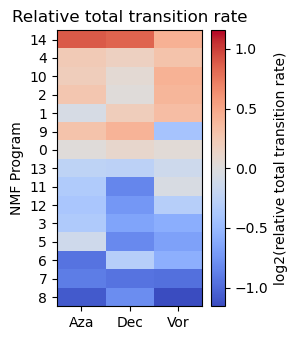

In [84]:
mcmc_plots = importlib.reload(mcmc_plots)

fig = mcmc_plots.plot_relative_transition_rates_heatmap(cont_results_df, param='S',figsize=(3,3.5),clim=None)
hp.save_editable_pdf(fig, f'./MCMC_data/plots/MCMC_1Dcont_relative_transition_rates_{cell_type}_S_heatmap.pdf')
plt.show()

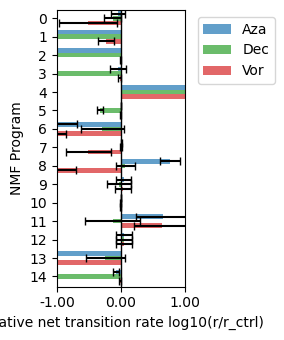

In [129]:
mcmc_plots = importlib.reload(mcmc_plots)

fig = mcmc_plots.plot_relative_transition_rates(cont_results_df, param='r',figsize=(3,3.5), xscale='log',xlim=(0.1,10))
#fig.axes[0].set_xlim(0.1,10)  # Set y-axis limits from 0 to 1.2

hp.save_editable_pdf(fig, f'./MCMC_data/plots/MCMC_1Dcont_relative_transition_rates_{cell_type}_r_ALL.pdf')
plt.show()

# Example usage:
# fig = plot_relative_transition_rates(cont_results_df, param='S')
# fig = plot_relative_transition_rates(cont_results_df, param='r01')
# fig = plot_relative_transition_rates(cont_results_df, param='r10')
# fig = plot_relative_transition_rates(cont_results_df, param='r')

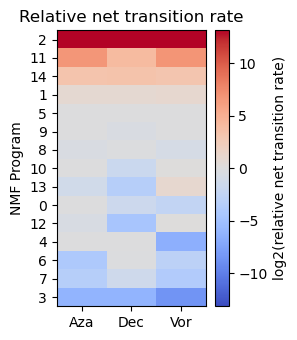

In [85]:
mcmc_plots = importlib.reload(mcmc_plots)

fig = mcmc_plots.plot_relative_transition_rates_heatmap(cont_results_df, param='r',figsize=(3,3.5),clim=None)
hp.save_editable_pdf(fig, f'./MCMC_data/plots/MCMC_1Dcont_relative_rate_ratio_{cell_type}_r_heatmap.pdf')
plt.show()

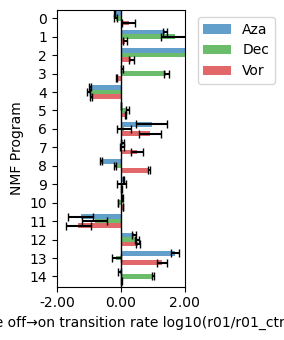

In [3]:
mcmc_plots = importlib.reload(mcmc_plots)
fig = mcmc_plots.plot_relative_transition_rates(cont_results_df, param='r01',figsize=(3,3.5), xscale='log',xlim=(0.01,100))
#fig.axes[0].set_xlim(0.8, 200)  # or whatever limits you want
hp.save_editable_pdf(fig, f'./MCMC_data/plots/MCMC_1Dcont_relative_transition_rates_{cell_type}_r01_ALL.pdf')
plt.show()

# Example usage:
# fig = plot_relative_transition_rates(cont_results_df, param='S')
# fig = plot_relative_transition_rates(cont_results_df, param='r01')
# fig = plot_relative_transition_rates(cont_results_df, param='r10')
# fig = plot_relative_transition_rates(cont_results_df, param='r')

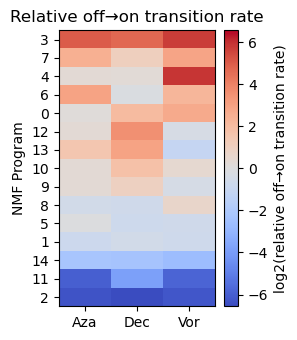

In [86]:
mcmc_plots = importlib.reload(mcmc_plots)

fig = mcmc_plots.plot_relative_transition_rates_heatmap(cont_results_df, param='r01',figsize=(3,3.5),clim=None)
hp.save_editable_pdf(fig, f'./MCMC_data/plots/MCMC_1Dcont_relative_on_rate_{cell_type}_r01_heatmap.pdf')
plt.show()

In [8]:
mcmc_plots = importlib.reload(mcmc_plots)

fig = mcmc_plots.plot_relative_transition_rates(cont_results_df, param='r10',figsize=(3,3.5), xscale='log',xlim=(0.01,100))
#fig.axes[0].set_xlim(0.8, 10)  # or whatever limits you want
hp.save_editable_pdf(fig, f'./MCMC_data/plots/MCMC_1Dcont_relative_transition_rates_{cell_type}_r10_ALL.pdf')
plt.show()

# Example usage:
# fig = plot_relative_transition_rates(cont_results_df, param='S')
# fig = plot_relative_transition_rates(cont_results_df, param='r01')
# fig = plot_relative_transition_rates(cont_results_df, param='r10')
# fig = plot_relative_transition_rates(cont_results_df, param='r')

TypeError: plot_relative_transition_rates() got an unexpected keyword argument 'xlim'

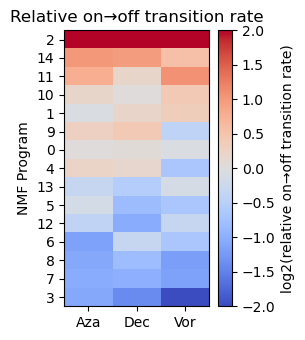

In [88]:
mcmc_plots = importlib.reload(mcmc_plots)

fig = mcmc_plots.plot_relative_transition_rates_heatmap(cont_results_df, param='r10',figsize=(3,3.5),clim=[-2,2])
hp.save_editable_pdf(fig, f'./MCMC_data/plots/MCMC_1Dcont_relative_off_rate_{cell_type}_r10_heatmap.pdf')
plt.show()

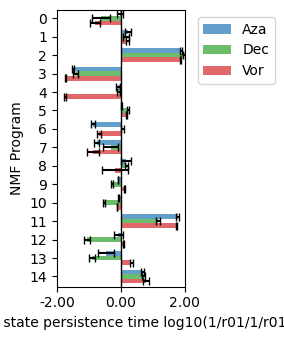

In [15]:
mcmc_plots = importlib.reload(mcmc_plots)
fig = mcmc_plots.plot_relative_transition_rates(cont_results_df, param='1/r01',figsize=(3,3.5), xscale='log',xlim=(0.01,100))
#fig.axes[0].set_xlim(0.8, 200)  # or whatever limits you want
hp.save_editable_pdf(fig, f'./MCMC_data/plots/MCMC_1Dcont_relative_persistence_time_{cell_type}_t0_ALL.pdf')
plt.show()



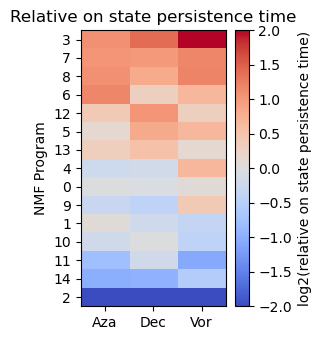

In [89]:
mcmc_plots = importlib.reload(mcmc_plots)

fig = mcmc_plots.plot_relative_transition_rates_heatmap(cont_results_df, param='1/r10',figsize=(3,3.5),clim=[-2,2])
hp.save_editable_pdf(fig, f'./MCMC_data/plots/MCMC_1Dcont_relative_on_time_{cell_type}_t1_heatmap.pdf')
plt.show()

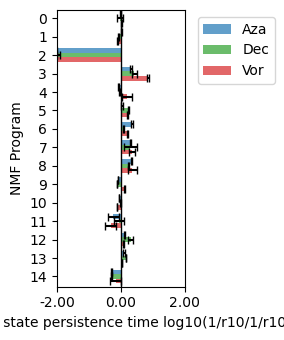

In [16]:
mcmc_plots = importlib.reload(mcmc_plots)
fig = mcmc_plots.plot_relative_transition_rates(cont_results_df, param='1/r10',figsize=(3,3.5), xscale='log',xlim=(0.01,100))
#fig.axes[0].set_xlim(0.8, 200)  # or whatever limits you want
hp.save_editable_pdf(fig, f'./MCMC_data/plots/MCMC_1Dcont_relative_persistence_time_{cell_type}_t1_ALL.pdf')
plt.show()



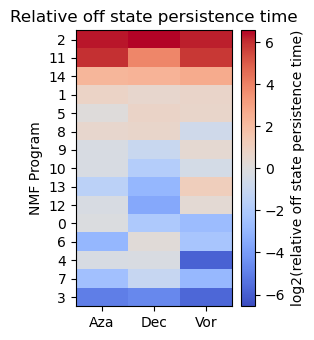

In [92]:
mcmc_plots = importlib.reload(mcmc_plots)

fig = mcmc_plots.plot_relative_transition_rates_heatmap(cont_results_df, param='1/r01',figsize=(3,3.5),clim=None)
hp.save_editable_pdf(fig, f'./MCMC_data/plots/MCMC_1Dcont_relative_off_time_{cell_type}_t0_heatmap.pdf')
plt.show()

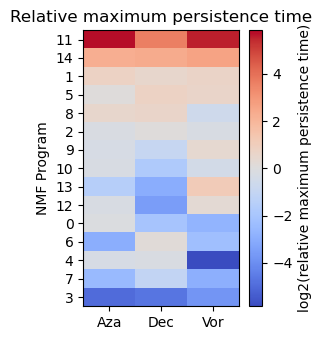

In [94]:
mcmc_plots = importlib.reload(mcmc_plots)

fig = mcmc_plots.plot_relative_transition_rates_heatmap(cont_results_df, param='min_t',figsize=(3,3.5),clim=None)
hp.save_editable_pdf(fig, f'./MCMC_data/plots/MCMC_1Dcont_relative_max_persistence_time_{cell_type}_min_t_heatmap.pdf')
plt.show()

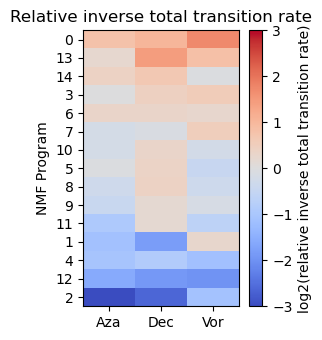

In [210]:
mcmc_plots = importlib.reload(mcmc_plots)

fig = mcmc_plots.plot_relative_transition_rates_heatmap(cont_results_df, param='1/S',figsize=(3,3.5),clim=[-3,3])
hp.save_editable_pdf(fig, f'./MCMC_data/plots/MCMC_1Dcont_relative_persistence_time_{cell_type}_1_S_heatmap.pdf')
plt.show()

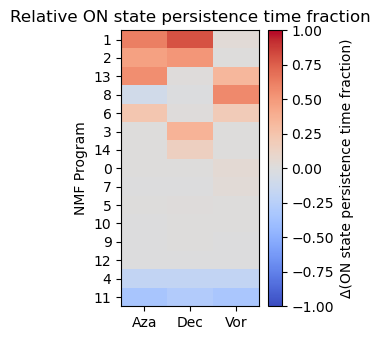

In [208]:
mcmc_plots = importlib.reload(mcmc_plots)

fig = mcmc_plots.plot_relative_transition_rates_heatmap(cont_results_df, param='t1_frac',figsize=(3,3.5),clim=[-1,1])
hp.save_editable_pdf(fig, f'./MCMC_data/plots/MCMC_1Dcont_relative_bias_{cell_type}_t1_frac_heatmap.pdf')
plt.show()

# Final plots

In [220]:
components_file_name = f'./Table S2 sheets/NMF_factors_raw_{cell_type}.csv'
deg_results_file_name = f'./Table S2 sheets/{cell_type}_deg_results_dict.pkl'

cont_results_df = pd.read_csv(cont_results_file)
H = pd.read_csv(components_file_name)
# Set 'Unnamed: 0' column as index and rename it to 'Gene name'
H = H.set_index('Unnamed: 0')
H.index.name = 'Gene name'
print(H)

deg_results_dict = pickle.load(open(deg_results_file_name, 'rb'))




              Factor_0  Factor_1  Factor_2  Factor_3  Factor_4  Factor_5  \
Gene name                                                                  
A2M_hg        0.000000  0.000000  0.000000  0.000000  0.022258  0.000000   
AADACL4_hg    0.000000  0.000038  0.000100  0.000000  0.000000  0.000354   
AAK1_hg       0.017046  0.502765  1.818315  0.136235  1.632887  0.175059   
AARS1_hg      0.000000  0.925945  1.796289  0.906351  0.000000  0.163400   
ABCA1_hg      0.000000  0.000000  0.000000  0.000000  0.038929  0.000000   
...                ...       ...       ...       ...       ...       ...   
ZNRF3-AS1_hg  0.000000  0.336404  0.011996  0.000000  0.017346  0.038567   
ZNRF4_hg      0.000070  0.000000  0.000000  0.000977  0.000000  0.000000   
ZSCAN18_hg    0.000000  0.020368  0.045976  0.052787  0.009097  0.000000   
ZSCAN30_hg    0.000000  0.372820  0.328409  0.345408  0.490414  0.000000   
ZYX_hg        0.000000  0.000000  0.004703  0.000000  1.443501  0.072064   

           

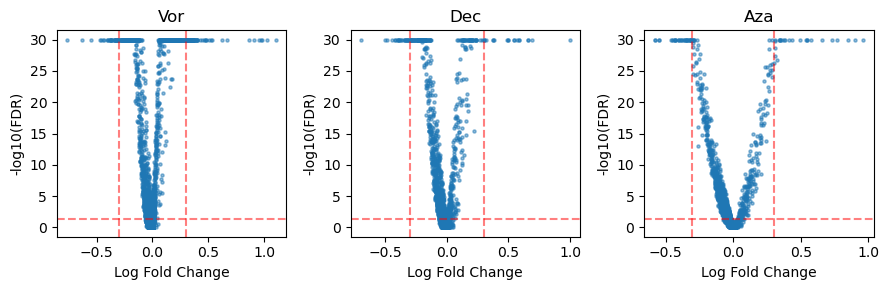

In [221]:
# Create figure with 3 subplots side by side
fig, axes = plt.subplots(1, 3, figsize=(9, 3))

# Plot for each drug
for i, (drug, df) in enumerate(deg_results_dict.items()):
    # Check for NaN values
    if df['combined_fdr'].isna().any():
        print(f"Warning: {drug} has {df['combined_fdr'].isna().sum()} NaN FDR values")
    
    # Convert FDR to -log10, saturating at 30
    log_fdr = -np.log10(df['combined_fdr'].clip(lower=1e-30))
    
    # Create volcano plot
    axes[i].scatter(df['mean_logFC'], log_fdr, alpha=0.5, s=5)
    axes[i].set_xlabel('Log Fold Change')
    axes[i].set_ylabel('-log10(FDR)')
    axes[i].set_title(drug)
    
    # Add horizontal line at FDR=0.05
    axes[i].axhline(-np.log10(0.05), color='red', linestyle='--', alpha=0.5)
    
    # Add vertical lines at log2FC = ±1
    axes[i].axvline(-np.log10(2), color='red', linestyle='--', alpha=0.5)
    axes[i].axvline(np.log10(2), color='red', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

In [222]:
mcmc_plots = importlib.reload(mcmc_plots)
gene_persistence_times_dict = mcmc_plots.calculate_gene_persistence_times(cont_results_df, H, conditions=['Ctrl', 'Aza', 'Dec', 'Vor'], debug=True )
gene_persistence_times_dict['1/S']


# fig = mcmc_plots.plot_persistence_vs_expression(deg_results_dict,
#                                                 gene_persistence_times_df,
#                                                 H=H, top_n_genes=100,
#                                                 annotate_genes=['VIM_hg','KRT8_hg',
#                                                                 'HBZ_hg','ALAS2_hg',
#                                                                 'SLC25A37_hg',
#                                                                 'FOS_hg',
#                                                                 'TOP2A_hg'])
# hp.save_editable_pdf(fig, f'./MCMC_data/plots/MCMC_1D_del_on_time_vs_log2FC_{cell_type}.pdf')
# plt.show()






First 3 genes' loadings into components:
            Factor_0  Factor_1  Factor_2  Factor_3  Factor_4  Factor_5  \
Gene name                                                                
A2M_hg      0.000000  0.000000  0.000000  0.000000  0.022258  0.000000   
AADACL4_hg  0.000000  0.000038  0.000100  0.000000  0.000000  0.000354   
AAK1_hg     0.017046  0.502765  1.818315  0.136235  1.632887  0.175059   

            Factor_6  Factor_7  Factor_8  Factor_9  Factor_10  Factor_11  \
Gene name                                                                  
A2M_hg      0.000000  0.000000       0.0  0.000000   0.000000   0.000000   
AADACL4_hg  0.000021  0.000035       0.0  0.000000   0.000000   0.000000   
AAK1_hg     0.000000  0.045156       0.0  0.280209   0.017025   0.170805   

            Factor_12  Factor_13  Factor_14  
Gene name                                    
A2M_hg            0.0        0.0   0.000000  
AADACL4_hg        0.0        0.0   0.000000  
AAK1_hg           0.0  

,Ctrl,Aza,Dec,Vor
Gene name,,,,
A2M_hg,5.837935,4.974673,5.192269,4.750926
AADACL4_hg,3.664176,4.261781,5.434245,5.001222
AAK1_hg,5.831756,4.723683,5.176989,4.826931
AARS1_hg,4.753087,5.535262,6.075135,5.041004
ABCA1_hg,5.837935,4.974673,5.192269,4.750926
...,...,...,...,...
ZNRF3-AS1_hg,5.172389,5.124832,4.784924,4.437475
ZNRF4_hg,4.409552,5.754022,6.634298,6.445081
ZSCAN18_hg,4.964028,5.197272,6.040686,5.088989


In [223]:
#plt.scatter(deg_results_dict['Aza']['mean_logFC'], -np.log10(deg_results_dict['Aza']['combined_fdr']))
np.sum(np.abs(deg_results_dict['Aza']['mean_logFC'])>=0.1)

467

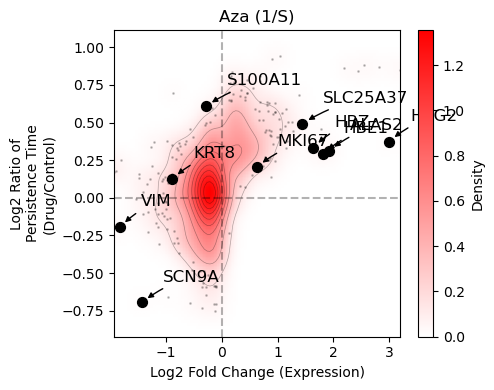

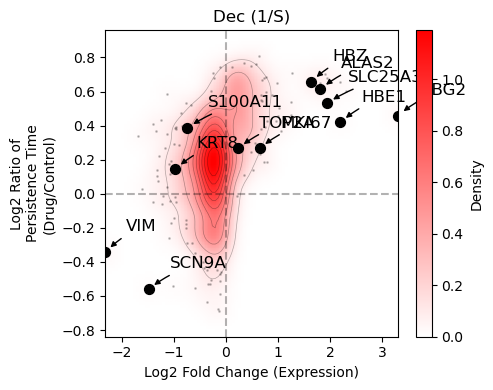

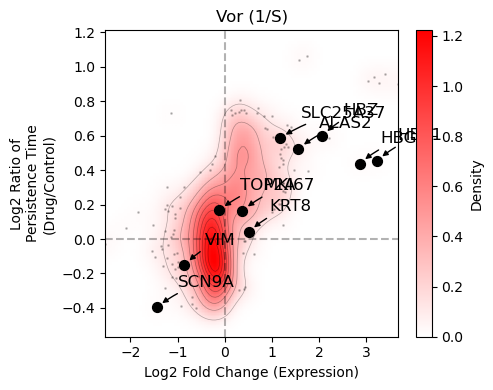

In [224]:
mcmc_plots = importlib.reload(mcmc_plots)

cond = ['Aza','Dec','Vor']

gene_list = {}
gene_list['k562'] = ['VIM_hg','KRT8_hg',
                'HBE1_hg','HBG2_hg',
                'HBZ_hg','ALAS2_hg',
                'SLC25A37_hg',
                'MKI67_hg',
                'TOP2A_hg',
                'S100A11_hg',
                'SCN9A_hg']
gene_list['l1210'] = ['Sirt5_mm']


for c in cond:
    fig=mcmc_plots.plot_persistence_vs_expression_density(deg_results_dict, gene_persistence_times_dict, 
                                            transition_type='1/S',
                                            drug=c, figsize=(5,4),
                                            H=H, top_n_genes=20, 
                                            annotate_genes=gene_list[cell_type], 
                                            bins=100, levels=10, smooth_sigma=30,
                                            annotate_outliers=False)
    hp.save_editable_pdf(fig, f'./MCMC_data/plots/MCMC_1D_persistence_vs_expression_density_{c}{cell_type}.pdf')
    plt.show()


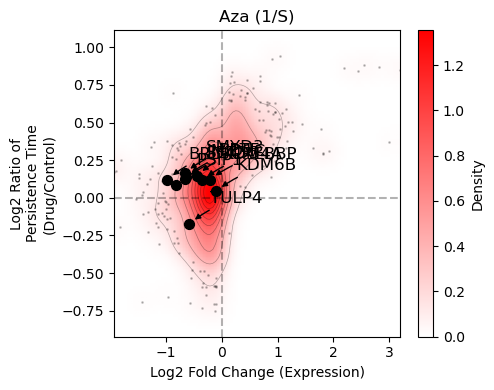

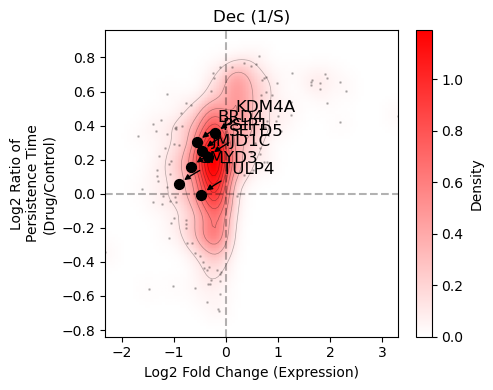

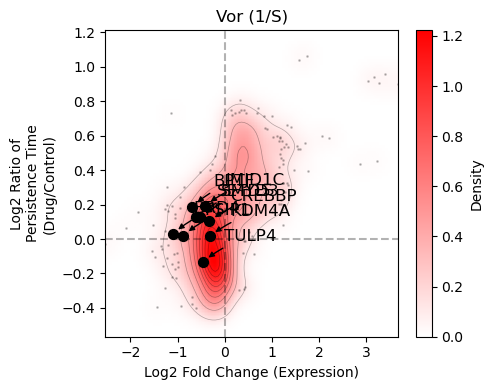

In [226]:
mcmc_plots = importlib.reload(mcmc_plots)

cond = ['Aza','Dec','Vor']

epi_gene_list = {}
epi_gene_list['k562'] = [
'BPTF_hg',
'BRD4_hg',
'CREBBP_hg',
'FTO_hg',
'JMJD1C_hg',
'KDM4A_hg',
'KDM6B_hg',
'PRMT8_hg',
'PSIP1_hg',
'RAG2_hg',
'SETD5_hg',
'SMYD3_hg',
'TULP4_hg'
]


for c in cond:
    fig=mcmc_plots.plot_persistence_vs_expression_density(deg_results_dict, gene_persistence_times_dict, 
                                            transition_type='1/S',
                                            drug=c, figsize=(5,4),
                                            H=H, top_n_genes=20, 
                                            annotate_genes=epi_gene_list[cell_type], 
                                            bins=100, levels=10, smooth_sigma=30,
                                            annotate_outliers=False)
    #hp.save_editable_pdf(fig, f'./MCMC_data/plots/MCMC_1D_persistence_vs_expression_density_{c}{cell_type}.pdf')
    plt.show()
